## 2 - Export Data Assessment (Fixation)

##### Imports

In [1]:
import os
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [4]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=True):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data [file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata): # Manually read the column
    output = []
    for line in filedata.split('\n'): # split into lines
        line = line.strip().rstrip(']').lstrip('[') #remove whitespace and brackets
        if not line:  
            continue    #skip empty lines
        line = line.split() #split into cell
        row = []
        for cell in line:
            cell = cell.strip()     #remove whitespace
            if not cell.strip():
                continue    #skip empty cells
            row.append(float(cell)) #convert to float and add
        output.append(row)
    return output
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)

In [5]:
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
columns = ['participant_id', 'id', 'start_timestamp', 'duration', 'norm_pos_x', 'norm_pos_y', 'dispersion', 'confidence', 'base_data']
ddf = data['all_fixations'].loc[:, columns]
df = ddf.compute()

### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail

In [4]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
0,1,-672842.769080,148.1535,0.301379,0.614358,1.212507,1.000000,-672842.76908 -672842.765075 -672842.7610975 -...
1,2,-672842.609103,80.0720,0.284721,0.616922,1.385789,0.998689,-672842.6091034999 -672842.605067 -672842.6010...
2,3,-672842.523645,218.5675,0.283216,0.624409,1.180783,1.000000,-672842.5236450001 -672842.5191845 -672842.514...
3,4,-672842.301084,93.2860,0.281796,0.603495,1.036320,0.996165,-672842.301084 -672842.29706 -672842.2930355 -...
4,5,-672842.185009,187.9690,0.293758,0.645301,1.441071,0.994888,-672842.1850085 -672842.180985 -672842.177026 ...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
20175,20176,-668800.214094,83.986,0.424588,0.387870,1.453803,1.000000,-668800.2140935 -668800.21008 -668800.206092 -...
20176,20177,-668800.126107,148.018,0.424283,0.395325,1.430637,0.998085,-668800.126107 -668800.1221255 -668800.118124 ...
20177,20178,-668799.974053,219.912,0.420823,0.371002,1.277702,0.999306,-668799.9740535 -668799.970078 -668799.966045 ...
20178,20179,-668799.750137,216.024,0.424694,0.373299,0.573793,0.998290,-668799.7501375 -668799.746117 -668799.7421200...
20179,20180,-668799.530128,216.006,0.425180,0.378816,1.094980,0.999540,-668799.5301280001 -668799.5261515 -668799.522...


'Participant 2'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
20180,0,-664549.411054,132.0735,0.368526,0.581484,1.475932,0.945039,-664549.411054 -664549.4070455 -664549.403063 ...
20181,1,-664549.167066,98.0655,0.521951,0.707198,1.428618,1.000000,-664549.1670659999 -664549.16105 -664549.15704...
20182,2,-664549.035020,95.9920,0.534950,0.731283,1.349427,0.999800,-664549.0350200001 -664549.0310195 -664549.027...
20183,3,-664548.799011,108.0520,0.515786,0.405836,1.446544,0.994259,-664548.7990105001 -664548.7949620001 -664548....
20184,4,-664548.686991,106.0485,0.503945,0.396734,1.296692,0.993952,-664548.6869910001 -664548.6830559999 -664548....


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
35798,15618,-661486.650288,90.0955,0.421228,0.576385,1.026307,0.998717,-661486.650288 -661486.646273 -661486.642298 -...
35799,15619,-661486.548118,87.8775,0.451909,0.578467,1.308365,0.987793,-661486.5481175 -661486.5441605 -661486.540153...
35800,15620,-661486.356165,181.9160,0.449336,0.338482,1.485863,0.927932,-661486.356165 -661486.3521634999 -661486.3481...
35801,15621,-661485.588267,92.6600,0.599996,0.278604,1.470206,0.885607,-661485.5882669999 -661485.5842929999 -661485....
35802,15622,-661485.473982,81.7245,0.578997,0.271293,1.468326,0.921648,-661485.473982 -661485.4695935 -661485.467619 ...


'Participant 4'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
35803,0,-587761.779642,217.7145,0.610686,0.749261,1.221079,0.950253,-587761.7796425 -587761.7757925 -587761.772075...
35804,1,-587761.557930,217.7975,0.606847,0.752356,0.703759,0.959226,-587761.55793 -587761.5540255001 -587761.55009...
35805,2,-587761.336120,218.0500,0.601270,0.754168,1.315270,0.956698,-587761.3361205 -587761.3320665001 -587761.328...
35806,3,-587761.114027,217.9465,0.598575,0.755466,1.384675,0.968217,-587761.1140265 -587761.110005 -587761.1061135...
35807,4,-587760.892013,218.2080,0.592968,0.758685,0.564100,0.967717,-587760.8920135 -587760.8879994999 -587760.884...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
50746,14943,-584621.187555,80.4040,0.466703,0.722718,1.368042,0.965616,-584621.1875545001 -584621.1835585 -584621.179...
50747,14944,-584621.103486,182.2085,0.481646,0.732705,1.215676,0.966762,-584621.1034860001 -584621.0993925 -584621.095...
50748,14945,-584620.667593,85.2070,0.477199,0.373129,0.703529,0.787595,-584620.667593 -584620.6355 -584620.627457 -58...
50749,14946,-584620.143528,148.0010,0.543677,-0.053276,1.074297,0.799427,-584620.143528 -584620.135574 -584620.118202 -...
50750,14947,-584619.624441,148.7960,0.546129,0.078967,0.505237,0.697131,-584619.6244409999 -584619.493746 -584619.4886...


'Participant 5'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
50751,0,-578913.168452,129.9825,0.377453,0.535008,1.481941,0.985916,-578913.1684515 -578913.1645279999 -578913.160...
50752,1,-578913.034458,99.9995,0.381367,0.517934,0.778583,0.992123,-578913.0344585 -578913.0304715 -578913.026501...
50753,2,-578912.911137,219.6005,0.381222,0.519116,0.992084,0.988477,-578912.9111365001 -578912.906557 -578912.9025...
50754,3,-578912.658456,207.9205,0.368672,0.516807,1.186978,0.979339,-578912.6584555 -578912.654513 -578912.650523 ...
50755,4,-578912.442457,145.8925,0.359775,0.563268,1.486089,0.982026,-578912.442457 -578912.4384580001 -578912.4344...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
68073,17322,-575206.021875,90.4875,0.391203,0.487111,1.378160,0.997168,-575206.0218750001 -575206.0179045 -575206.013...
68074,17323,-575205.927444,99.5640,0.385490,0.480889,1.355838,0.988808,-575205.9274435 -575205.9237115 -575205.919708...
68075,17324,-575205.803703,109.8245,0.389979,0.438082,1.475158,0.978577,-575205.8037030001 -575205.799629 -575205.7957...
68076,17325,-575205.689918,84.0480,0.393130,0.462396,1.337434,0.994940,-575205.6899175 -575205.6859225 -575205.681934...
68077,17326,-575204.313881,83.9015,0.655529,0.219592,1.388146,0.978070,-575204.313881 -575204.309899 -575204.305878 -...


'Participant 6'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
68078,0,82162.351230,96.0700,0.340882,0.764306,1.474356,1.000000,82162.35123 82162.35523700001 82162.3592765 82...
68079,1,82162.451296,105.9035,0.343130,0.778639,0.839592,1.000000,82162.45129550001 82162.4552815 82162.459256 8...
68080,2,82162.589374,217.8960,0.400817,0.842491,1.124163,1.000000,82162.589374 82162.59322099999 82162.5972175 8...
68081,3,82162.933389,219.8840,0.352898,1.139743,1.423748,0.999569,82162.933389 82162.93730349999 82162.941299 82...
68082,4,82163.383212,138.0665,0.528563,0.587488,1.422107,0.999767,82163.383212 82163.387248 82163.3912715 82163....


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
84186,16108,85413.777830,195.5490,0.366062,0.520257,1.346463,0.989874,85413.77783 85413.781591 85413.78533 85413.789...
84187,16109,85414.125348,127.9345,0.263184,0.795467,1.495174,0.997311,85414.125348 85414.129333 85414.135337 85414.1...
84188,16110,85414.325334,219.9870,0.339377,0.593849,1.082816,0.981734,85414.3253335 85414.329324 85414.3333005 85414...
84189,16111,85414.549342,180.0080,0.341383,0.612672,0.973619,0.983022,85414.549342 85414.5533235 85414.5572985 85414...
84190,16112,85415.277354,119.9930,0.498385,0.380747,1.494746,0.983288,85415.2773535 85415.281334 85415.2853165 85415...


'Participant 7'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
84191,0,349980.479169,216.1115,0.347654,0.763354,0.351206,0.988321,349980.47916949994 349980.4831655 349980.48718...
84192,1,349980.699308,111.8995,0.349928,0.760863,0.669766,0.996315,349980.69930750004 349980.703357 349980.708099...
84193,2,349980.867195,172.0340,0.173773,0.820323,1.207050,0.972773,349980.867195 349980.87530799996 349980.883165...
84194,3,349981.183209,151.9870,0.176810,0.879218,1.323410,0.951593,349981.183209 349981.191222 349981.19925299997...
84195,4,349981.343196,112.0460,0.186350,0.876010,1.382442,0.968349,349981.343196 349981.351211 349981.359292 3499...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
99446,15255,353175.080266,217.9835,0.433508,0.534485,1.091996,0.936174,353175.0802655 353175.0842535 353175.088253999...
99447,15256,353175.484220,92.0070,0.588159,0.784845,1.487238,1.000000,353175.4842205 353175.4882265 353175.492269 35...
99448,15257,353175.580234,161.9865,0.588829,0.786820,0.813163,1.000000,353175.5802345 353175.58424649993 353175.58824...
99449,15258,353175.766200,80.0355,0.631342,0.869086,1.488154,1.000000,353175.76619999995 353175.770181 353175.77422 ...
99450,15259,353175.850196,130.1125,0.634530,0.881934,1.252869,1.000000,353175.85019599996 353175.8542065 353175.85821...


'Participant 8'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
99451,1,4131.658653,101.9725,0.713272,0.710431,1.103937,1.000000,4131.658653 4131.662606 4131.666616 4131.67063...
99452,2,4131.768617,178.0000,0.735688,0.719751,1.186568,0.991623,4131.768617 4131.7726385 4131.77664 4131.78064...
99453,3,4132.006637,160.0400,0.603999,0.749725,1.358584,1.000000,4132.006637 4132.0106615 4132.0146975 4132.018...
99454,4,4132.228612,218.0135,0.334845,0.725272,1.469664,0.999909,4132.228612499999 4132.2326275 4132.236609 413...
99455,5,4132.531638,216.9815,0.223367,0.731955,1.405990,0.999362,4132.5316375 4132.5346355 4132.5408879999995 4...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
9137,12813,7343.703983,128.0295,0.482032,0.592310,0.783071,1.000000,7343.703982999999 7343.710642499999 7343.71539...
9138,12814,7343.850087,217.9155,0.495627,0.534113,1.360154,1.000000,7343.850087499999 7343.8540225 7343.8579684999...
9139,12815,7344.071966,189.8175,0.497863,0.541083,1.226896,1.000000,7344.0719659999995 7344.0759495 7344.0799785 7...
9140,12816,7344.322018,181.9705,0.617826,0.549011,1.491510,0.944510,7344.322017999999 7344.3259755 7344.329995 734...
9141,12817,7344.512133,218.2570,0.605102,0.547050,1.053427,0.970226,7344.512133499999 7344.51618 7344.520068 7344....


'Participant 9'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
9142,2,22196.721049,89.9510,0.676299,0.749840,1.439504,1.000000,22196.721049 22196.725052 22196.72898 22196.73...
9143,3,22196.817263,107.6910,0.689773,0.727319,1.341923,1.000000,22196.817263 22196.8212055 22196.825005500003 ...
9144,4,22196.930663,182.2830,0.695583,0.705819,1.330062,1.000000,22196.9306635 22196.934645 22196.9369735 22196...
9145,5,22197.152956,80.0500,0.524932,0.679294,1.436214,0.999286,22197.152955999998 22197.156975500002 22197.16...
9146,6,22197.237070,91.9265,0.533881,0.670293,0.832856,1.000000,22197.237070000003 22197.241061 22197.244962 2...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
25451,16311,25448.354257,216.0460,0.602510,0.588066,1.431660,0.998564,25448.3542575 25448.3582495 25448.362258 25448...
25452,16312,25448.662308,139.9915,0.480280,0.663080,1.446487,0.999722,25448.662308 25448.66628 25448.671014500003 25...
25453,16313,25448.806516,219.7205,0.465066,0.670167,1.464681,1.000000,25448.806516 25448.810693 25448.8144845 25448....
25454,16314,25449.030262,171.4000,0.462137,0.681359,1.064013,0.999690,25449.030262 25449.034295999998 25449.0382915 ...
25455,16315,25449.282283,219.9590,0.448066,0.690154,1.364619,0.998252,25449.2822825 25449.2862825 25449.2902915 2544...


'Participant 10'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
25456,2,5423.318582,104.0890,0.777565,0.549255,1.391338,0.937886,5423.318582 5423.3226465 5423.3265895 5423.332...
25457,3,5423.558621,195.9220,0.864357,0.189100,1.483534,1.000000,5423.558621 5423.562634 5423.5666095 5423.5705...
25458,4,5423.758540,112.0070,0.876271,0.180323,1.070243,1.000000,5423.758540499999 5423.762532999999 5423.76652...
25459,5,5424.030516,112.0570,0.449054,-0.108809,1.422247,1.000000,5424.0305165 5424.034514499999 5424.0385289999...
25460,6,5424.146623,126.2615,0.459879,-0.099460,1.473835,0.999403,5424.146623 5424.1506025 5424.154589 5424.1585...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
41399,15945,8721.260496,97.1195,0.506179,0.147718,1.499890,0.932559,8721.2604965 8721.263936 8721.267882 8721.2718...
41400,15946,8721.791693,115.8975,0.510362,-0.342969,1.129350,0.754601,8721.7916935 8721.795794000001 8721.799682 872...
41401,15947,8722.495624,111.5935,0.558114,-0.224122,1.370370,0.748107,8722.4956235 8722.4996745 8722.50461 8722.5085...
41402,15948,8722.693618,86.2650,0.554693,-0.246767,1.348133,0.738259,8722.693617500001 8722.6976845 8722.7036425 87...
41403,15949,8723.348737,142.3610,0.509074,-0.168377,1.371140,0.675251,8723.3487365 8723.3527685 8723.373115999999 87...


'Participant 11'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
41404,4,16541.633343,147.9840,0.539198,0.778977,1.396129,1.000000,16541.6333425 16541.637354500002 16541.6412954...
41405,5,16541.805337,122.0205,0.566276,0.841941,1.358562,0.998658,16541.8053365 16541.8092975 16541.813304 16541...
41406,6,16541.931400,217.9485,0.566931,0.857681,1.091475,0.999169,16541.9313995 16541.935425000003 16541.9393855...
41407,7,16542.153331,192.0250,0.563242,0.854754,1.185256,1.000000,16542.1533305 16542.1573125 16542.1613495 1654...
41408,8,16542.529343,219.9840,0.574086,0.838776,1.493253,1.000000,16542.529343000002 16542.5333385 16542.5373305...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
57389,15989,19777.260150,84.1955,0.232701,0.978477,1.324323,0.999261,19777.260149499998 19777.263639 19777.2663585 ...
57390,15990,19779.660355,80.0150,0.397396,0.115061,1.431383,0.866099,19779.660354500003 19779.664345 19779.6683425 ...
57391,15991,19780.074354,82.0635,0.394042,0.735102,1.352027,0.994938,19780.0743535 19780.0783465 19780.082336500003...
57392,15992,19780.230332,144.0530,0.493432,0.851904,1.426447,1.000000,19780.230332 19780.2344515 19780.2384605 19780...
57393,15993,19781.064486,109.8595,0.408715,0.815036,1.388805,0.998341,19781.0644865 19781.06849 19781.072425500002 1...


'Participant 12'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
57394,0,84204.810431,155.9980,0.440974,0.628112,1.498035,0.995824,84204.8104315 84204.81444449999 84204.818415 8...
57395,1,84204.970396,98.0615,0.442900,0.624686,1.344934,1.000000,84204.9703965 84204.974513 84204.978578 84204....
57396,2,84205.072494,109.9475,0.444115,0.610922,1.345436,0.998542,84205.072494 84205.0764655 84205.08050750001 8...
57397,3,84205.186475,119.9160,0.452505,0.616390,1.230254,1.000000,84205.186475 84205.1904835 84205.194439 84205....
57398,4,84205.318361,88.0595,0.427202,0.593239,1.499204,0.997939,84205.31836149999 84205.322372 84205.3263795 8...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
73932,16538,87441.166078,159.8630,0.446000,0.481235,1.466380,0.993255,87441.1660785 87441.17007749999 87441.17399 87...
73933,16539,87441.337960,219.9890,0.470638,0.486838,1.379894,0.994503,87441.33796 87441.341965 87441.34595799999 874...
73934,16540,87441.561960,88.0065,0.469612,0.484203,1.431123,0.998417,87441.56195999999 87441.566019 87441.5699955 8...
73935,16541,87441.654063,219.9450,0.460991,0.495065,1.385048,0.996941,87441.6540625 87441.65804550001 87441.66194 87...
73936,16542,87441.898024,116.0615,0.449262,0.472279,1.444153,1.000000,87441.8980235 87441.9019685 87441.905948 87441...


'Participant 13'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
73937,0,93626.060882,216.0520,0.499277,0.467508,0.632402,0.998023,93626.0608825 93626.0648795 93626.0688545 9362...
73938,1,93626.280926,219.9370,0.499806,0.460866,0.732309,1.000000,93626.280926 93626.28491049999 93626.2889205 9...
73939,2,93626.504880,219.9835,0.506046,0.464124,0.860619,0.999079,93626.50487949999 93626.508854 93626.512860499...
73940,3,93626.728840,216.0280,0.506524,0.468718,0.448077,1.000000,93626.7288405 93626.73283200001 93626.73684550...
73941,4,93626.948869,216.0365,0.503306,0.477561,0.852188,0.999669,93626.948869 93626.9528415 93626.9568455 93626...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
92602,18665,97299.752675,87.9695,0.458832,0.530257,1.362841,1.000000,97299.7526755 97299.75669 97299.760687 97299.7...
92603,18666,97299.848670,218.0265,0.440181,0.503996,1.295225,0.999134,97299.8486695 97299.852667 97299.8567105 97299...
92604,18667,97300.070661,86.0835,0.438366,0.489886,0.755021,0.998523,97300.07066150001 97300.07665599999 97300.0806...
92605,18668,97300.192904,83.7550,0.453968,0.548585,0.880050,0.975174,97300.192904 97300.196759 97300.200603 97300.2...
92606,18669,97300.280708,217.9520,0.452306,0.576710,0.997353,0.998139,97300.2807075 97300.2847145 97300.288643 97300...


'Participant 14'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
92607,5,99784.589865,201.9765,0.529106,0.512708,1.362815,1.000000,99784.589865 99784.59385850001 99784.597848500...
92608,6,99784.863792,216.0920,0.562168,0.586730,1.346447,1.000000,99784.8637925 99784.8678065 99784.87179850001 ...
92609,7,99785.083934,123.8680,0.560710,0.591806,0.583037,0.998605,99785.083934 99785.08788899999 99785.0918655 9...
92610,8,99785.227886,217.9235,0.590437,0.546943,1.410504,0.985290,99785.22788600001 99785.231844 99785.238808 99...
92611,9,99785.517920,213.9010,0.565405,0.544394,1.454821,0.985673,99785.51792 99785.52197 99785.5258995 99785.52...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
3770,17738,103246.177504,201.9735,0.585839,0.753547,1.005737,1.000000,103246.1775045 103246.18151550001 103246.18748...
3771,17739,103246.423468,218.0375,0.438229,0.773746,1.317736,0.997533,103246.423468 103246.427465 103246.4314685 103...
3772,17740,103246.645541,181.9890,0.452649,0.764769,1.451121,1.000000,103246.645541 103246.64956749999 103246.655536...
3773,17741,103246.831529,199.9680,0.458935,0.773565,1.270031,1.000000,103246.831529 103246.835519 103246.83949849999...
3774,17742,103247.035456,128.0030,0.464111,0.748966,0.773959,1.000000,103247.035456 103247.03946 103247.0434635 1032...


'Participant 15'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
3775,0,3148.386470,219.9815,0.358933,0.537609,0.426278,0.930129,3148.3864700000004 3148.3924015000002 3148.396...
3776,1,3148.610437,152.0685,0.357103,0.537520,0.801203,0.924198,3148.6104370000003 3148.6144090000003 3148.618...
3777,2,3149.607105,87.2965,0.547579,0.175451,1.408446,0.737311,3149.607105 3149.6113445 3149.6141475000004 31...
3778,3,3149.706367,102.0350,0.553068,0.213023,1.469468,0.923332,3149.7063675 3149.7103580000003 3149.714353999...
3779,4,3149.812429,217.9680,0.542968,0.230029,0.845668,0.940765,3149.8124290000005 3149.816444 3149.8204220000...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
19260,15485,6441.138059,217.1415,0.556045,0.629139,1.020081,0.998751,6441.138058999999 6441.142232 6441.14639849999...
19261,15486,6441.359016,219.1370,0.549034,0.627842,1.203728,0.996950,6441.3590165 6441.362966499999 6441.3661159999...
19262,15487,6441.778071,192.0930,0.778956,0.710294,1.397352,0.989864,6441.778071 6441.782074 6441.7860525 6441.7900...
19263,15488,6442.058105,83.9425,0.890349,0.676124,0.937940,0.979906,6442.058105 6442.0620995 6442.066107999999 644...
19264,15489,6444.318137,115.9920,0.537658,0.493324,1.498934,0.998295,6444.3181365 6444.3221085 6444.326064 6444.330...


'Participant 16'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
19265,1,87725.756113,126.0015,0.494913,0.510278,1.445862,1.000000,87725.7561125 87725.760116 87725.7640925 87725...
19266,2,87725.886091,80.0570,0.486077,0.513248,0.493195,1.000000,87725.8860915 87725.890121 87725.89411749999 8...
19267,3,87725.994108,217.9640,0.550191,0.657170,1.210888,0.999909,87725.99410750001 87725.99810550001 87726.0021...
19268,4,87726.216071,114.1035,0.549215,0.668953,0.265199,1.000000,87726.216071 87726.220078 87726.224078 87726.2...
19269,5,87726.374168,159.9400,0.737327,0.640450,1.486884,0.997818,87726.3741675 87726.3780985 87726.3821035 8772...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
37571,18307,91477.626576,218.0315,0.398244,0.764131,1.224011,0.999818,91477.6265765 91477.630573 91477.634571 91477....
37572,18308,91477.876595,202.0415,0.415080,0.776905,1.425882,0.999617,91477.8765945 91477.8806025 91477.884595 91477...
37573,18309,91478.090583,218.0890,0.382953,0.762897,0.744268,1.000000,91478.09058300001 91478.094579 91478.098590000...
37574,18310,91478.312633,217.9370,0.380248,0.756610,0.809232,0.998866,91478.312633 91478.31659850001 91478.320619 91...
37575,18311,91478.562622,122.0035,0.418674,0.676837,1.407085,0.996857,91478.562622 91478.56662 91478.570598 91478.57...


'Participant 17'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
37576,0,2660.008995,209.9910,0.477128,0.508343,1.458769,1.000000,2660.008995 2660.012996 2660.0169585000003 266...
37577,1,2660.222994,217.8860,0.472613,0.503934,1.314606,1.000000,2660.2229945 2660.226966 2660.2309945 2660.235...
37578,2,2660.444903,94.0980,0.478695,0.511267,0.858644,1.000000,2660.4449025000004 2660.4489195 2660.452908 26...
37579,3,2660.542981,217.1845,0.488202,0.506089,1.056917,0.999519,2660.542981 2660.546992 2660.551006 2660.55501...
37580,4,2660.763548,165.6515,0.499295,0.505900,1.265509,0.997651,2660.7635474999997 2660.766907 2660.770974 266...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
54600,17024,5893.581581,215.9875,0.557502,0.298603,1.417943,0.923931,5893.5815805 5893.5855715 5893.589614 5893.593...
54601,17025,5893.859119,134.5040,0.598412,0.422787,1.408671,0.963411,5893.859119 5893.863635 5893.8676135 5893.8716...
54602,17026,5894.089560,88.0545,0.533585,0.427347,1.356922,0.991244,5894.089559999999 5894.0935835 5894.0975889999...
54603,17027,5894.181557,140.0245,0.527523,0.402932,1.478724,0.990630,5894.181557 5894.1855445 5894.1896185 5894.193...
54604,17028,5894.367559,130.0145,0.561937,0.321279,1.437111,0.920336,5894.367558999999 5894.371588499999 5894.37559...


'Participant 18'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
54605,0,4062.962759,218.0045,0.706316,0.585175,0.500359,1.0,4062.962759 4062.966751 4062.9707655 4062.9748...
54606,1,4063.184777,217.9920,0.704823,0.582719,0.302269,1.0,4063.1847765 4063.1887615 4063.1928115 4063.19...
54607,2,4063.406766,217.9855,0.708265,0.585329,0.364555,1.0,4063.406766 4063.4107955 4063.4147775 4063.418...
54608,3,4063.628808,218.0215,0.707917,0.587895,0.443654,1.0,4063.6288080000004 4063.63286 4063.636894 4063...
54609,4,4063.850823,217.9665,0.709741,0.584254,0.476010,1.0,4063.8508235 4063.8547635 4063.858779 4063.862...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
71872,17267,7660.629059,218.0350,0.643434,0.479878,1.324214,1.0,7660.629059 7660.633055 7660.6393044999995 766...
71873,17268,7660.851074,129.9380,0.652157,0.488093,1.048856,1.0,7660.851073999999 7660.8551904999995 7660.8592...
71874,17269,7661.021030,182.0240,0.742551,0.475797,1.104397,1.0,7661.02103 7661.0250325 7661.0290095 7661.0330...
71875,17270,7661.335034,182.0520,0.851415,0.479330,1.146340,1.0,7661.335034 7661.339064 7661.343051 7661.34701...
71876,17271,7661.541054,141.9585,0.870267,0.546300,1.364071,1.0,7661.541053999999 7661.5450545 7661.5490465 76...


'Participant 19'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
71877,1,71588.590443,171.7985,0.337659,0.449124,1.388175,0.962981,71588.590443 71588.594273 71588.598272 71588.6...
71878,2,71588.826242,115.9955,0.546116,0.569576,1.466465,1.000000,71588.82624200001 71588.830256 71588.8342505 7...
71879,3,71588.990207,112.0610,0.602662,0.713163,1.470514,1.000000,71588.990207 71588.994204 71588.998202 71589.0...
71880,4,71589.180250,81.9880,0.586348,0.729949,1.471729,1.000000,71589.18025 71589.184219 71589.188236 71589.19...
71881,5,71589.402412,95.8310,0.712271,0.716233,1.401363,0.999400,71589.402412 71589.406385 71589.410344 71589.4...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
88426,16550,74956.904784,187.9820,0.243532,0.540831,0.708911,0.988434,74956.904784 74956.90875 74956.912736 74956.91...
88427,16551,74957.989239,101.6880,0.317570,-0.178513,0.995963,0.748590,74957.989239 74958.076459 74958.090927
88428,16552,74958.913434,130.3795,0.477245,0.079117,0.774534,0.679915,74958.91343449999 74958.9179045 74958.9436705 ...
88429,16553,74959.184155,104.0505,0.468906,0.046455,1.080096,0.675595,74959.1841555 74959.1884585 74959.192455 74959...
88430,16554,74959.321855,103.0230,0.461283,0.068567,1.463329,0.675612,74959.32185549999 74959.3262715 74959.330646 7...


'Participant 20'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
88431,4,80485.491981,167.6265,0.449184,0.519495,1.429280,0.999966,80485.491981 80485.495784 80485.4995895 80485....
88432,5,80485.663613,203.9225,0.454749,0.504427,0.790210,0.999452,80485.66361250001 80485.667522 80485.6715325 8...
88433,6,80485.879519,219.9980,0.411685,0.506722,1.255340,0.999732,80485.8795185 80485.884099 80485.888638 80485....
88434,7,80486.103525,158.0500,0.413171,0.508287,0.677497,1.000000,80486.103525 80486.10754699999 80486.111529 80...
88435,8,80486.281549,217.9635,0.461995,0.528590,1.213305,1.000000,80486.281549 80486.2855305 80486.2895825 80486...


,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
106489,18062,83995.450035,129.9985,0.454435,0.547783,1.468597,1.000000,83995.450035 83995.45403 83995.4581185 83995.4...
106490,18063,83996.034097,83.9785,0.497057,-0.089955,1.489538,0.908582,83996.0340975 83996.03813 83996.044056 83996.0...
106491,18064,83996.226236,80.1750,0.485043,0.032324,1.343074,0.800000,83996.226236 83996.230086 83996.2342645 83996....
106492,18065,83996.752066,80.0080,0.476981,0.040645,0.962459,0.989051,83996.752066 83996.76006 83996.768052 83996.77...
106493,18066,83997.188042,88.0290,0.441456,0.059766,1.404639,0.939870,83997.188042 83997.196024 83997.204162 83997.2...


##### Basic statistics
- Sometime duration is out of its bounds (80, 220), same for norm_posx/y (0, 1)

In [5]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,20180.000000,20180.000000,20180.000000,20180.000000,20180.000000,20180.000000,20180.000000
mean,10090.500000,-670823.264367,149.808156,0.502751,0.534970,1.279277,0.997934
std,5825.608552,1171.450079,50.956304,0.076855,0.141740,0.226960,0.009295
min,1.000000,-672842.769080,80.000000,0.075699,-0.287184,0.273489,0.855076
25%,5045.750000,-671844.243318,100.869250,0.466212,0.464588,1.182612,1.000000
50%,10090.500000,-670823.369566,143.597750,0.504155,0.559828,1.368342,1.000000
75%,15135.250000,-669802.724333,209.672625,0.542554,0.621139,1.446018,1.000000
max,20180.000000,-668799.530128,220.000000,0.912907,1.049160,1.500000,1.000000


'Participant 2'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,15623.000000,15623.000000,15623.000000,15623.000000,15623.000000,15623.000000,15623.000000
mean,7811.000000,-663024.824380,150.833530,0.465341,0.456403,1.291288,0.967274
std,4510.115963,889.471820,50.558881,0.070739,0.120127,0.220963,0.044591
min,0.000000,-664549.411054,80.000000,-0.000486,0.044691,0.256414,0.709144
25%,3905.500000,-663804.410813,103.879750,0.430036,0.373468,1.215007,0.949284
50%,7811.000000,-663011.939354,144.006000,0.470937,0.448265,1.377071,0.990540
75%,11716.500000,-662259.768446,210.876750,0.505271,0.535297,1.447464,0.998202
max,15622.000000,-661485.473982,220.000000,0.928298,1.087894,1.499961,1.000000


'Participant 4'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000
mean,7473.500000,-586203.274126,159.733930,0.493201,0.685433,1.202664,0.963735
std,4315.260247,908.126962,51.776832,0.091670,0.119754,0.278048,0.025747
min,0.000000,-587761.779642,80.000500,0.038260,-0.114846,0.215181,0.677038
25%,3736.750000,-586989.642379,108.867125,0.430595,0.610128,1.024548,0.951026
50%,7473.500000,-586209.445115,162.408750,0.490655,0.712939,1.303753,0.968195
75%,11210.250000,-585413.620160,216.740875,0.540177,0.772188,1.431205,0.982413
max,14947.000000,-584619.624441,242.955000,0.884378,1.211785,1.499997,1.000000


'Participant 5'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17327.000000,17327.000000,17327.000000,17327.000000,17327.000000,17327.000000,17327.000000
mean,8663.000000,-577073.567971,150.878374,0.494267,0.745313,1.251914,0.997100
std,5002.018393,1069.560200,52.077103,0.074722,0.155008,0.254490,0.013875
min,0.000000,-578913.168452,80.000500,-0.029157,-0.324824,0.210168,0.683914
25%,4331.500000,-578008.141115,99.868000,0.453511,0.666258,1.120134,0.999516
50%,8663.000000,-577074.660218,146.075000,0.494064,0.761759,1.358639,1.000000
75%,12994.500000,-576159.052620,215.977000,0.534725,0.851490,1.444910,1.000000
max,17326.000000,-575204.313881,220.000000,0.828074,1.163355,1.499989,1.000000


'Participant 6'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,16113.000000,16113.000000,16113.000000,16113.000000,16113.000000,16113.000000,16113.000000
mean,8056.000000,83789.889146,164.507480,0.495870,0.664292,1.234288,0.998015
std,4651.566779,940.093637,52.976999,0.050860,0.072811,0.259991,0.009039
min,0.000000,82162.351230,80.000000,0.100302,0.018143,0.167514,0.798811
25%,4028.000000,82973.408821,111.800500,0.479813,0.635650,1.074491,0.999449
50%,8056.000000,83792.560327,176.007000,0.498511,0.672336,1.342431,1.000000
75%,12084.000000,84607.491437,217.926000,0.518939,0.700822,1.438815,1.000000
max,16112.000000,85415.277354,220.000000,0.763839,1.139743,1.499999,1.000000


'Participant 7'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,15260.000000,15260.000000,15260.000000,15260.000000,15260.000000,15260.000000,15260.000000
mean,7629.500000,351577.369212,165.371105,0.515768,0.668743,1.170191,0.984635
std,4405.326889,923.166426,51.858542,0.095197,0.135800,0.321222,0.034900
min,0.000000,349980.479169,80.000000,-0.090476,0.221552,0.148288,0.689133
25%,3814.750000,350765.016951,114.025750,0.466262,0.571780,0.942771,0.990465
50%,7629.500000,351557.112713,175.905750,0.521269,0.698993,1.304240,1.000000
75%,11444.250000,352382.090077,217.929125,0.575976,0.778746,1.435697,1.000000
max,15259.000000,353175.850196,220.000000,0.971136,1.265973,1.499979,1.000000


'Participant 8'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,12817.000000,12817.000000,12817.000000,12817.000000,12817.000000,12817.000000,12817.000000
mean,6409.000000,5708.019120,162.865850,0.505157,0.475779,1.157601,0.958288
std,3700.093535,944.566559,52.049274,0.108715,0.154488,0.304074,0.060914
min,1.000000,4131.658653,80.000500,-0.053749,-0.443426,0.047044,0.660770
25%,3205.000000,4875.854474,111.912000,0.434293,0.405670,0.944689,0.939206
50%,6409.000000,5677.164285,170.050000,0.499237,0.510225,1.252645,0.986818
75%,9613.000000,6540.036102,217.184500,0.567391,0.589473,1.420142,0.999398
max,12817.000000,7344.512133,388.762500,0.923852,1.031732,1.499998,1.000000


'Participant 9'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,16314.000000,16314.000000,16314.000000,16314.000000,16314.000000,16314.000000,16314.000000
mean,8158.500000,23830.618073,163.790742,0.515009,0.519568,1.199561,0.998091
std,4709.590481,941.230068,51.161789,0.094233,0.119709,0.282822,0.012141
min,2.000000,22196.721049,80.000000,0.062125,-0.589029,0.214750,0.720069
25%,4080.250000,23009.472877,114.977750,0.465545,0.442307,1.020993,0.999907
50%,8158.500000,23823.181636,169.971750,0.511419,0.554119,1.306938,1.000000
75%,12236.750000,24661.402998,217.753250,0.570704,0.607964,1.430378,1.000000
max,16315.000000,25449.282283,220.000000,0.860262,0.856673,1.500000,1.000000


'Participant 10'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,15948.000000,15948.000000,15948.000000,15948.000000,15948.000000,15948.000000,15948.000000
mean,7975.500000,7072.598739,161.491246,0.490141,0.631068,1.210386,0.995608
std,4603.935382,949.288772,52.452620,0.102489,0.146515,0.269638,0.017015
min,2.000000,5423.318582,80.000000,-0.225902,-1.794172,0.261881,0.675251
25%,3988.750000,6259.031911,108.106375,0.430910,0.551958,1.029937,0.999730
50%,7975.500000,7063.503099,168.045250,0.491573,0.650863,1.313334,1.000000
75%,11962.250000,7893.569351,216.908250,0.547229,0.731082,1.430838,1.000000
max,15949.000000,8723.348737,220.000000,1.611241,1.162396,1.499958,1.000000


'Participant 11'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,15990.000000,15990.000000,15990.000000,15990.000000,15990.000000,15990.000000,15990.000000
mean,7998.500000,18156.591217,172.720175,0.494477,0.807535,1.173520,0.996833
std,4616.059737,938.370150,49.658445,0.088343,0.112682,0.282392,0.010095
min,4.000000,16541.633343,80.000500,-0.266093,-0.048033,0.011841,0.736091
25%,4001.250000,17333.761577,127.430625,0.441494,0.732001,0.972007,0.999629
50%,7998.500000,18155.132865,193.927500,0.495106,0.822882,1.259692,1.000000
75%,11995.750000,18971.842120,217.974000,0.549309,0.899328,1.416778,1.000000
max,15993.000000,19781.064486,220.000000,0.852908,1.165433,1.499866,1.000000


'Participant 12'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,16543.000000,16543.000000,16543.000000,16543.000000,16543.000000,16543.000000,16543.000000
mean,8271.000000,85809.982587,155.282780,0.472847,0.681960,1.275917,0.992279
std,4775.697087,928.434591,50.836065,0.074087,0.110537,0.227235,0.020622
min,0.000000,84204.810431,80.000000,0.072310,-0.016463,0.268679,0.725535
25%,4135.500000,85004.714746,106.042000,0.428975,0.612497,1.176293,0.997889
50%,8271.000000,85800.369176,153.899000,0.470192,0.693323,1.363891,1.000000
75%,12406.500000,86616.379603,216.028500,0.514260,0.755646,1.443321,1.000000
max,16542.000000,87441.898024,220.000000,0.800593,1.156276,1.499999,1.000000


'Participant 13'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,18670.000000,18670.000000,18670.000000,18670.000000,18670.000000,18670.000000,18670.000000
mean,9334.500000,95454.207615,159.143130,0.515974,0.545207,1.258738,0.993671
std,5389.709099,1063.011812,51.609141,0.089010,0.233476,0.230670,0.018432
min,0.000000,93626.060882,80.000500,0.027769,-0.414103,0.334521,0.765220
25%,4667.250000,94525.299319,109.795500,0.473283,0.434275,1.133383,0.998003
50%,9334.500000,95444.108815,160.000500,0.515107,0.563200,1.343058,1.000000
75%,14001.750000,96370.964180,216.088000,0.562621,0.706180,1.437189,1.000000
max,18669.000000,97300.280708,220.000000,0.915197,1.219437,1.499966,1.000000


'Participant 14'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17738.000000,17738.000000,17738.000000,17738.000000,17738.000000,17738.000000,17738.000000
mean,8873.500000,101523.316411,164.701691,0.505907,0.716025,1.237916,0.997028
std,5120.663873,997.241623,51.437120,0.064138,0.091239,0.244088,0.013843
min,5.000000,99784.589865,80.000000,0.039323,-0.433409,0.120953,0.710113
25%,4439.250000,100669.875902,114.262500,0.467709,0.668129,1.084313,0.999641
50%,8873.500000,101524.481658,173.076750,0.499602,0.726322,1.329141,1.000000
75%,13307.750000,102376.359279,217.797375,0.540837,0.777538,1.434990,1.000000
max,17742.000000,103247.035456,220.000000,0.793285,1.804556,1.499979,1.000000


'Participant 15'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,15490.00000,15490.000000,15490.000000,15490.000000,15490.000000,15490.000000,15490.000000
mean,7744.50000,4790.532252,157.692491,0.458035,0.595236,1.224869,0.971512
std,4471.72217,961.317656,51.904877,0.093326,0.162760,0.271845,0.041420
min,0.00000,3148.386470,80.000500,-0.046411,-0.268488,0.135294,0.666477
25%,3872.25000,3933.978805,107.878000,0.409494,0.477407,1.067775,0.964489
50%,7744.50000,4793.906233,157.945750,0.462088,0.613018,1.336410,0.990669
75%,11616.75000,5644.135684,216.119375,0.513900,0.712705,1.437266,0.996813
max,15489.00000,6444.318137,293.990000,0.935032,1.085010,1.499966,1.000000


'Participant 16'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000
mean,9156.000000,89591.500645,173.492894,0.486452,0.723267,1.168861,0.994055
std,5286.074725,1082.641243,49.492159,0.092512,0.129629,0.287607,0.019695
min,1.000000,87725.756113,80.000500,0.002752,-0.639154,0.237913,0.715034
25%,4578.500000,88654.408391,128.057500,0.425627,0.645053,0.959423,0.999233
50%,9156.000000,89566.889724,194.060000,0.481309,0.730026,1.256333,1.000000
75%,13733.500000,90548.060535,217.983000,0.541508,0.806168,1.418184,1.000000
max,18311.000000,91478.562622,318.313000,1.148954,2.301729,1.499999,1.000000


'Participant 17'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000
mean,8514.000000,4278.561592,162.805939,0.504544,0.520530,1.217997,0.988329
std,4915.993202,932.410596,51.118927,0.087176,0.136332,0.273168,0.020815
min,0.000000,2660.008995,80.000500,0.123815,-0.093723,0.242376,0.761768
25%,4257.000000,3469.483141,113.820000,0.456128,0.408701,1.044976,0.986639
50%,8514.000000,4278.515226,168.351500,0.495913,0.557156,1.327578,0.998843
75%,12771.000000,5085.905386,217.348500,0.547760,0.635128,1.436364,1.000000
max,17028.000000,5894.367559,220.000000,0.846970,1.005705,1.499999,1.000000


'Participant 18'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17272.00000,17272.000000,17272.000000,17272.000000,17272.000000,17272.000000,17272.000000
mean,8635.50000,5849.735453,178.542519,0.496239,0.489848,1.105451,0.997049
std,4986.14126,1038.145030,48.868659,0.117396,0.148092,0.320532,0.011490
min,0.00000,4062.962759,80.002000,0.070289,-0.356460,0.183769,0.744577
25%,4317.75000,4943.459526,135.967375,0.427386,0.378262,0.846810,1.000000
50%,8635.50000,5848.962909,215.973500,0.483538,0.503395,1.171758,1.000000
75%,12953.25000,6747.922485,218.001000,0.557896,0.605279,1.405240,1.000000
max,17271.00000,7661.541054,220.000000,0.894336,0.983122,1.499962,1.000000


'Participant 19'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000
mean,8277.500000,73269.003160,155.315049,0.495829,0.549055,1.225674,0.993686
std,4778.872513,978.661952,52.834860,0.094265,0.114771,0.273015,0.021203
min,1.000000,71588.590443,80.000000,0.038650,-0.272597,0.255649,0.658114
25%,4139.250000,72407.406907,102.029000,0.459996,0.496552,1.062785,0.999444
50%,8277.500000,73282.242510,154.071250,0.502042,0.560304,1.339708,1.000000
75%,12415.750000,74119.042655,216.064500,0.547710,0.619328,1.438783,1.000000
max,16554.000000,74959.321855,265.074000,0.827845,1.124052,1.499997,1.000000


'Participant 20'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000
mean,9035.000000,82225.173270,154.183571,0.478285,0.638400,1.259405,0.997721
std,5214.483292,1017.317092,50.161129,0.101610,0.134398,0.234115,0.011727
min,4.000000,80485.491981,80.000000,0.040130,-0.245710,0.261201,0.685499
25%,4519.500000,81339.201630,106.209750,0.421809,0.564334,1.137712,0.999891
50%,9035.000000,82220.045826,151.975500,0.481414,0.656442,1.346095,1.000000
75%,13550.500000,83113.275951,215.905000,0.542218,0.729496,1.440116,1.000000
max,18066.000000,83997.188042,220.000000,0.812082,1.012090,1.499987,1.000000


##### Missing values
- No missing values

In [6]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)
    
    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes
    
    return missing_df

In [7]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 2'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 4'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 5'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 6'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 7'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 8'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 9'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 10'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 11'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 12'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 13'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 14'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 15'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 16'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 17'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 18'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 19'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


'Participant 20'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence,base_data
null_count,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,


### 2. Quality Assessment
Confidence, Duration, Dispersion, Normalized position, Spatial distributions +correlations +boxpots

##### Confidence distribution
- Good

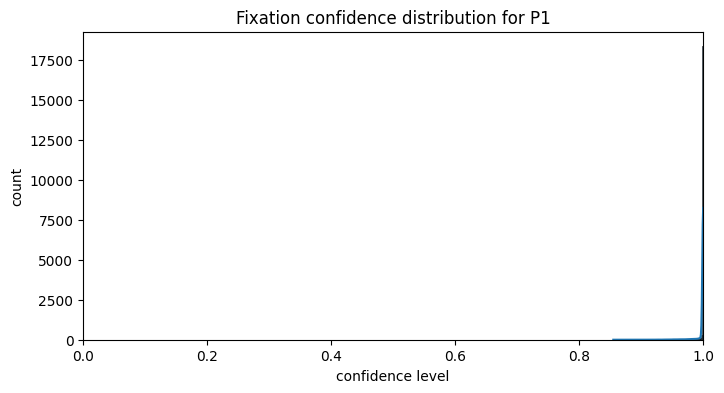

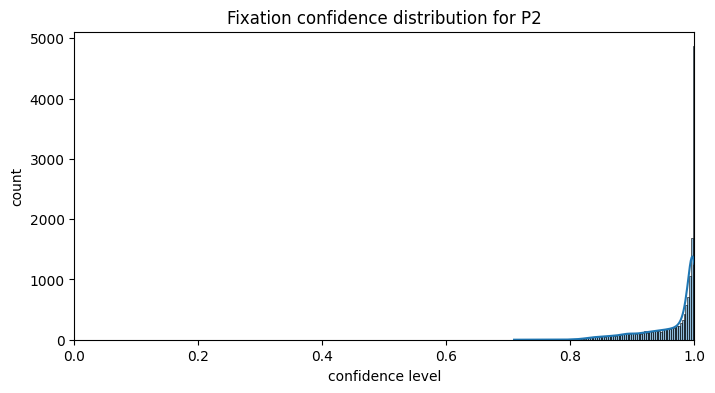

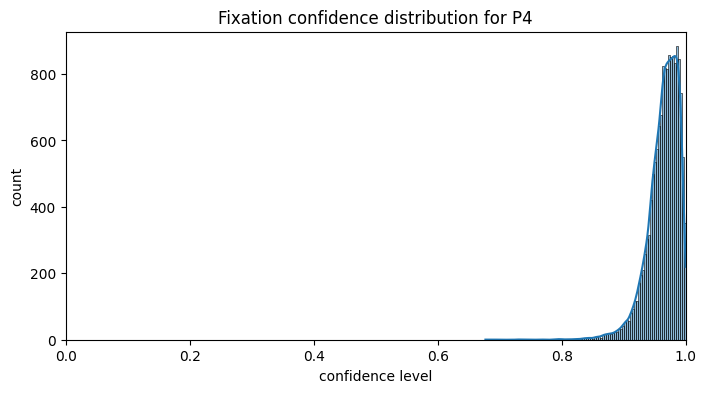

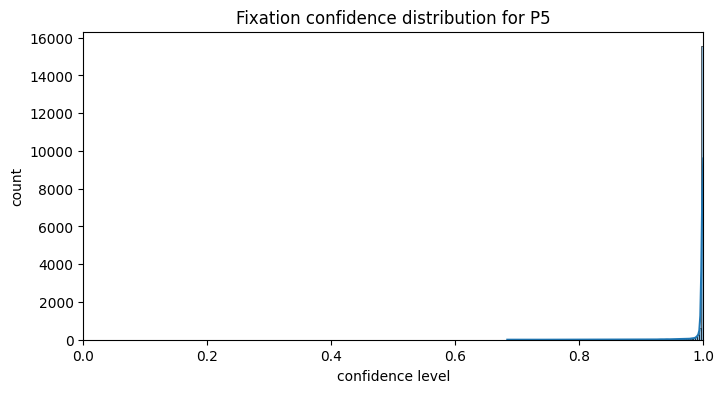

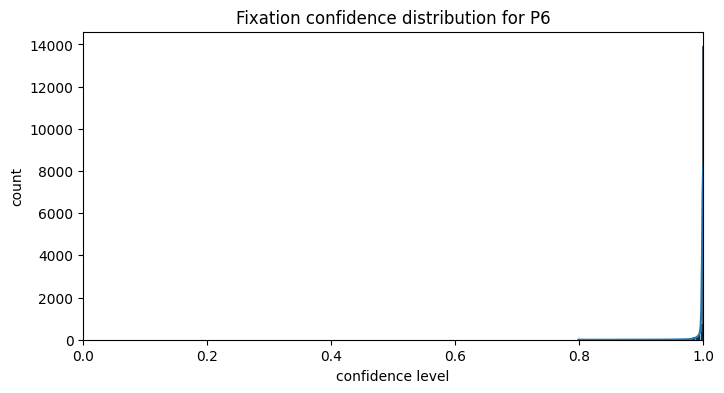

...

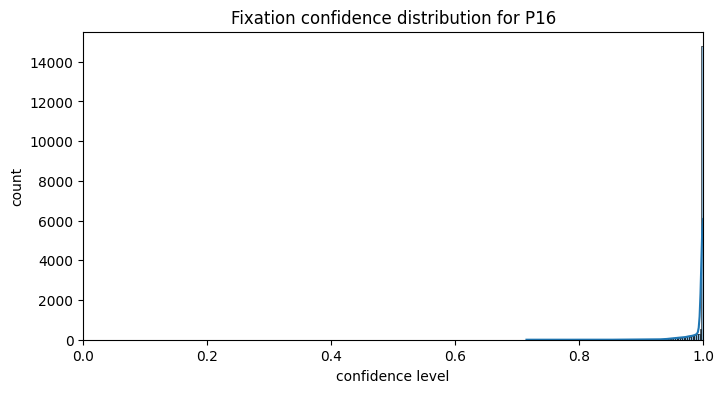

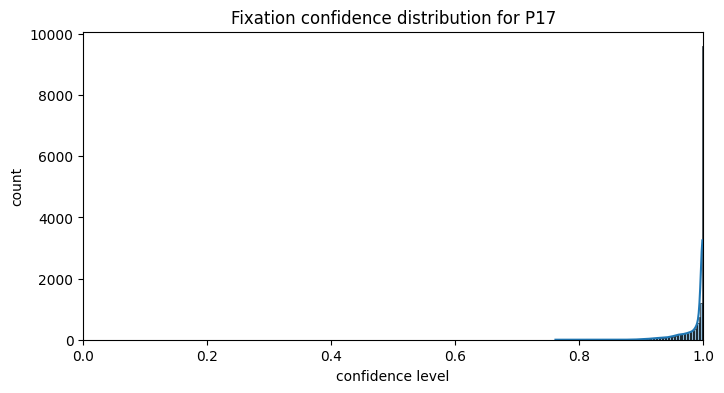

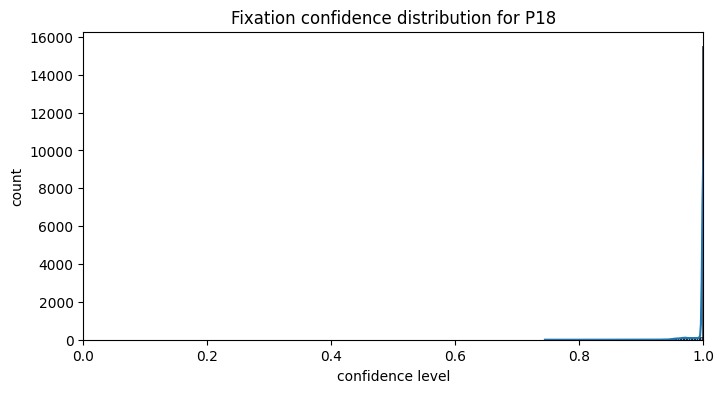

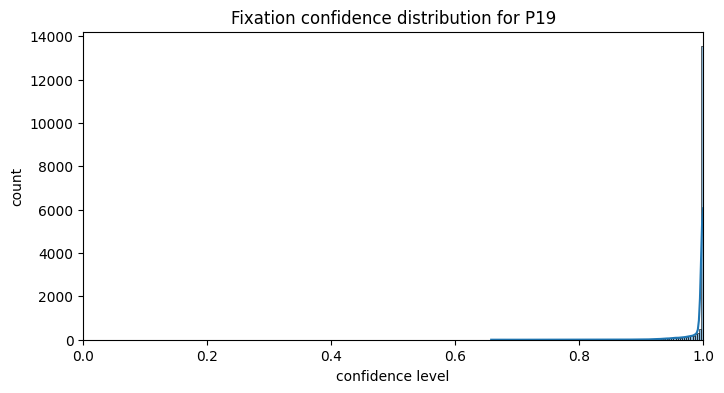

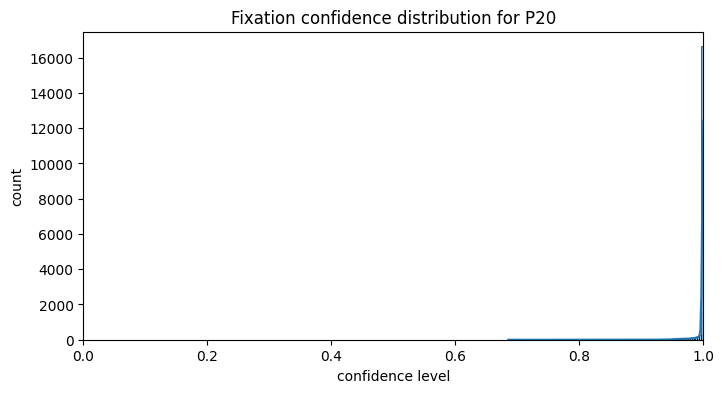

In [8]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['confidence'], bins=100, kde=True)
    plt.title(f'Fixation confidence distribution for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('count')
    plt.xlim(0,1)
    plt.show()

##### Duration distribution
- Higher concentration closer to the bounds (80, 220)

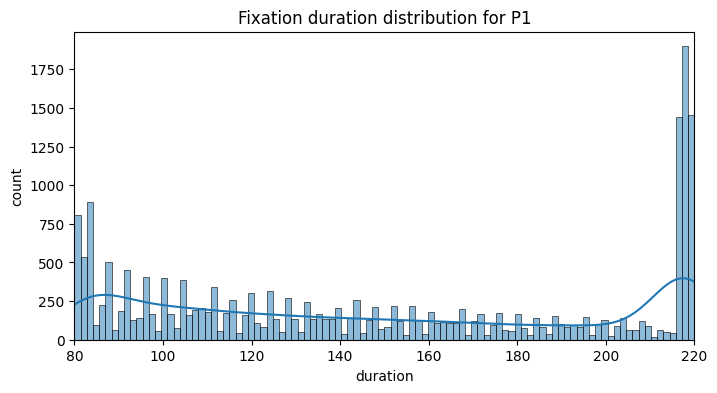

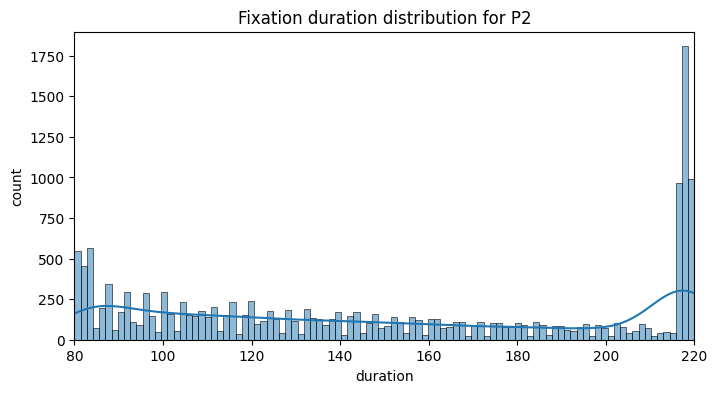

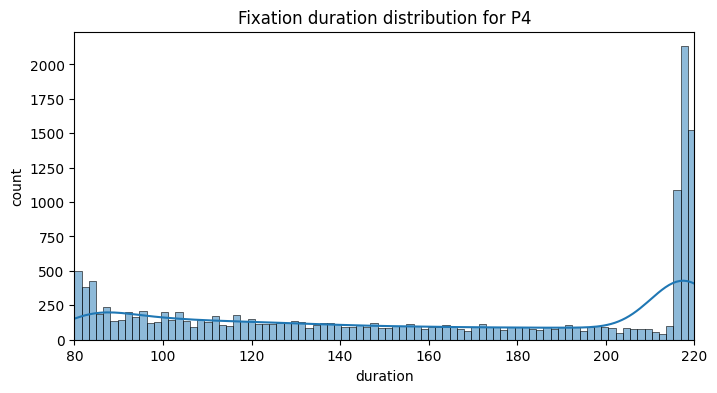

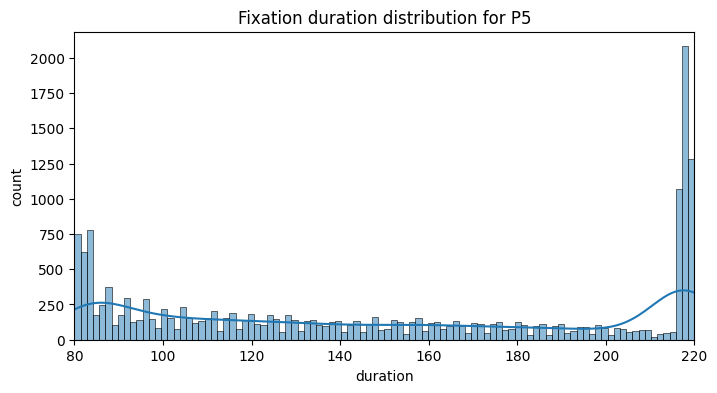

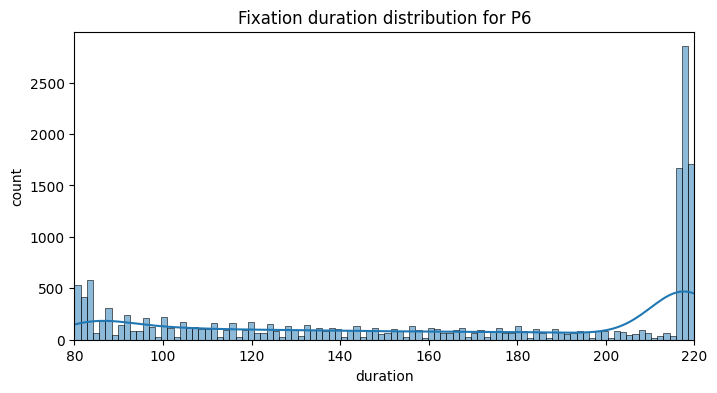

...

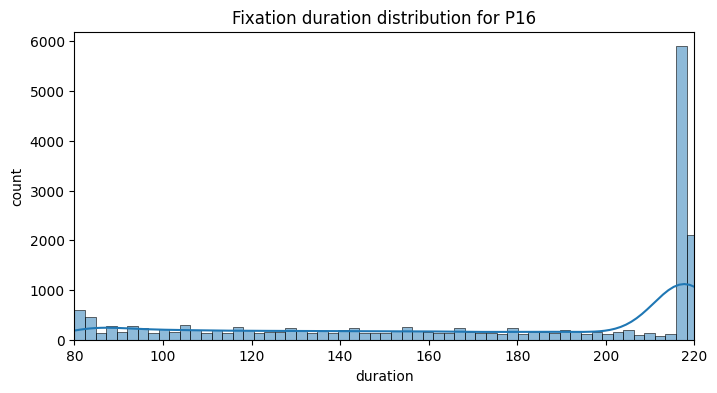

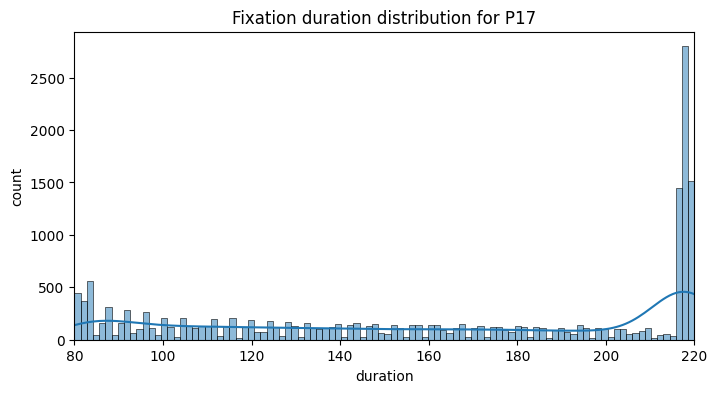

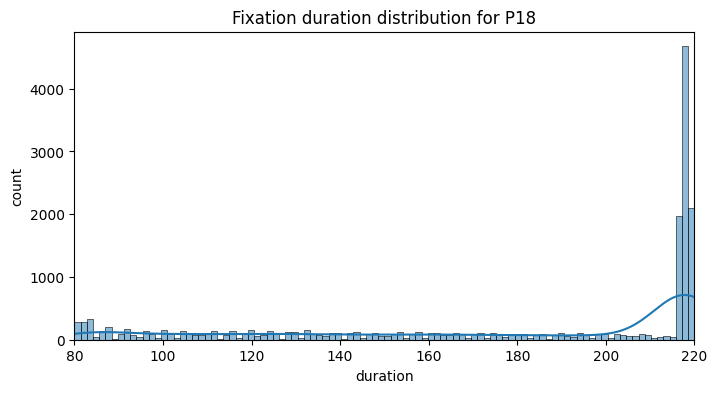

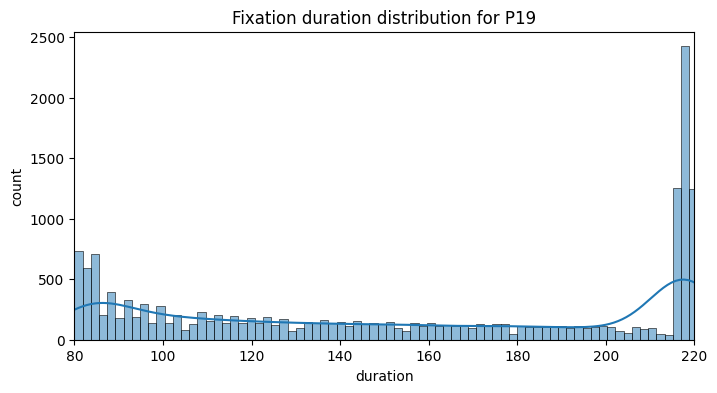

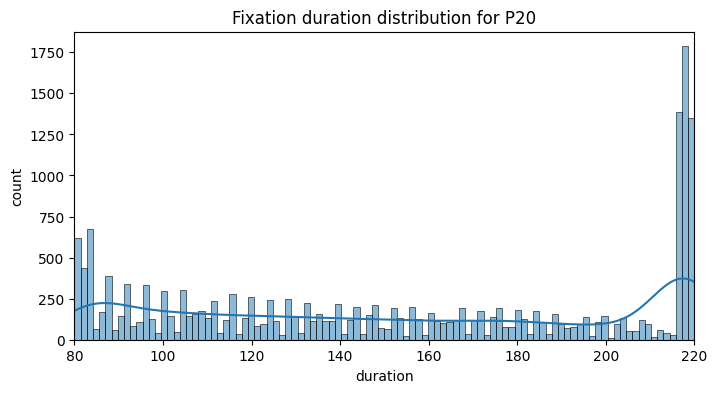

In [9]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['duration'], bins=100, kde=True)
    plt.title(f'Fixation duration distribution for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('count')
    plt.xlim(80, 220)
    plt.show()

##### Dispersion distribution
- Higher concentration closer to the upper bound (1.5)

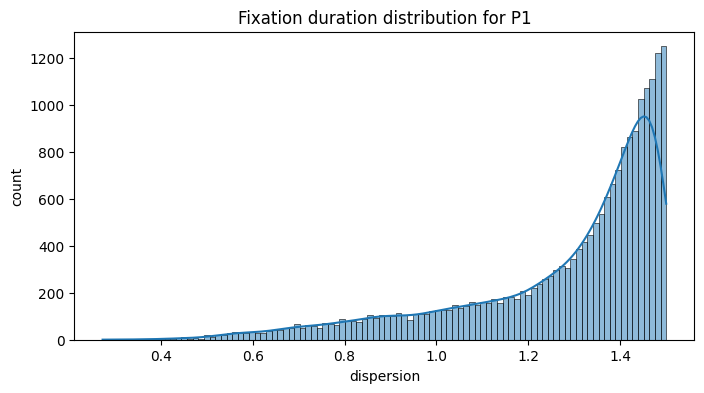

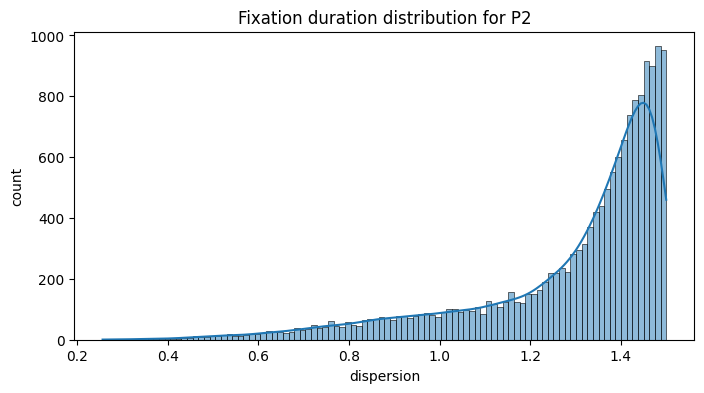

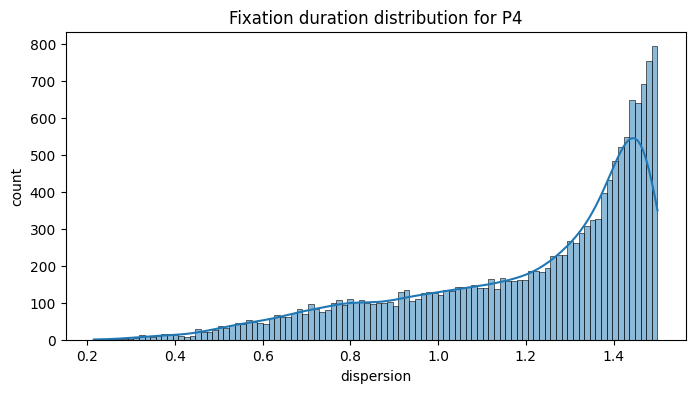

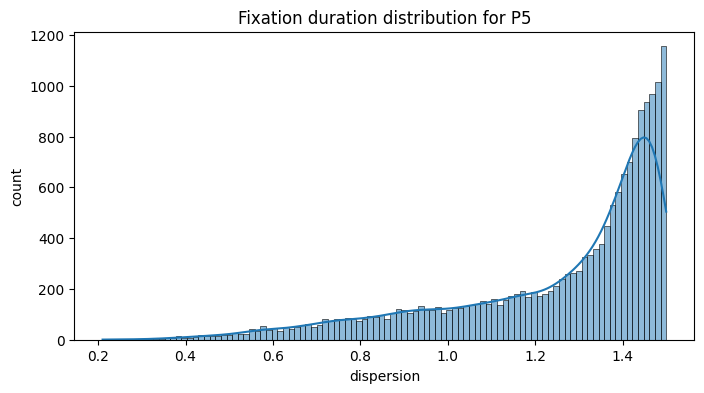

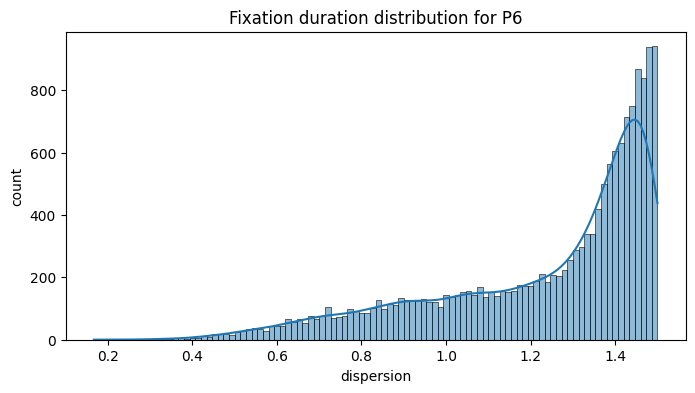

...

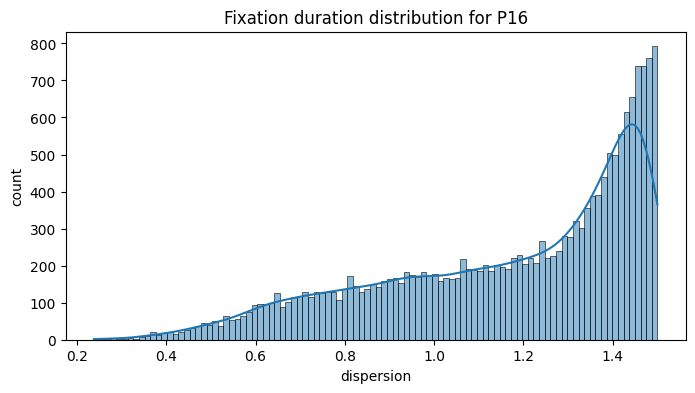

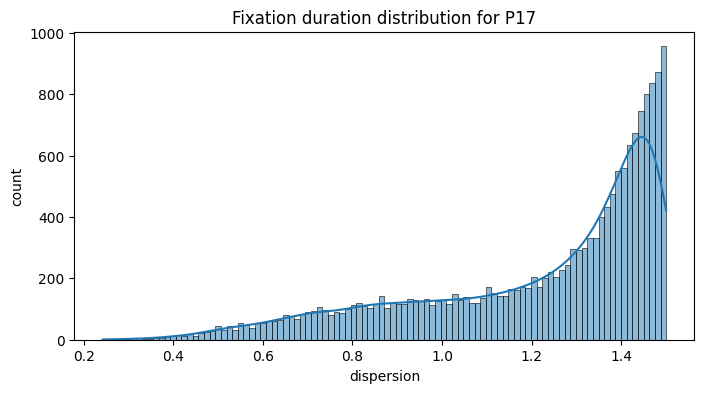

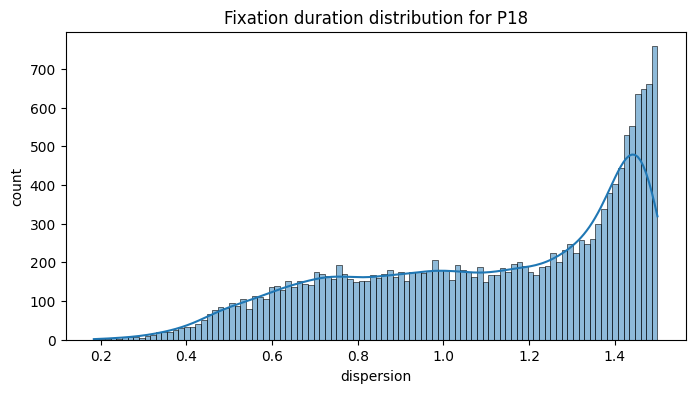

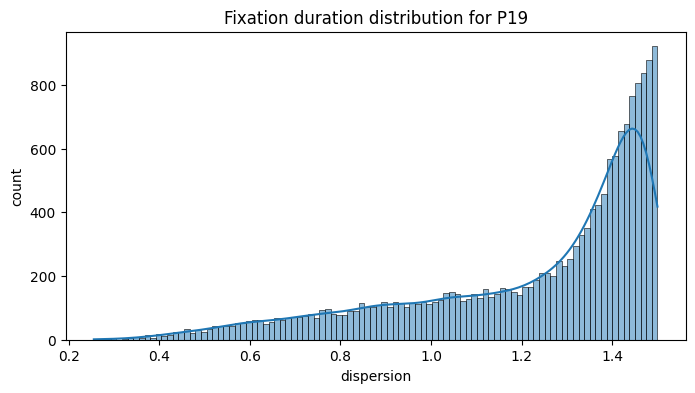

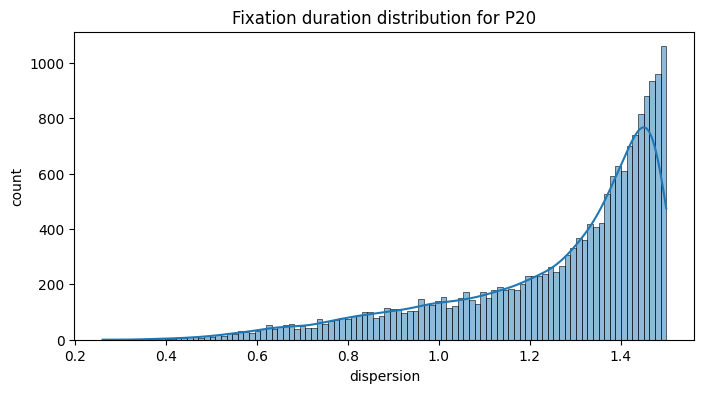

In [10]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['dispersion'], bins=100, kde=True)
    plt.title(f'Fixation duration distribution for P{pid}')
    plt.xlabel('dispersion')
    plt.ylabel('count')
    # plt.xlim(0,1)
    plt.show()

##### Normalized x-y position distribution
- Center x~0.5, y~(0.5, 0.75)

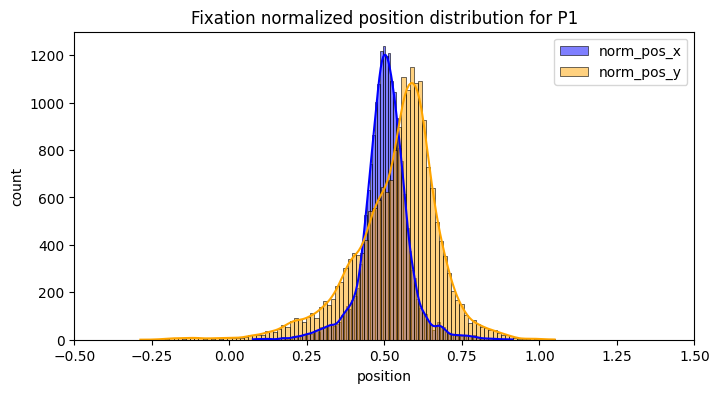

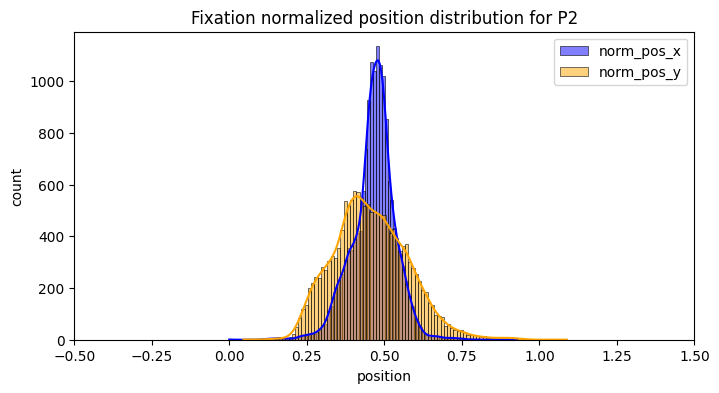

In [8]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['norm_pos_x'], bins=100, kde=True, color='blue', label='norm_pos_x')
    sns.histplot(participant_ddf['norm_pos_y'], bins=100, kde=True, color='orange', label='norm_pos_y')
    plt.title(f'Fixation normalized position distribution for P{pid}')
    plt.xlabel('position')
    plt.ylabel('count')
    plt.xlim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Confidence-duration correlation
- No correlation

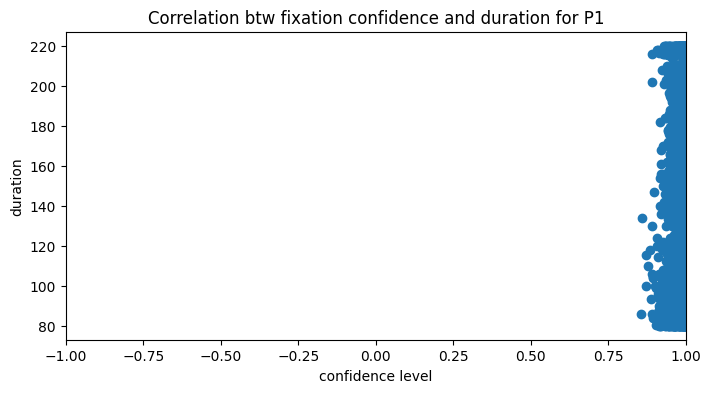

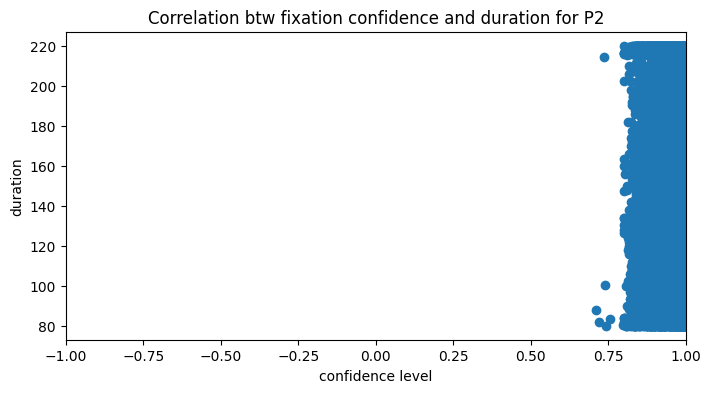

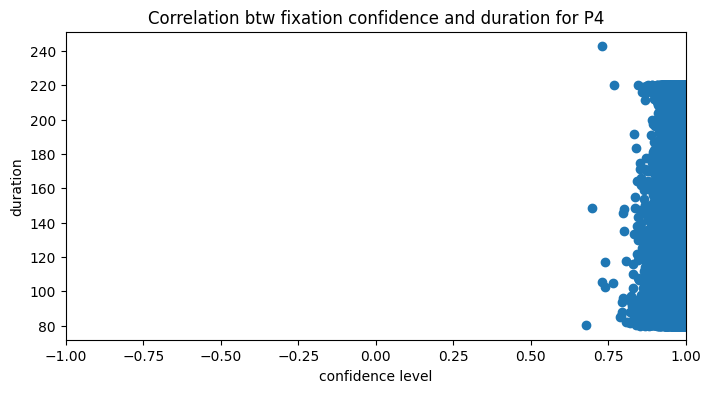

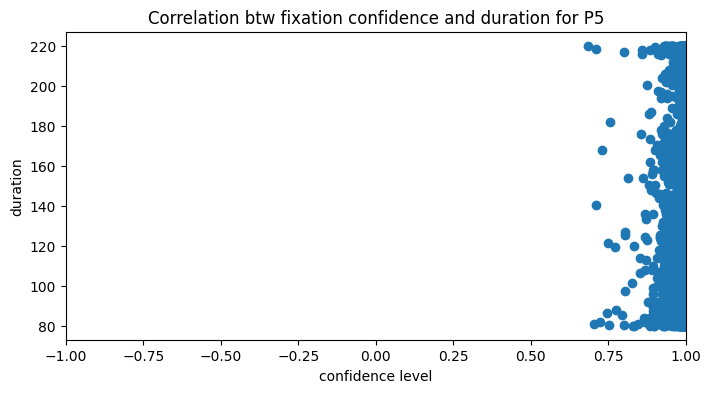

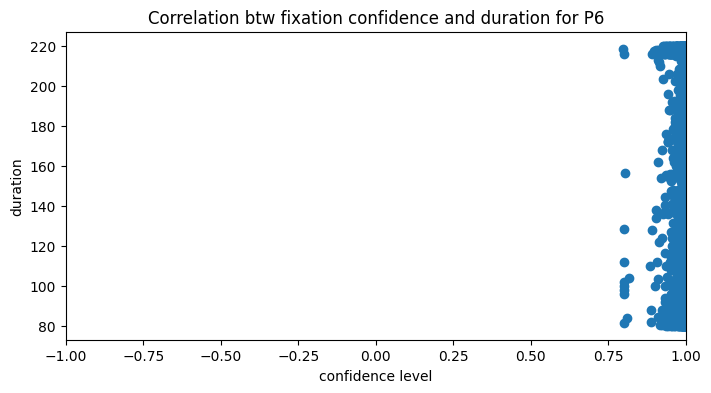

...

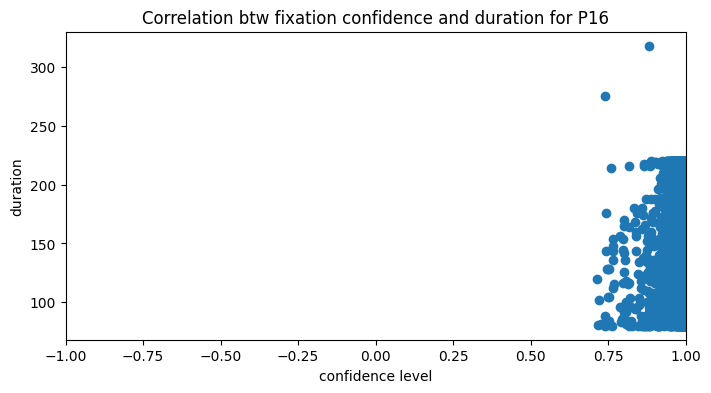

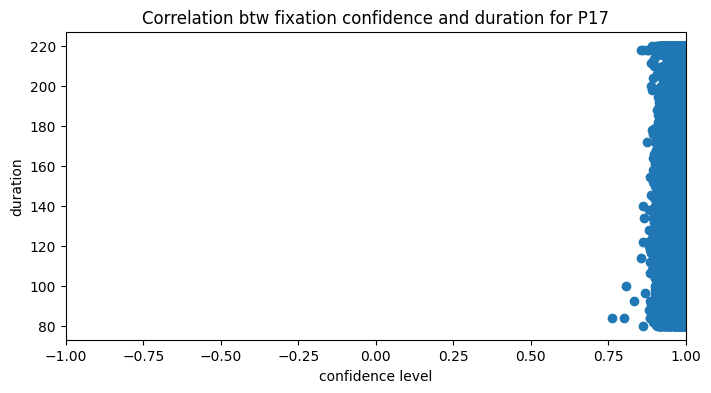

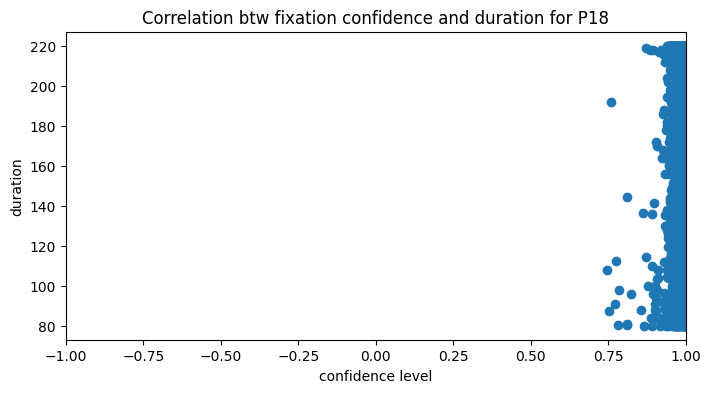

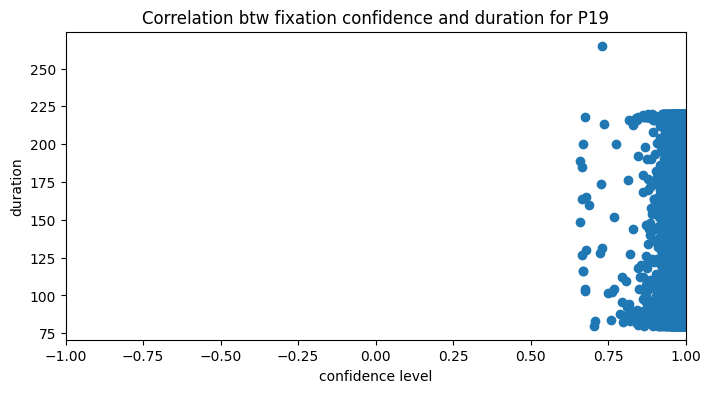

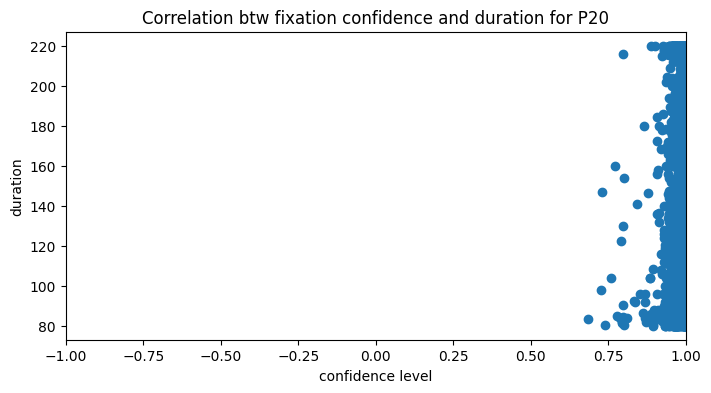

In [12]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['confidence'], participant_ddf['duration'])
    plt.title(f'Correlation btw fixation confidence and duration for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('duration')
    plt.xlim(-1,1)
    plt.show()

##### Confidence-dispersion correlation
- No correlation, lower confidence tend to have larger dispersion, some 'lines' in conf=0.8 (ex. P15)

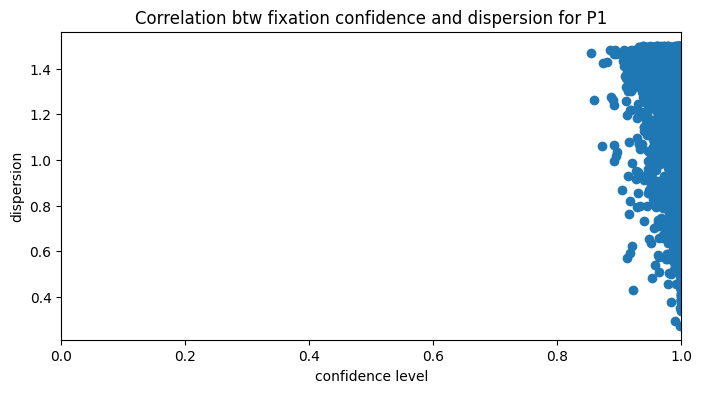

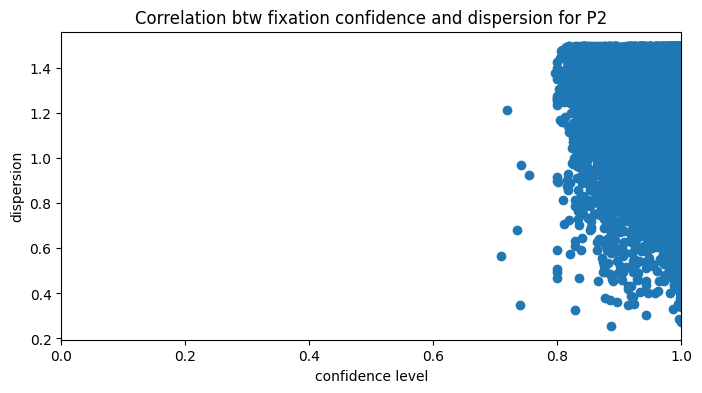

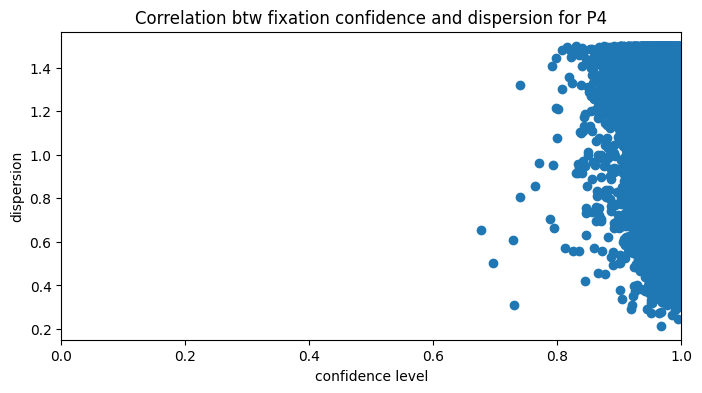

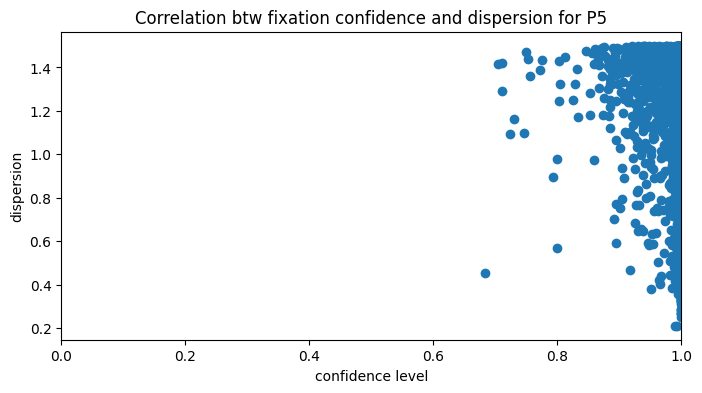

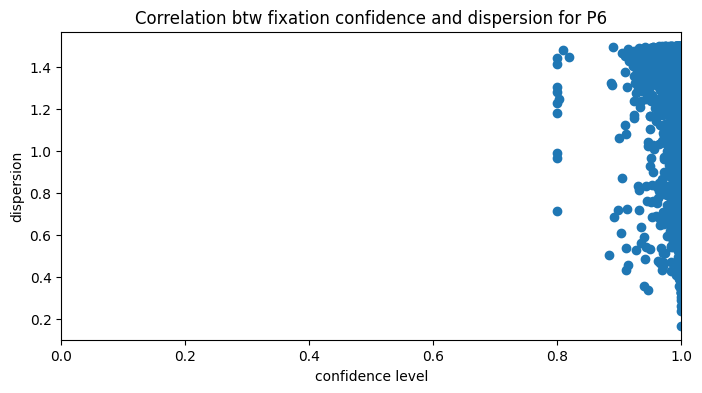

...

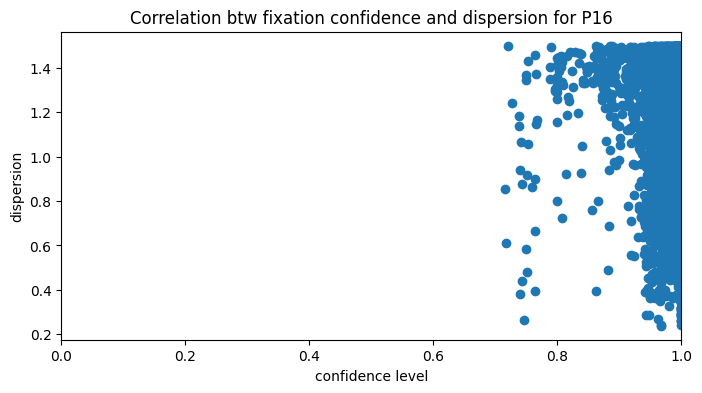

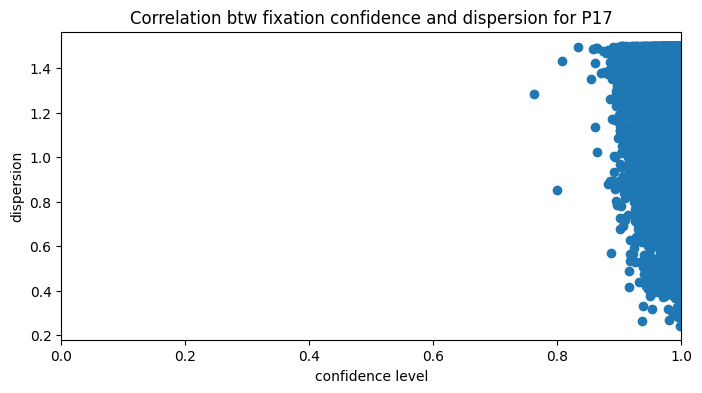

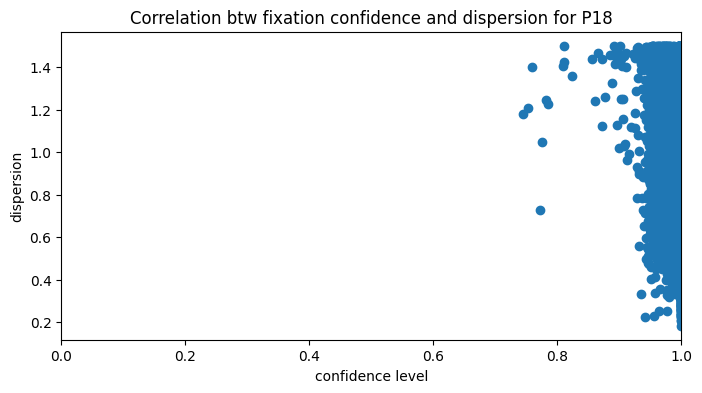

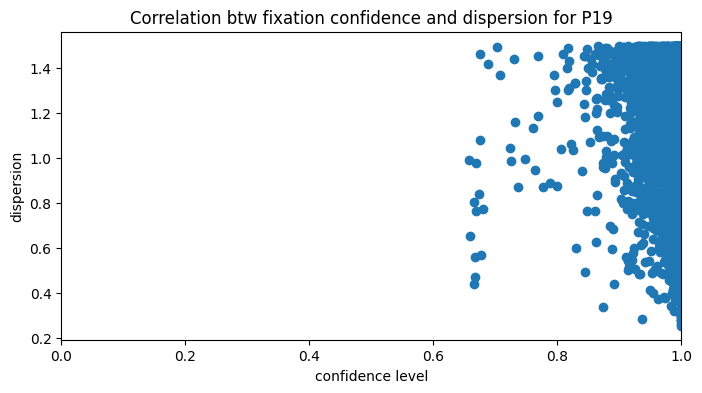

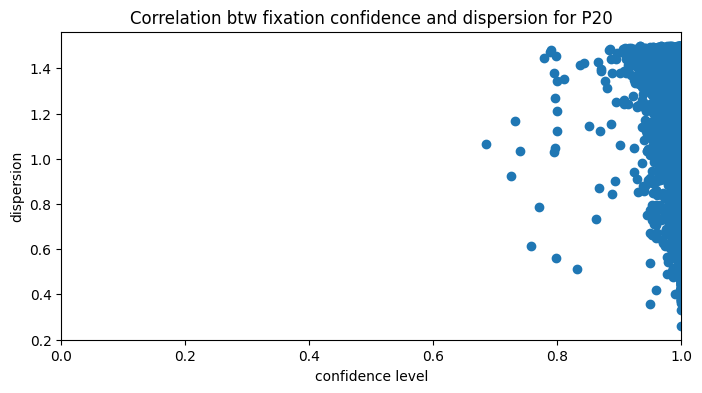

In [13]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['confidence'], participant_ddf['dispersion'])
    plt.title(f'Correlation btw fixation confidence and dispersion for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('dispersion')
    plt.xlim(0,1)
    plt.show()

##### Confidence-normalized position correlation
- No correlation

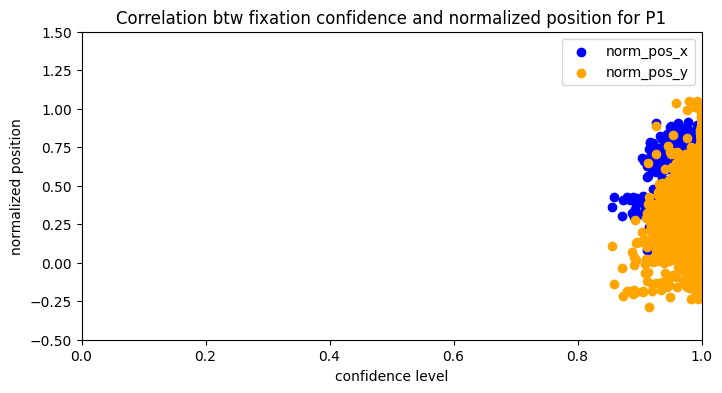

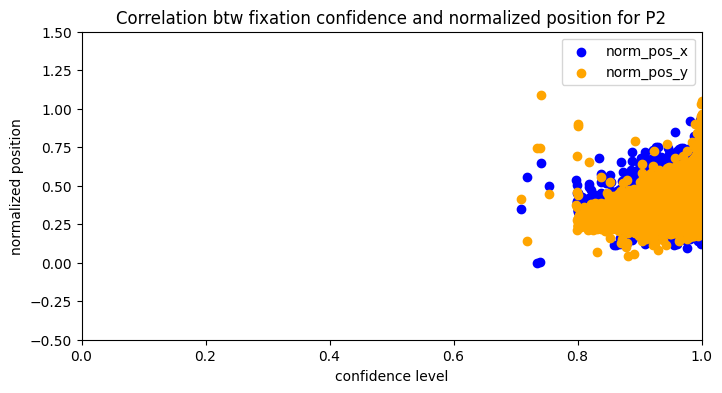

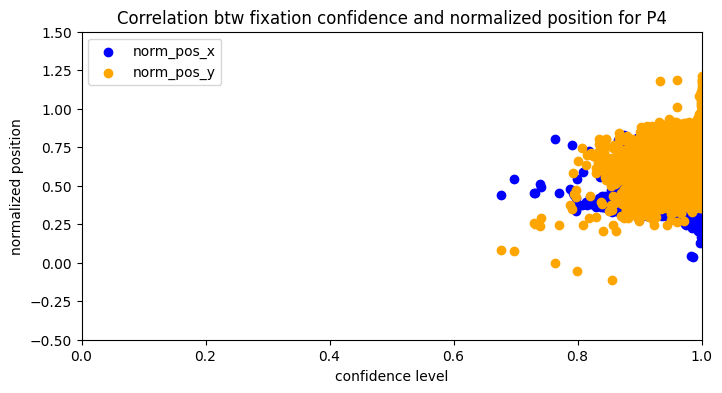

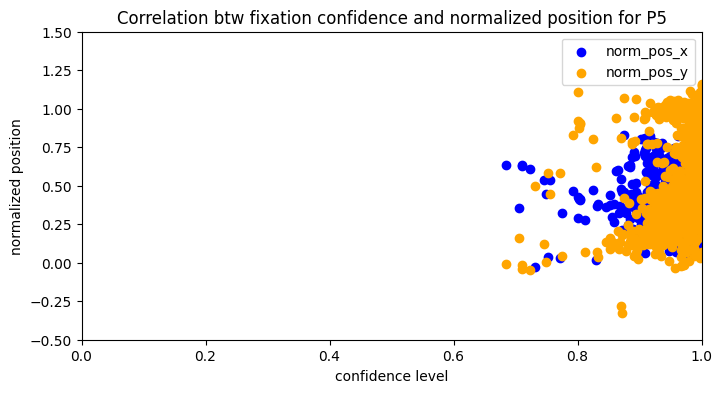

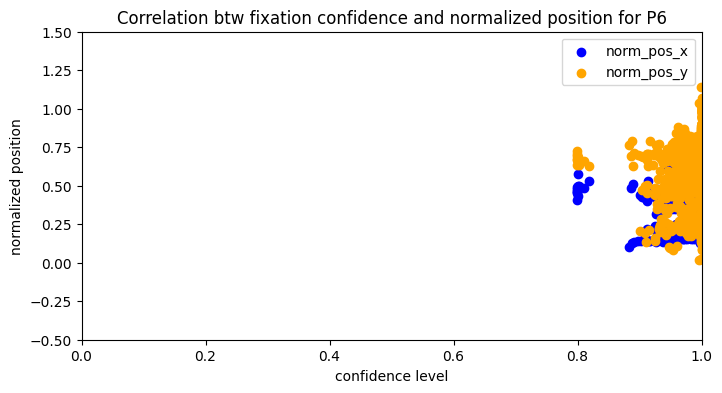

...

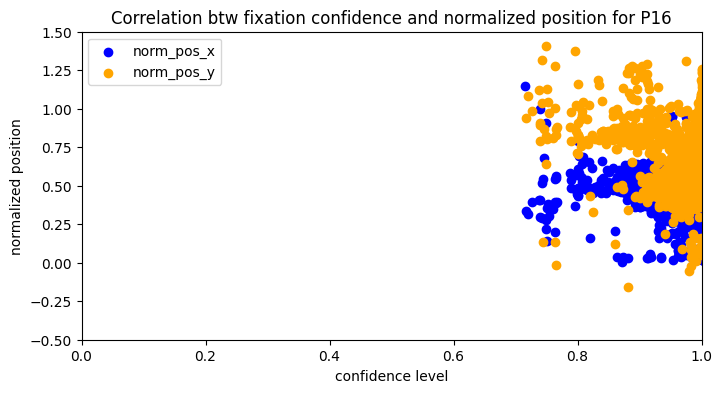

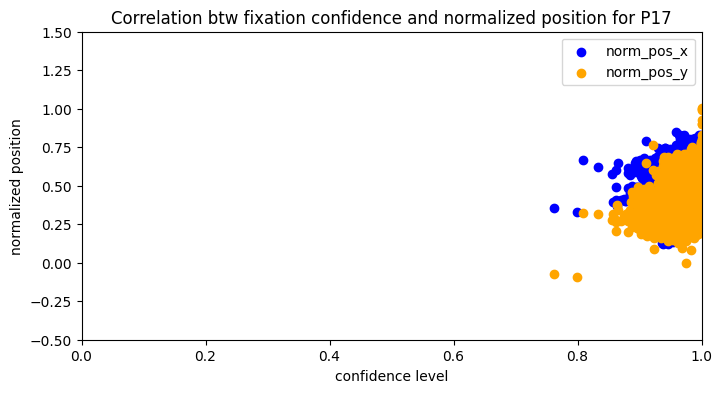

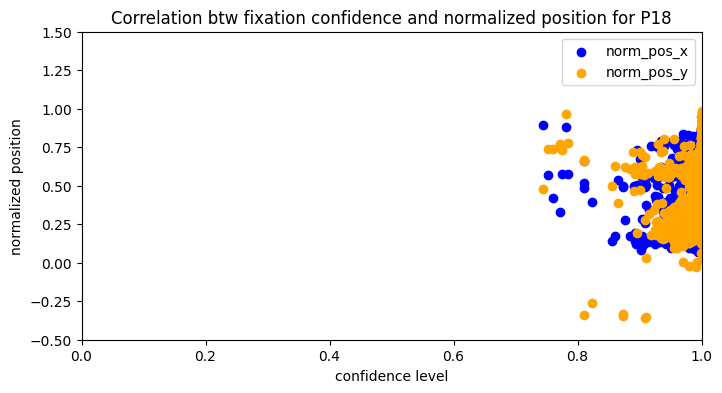

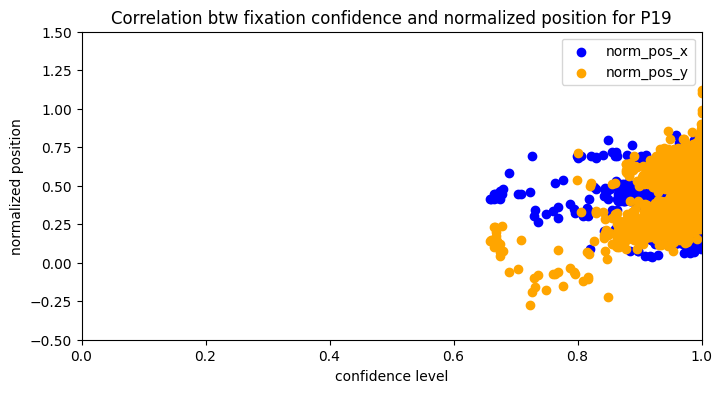

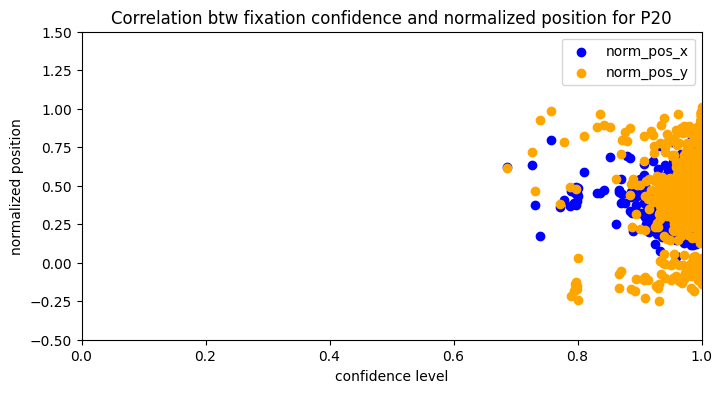

In [7]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['confidence'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['confidence'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw fixation confidence and normalized position for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('normalized position')
    plt.xlim(0, 1)
    plt.ylim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Duration-dispersion correlation
- Higher duration tend to have higher dispersion (except if >214ms)

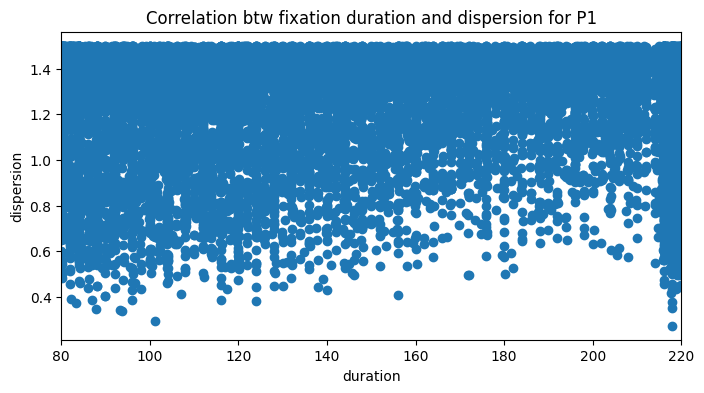

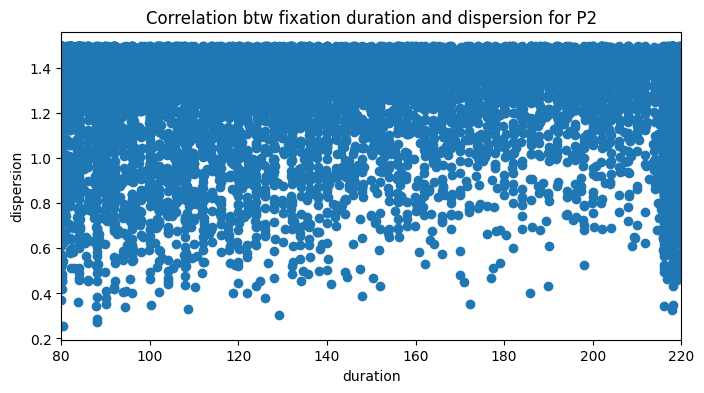

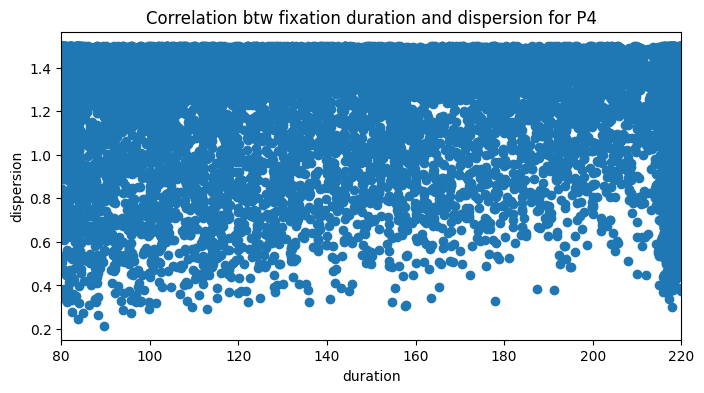

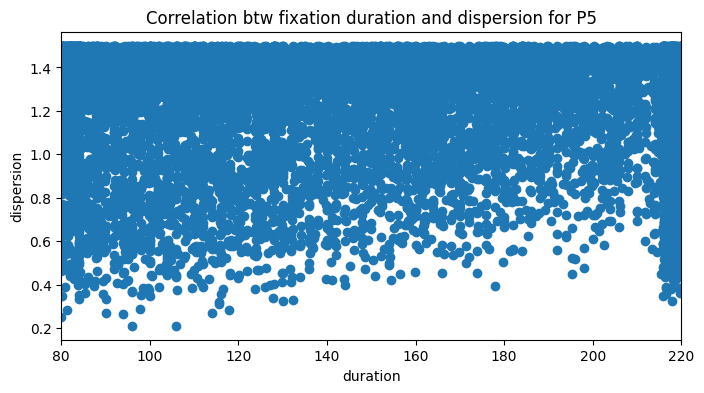

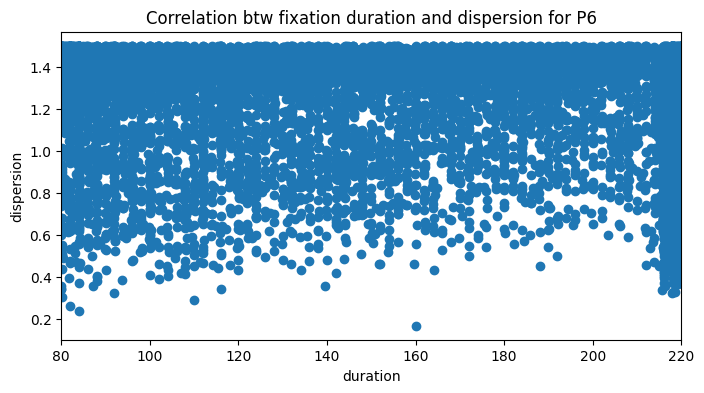

...

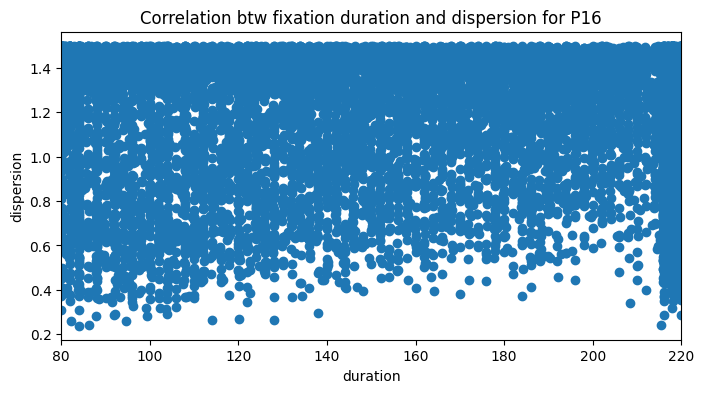

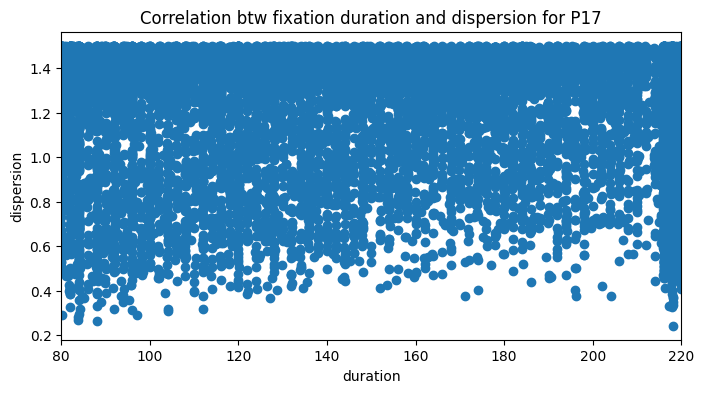

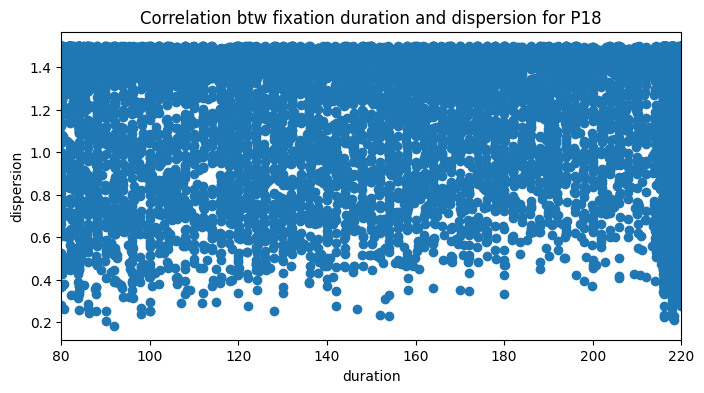

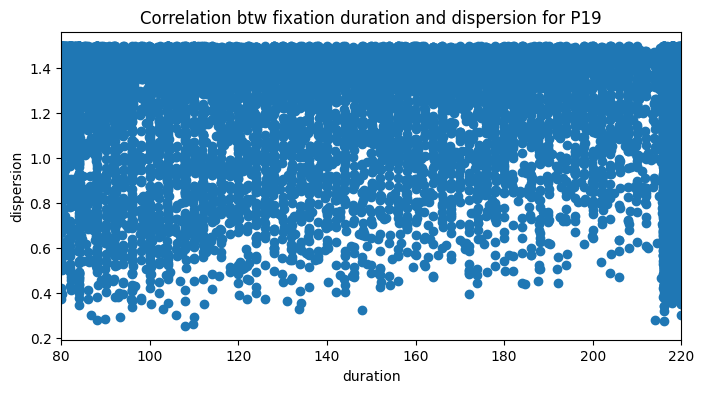

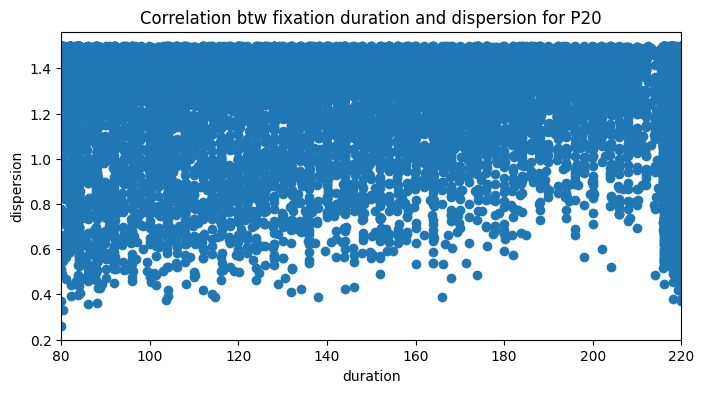

In [39]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['duration'], participant_ddf['dispersion'])
    plt.title(f'Correlation btw fixation duration and dispersion for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('dispersion')
    plt.xlim(80,220)
    plt.show()

##### Duration-normalized position correlation
- No correlation

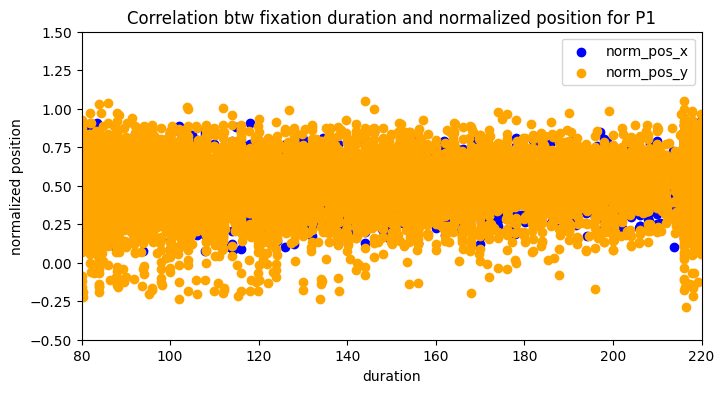

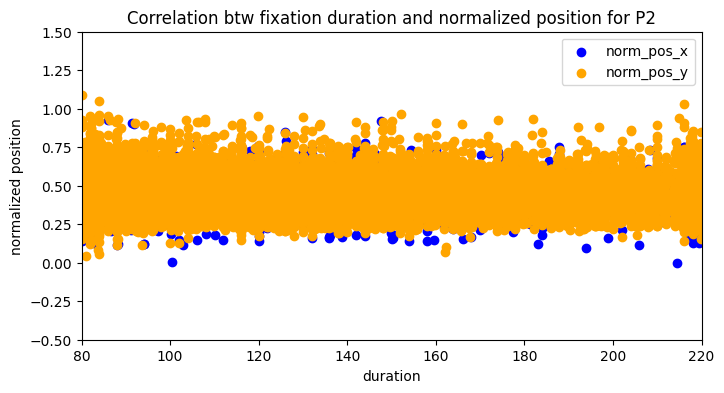

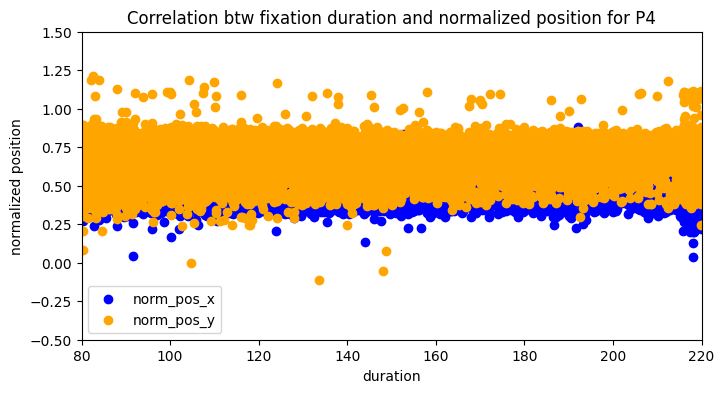

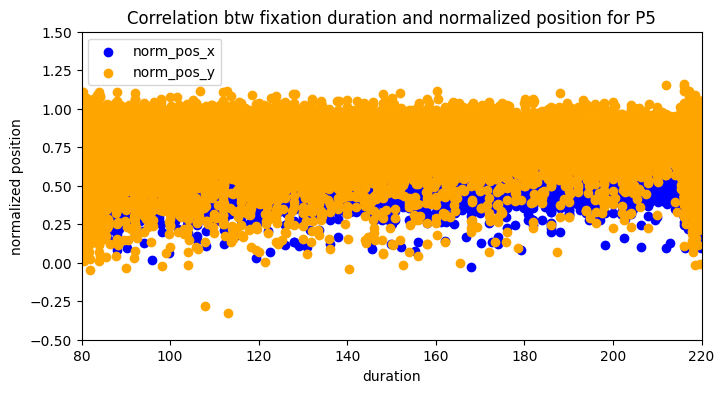

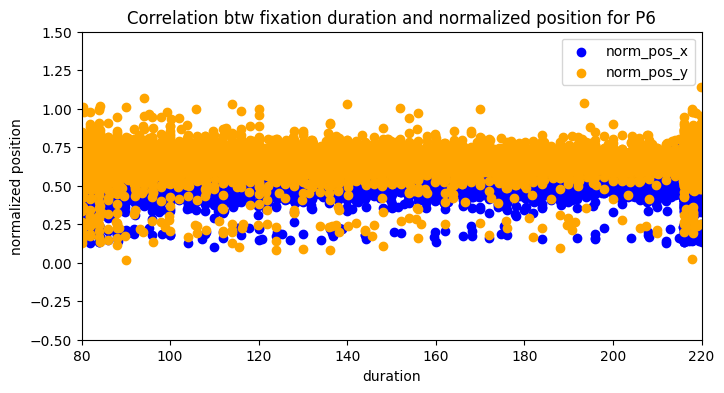

...

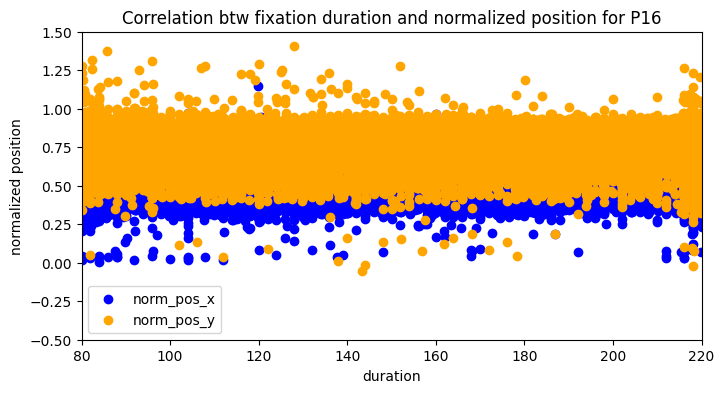

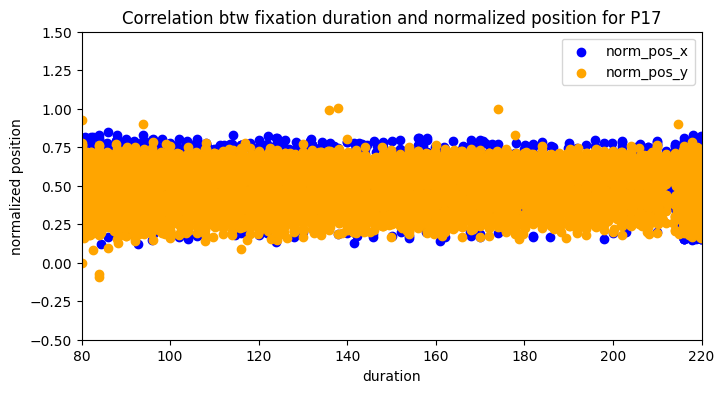

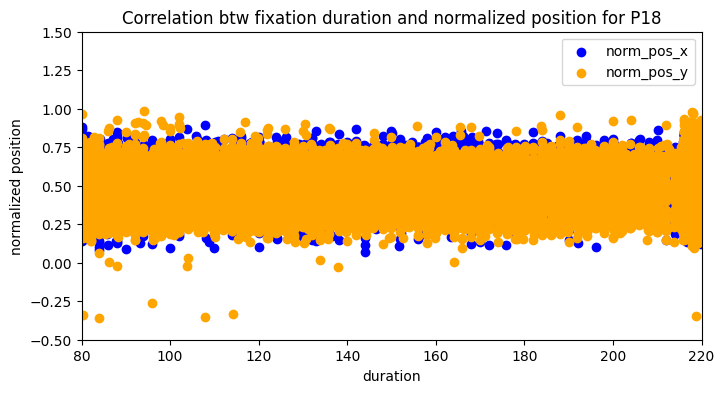

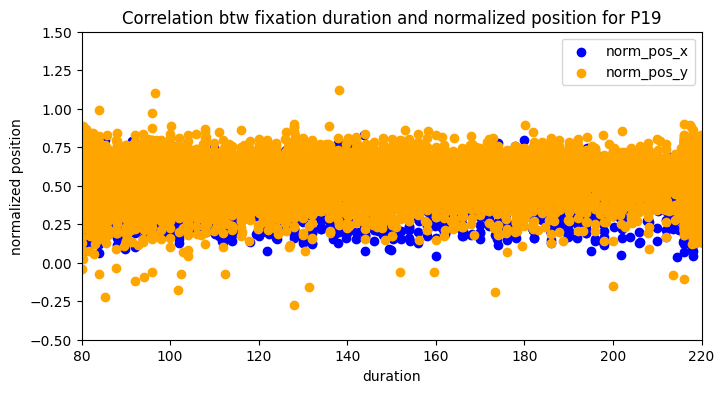

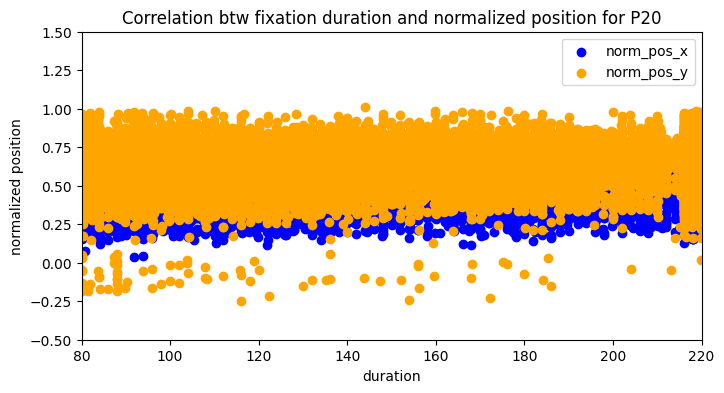

In [6]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['duration'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['duration'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw fixation duration and normalized position for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('normalized position')
    plt.xlim(80, 220)
    plt.ylim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Dispersion-normalized position correlation
- No correlation

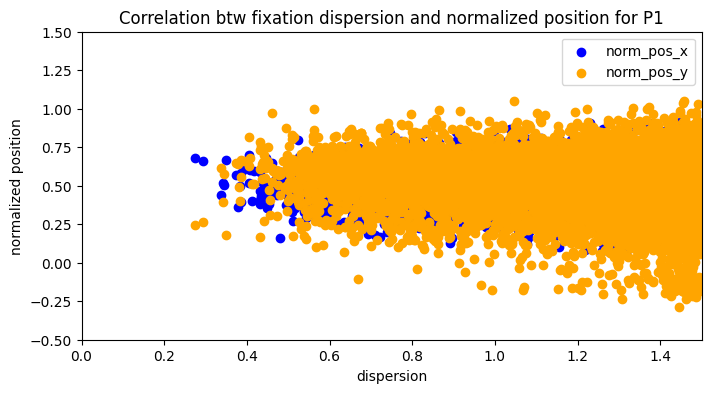

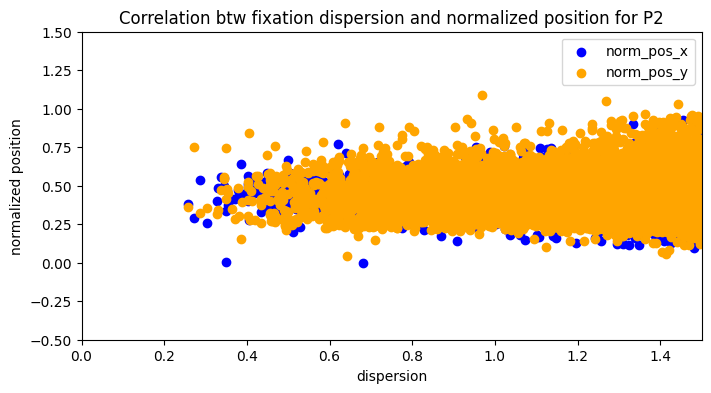

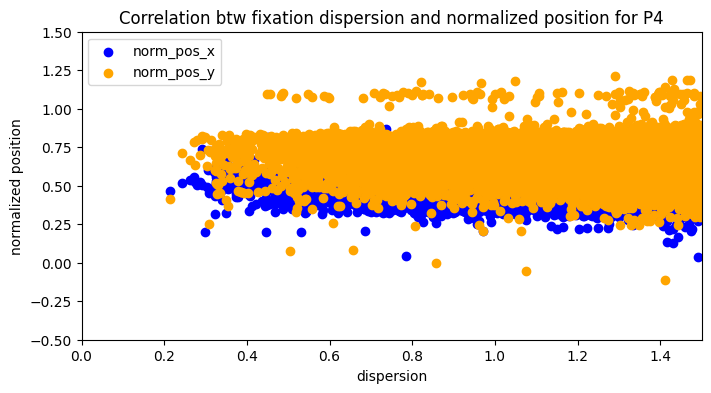

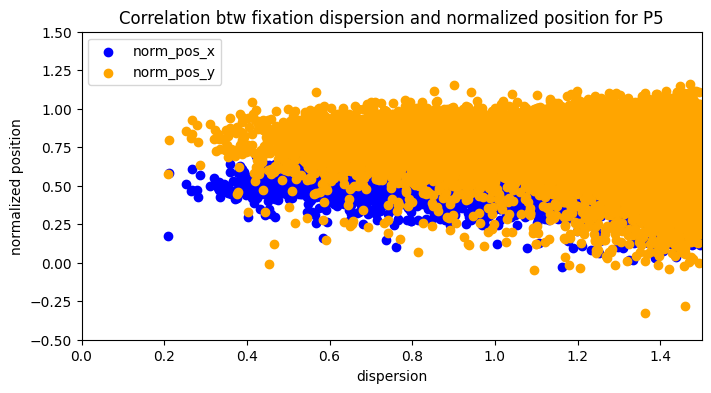

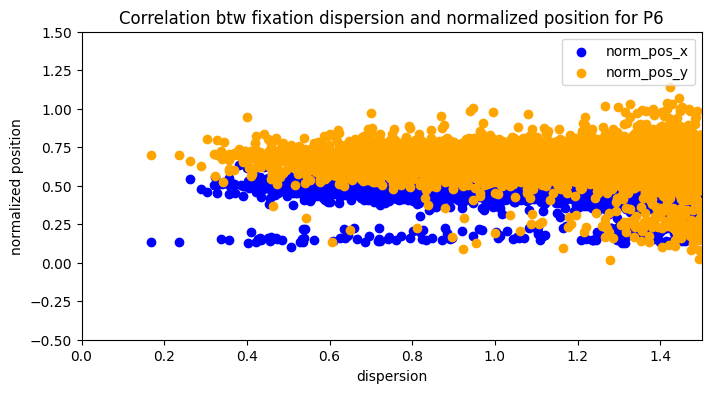

...

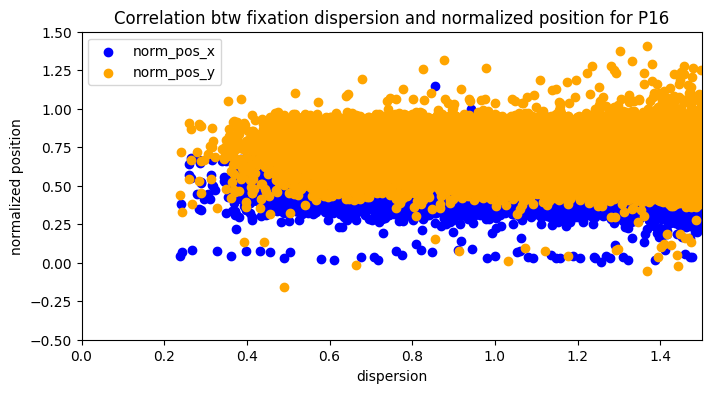

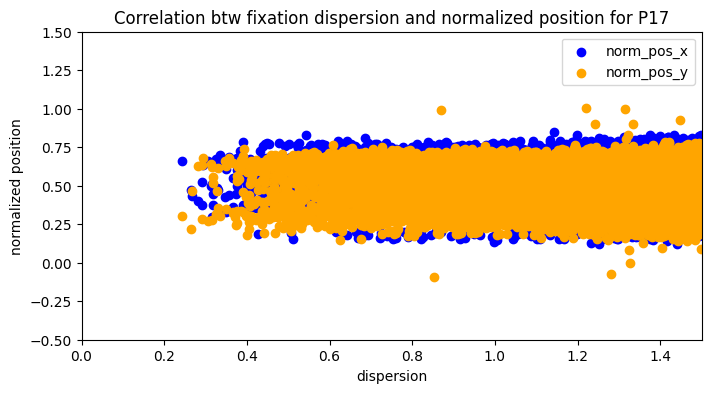

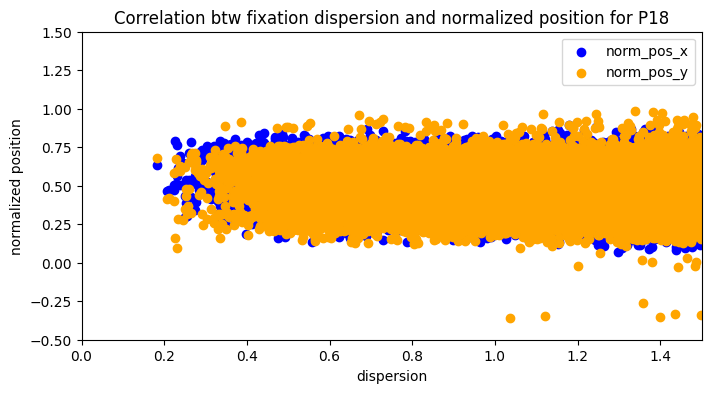

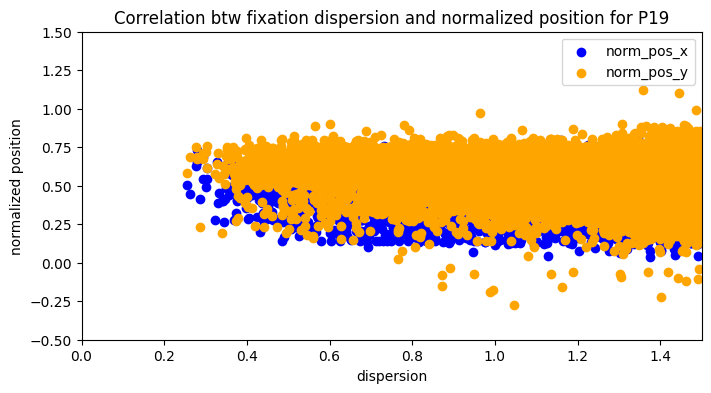

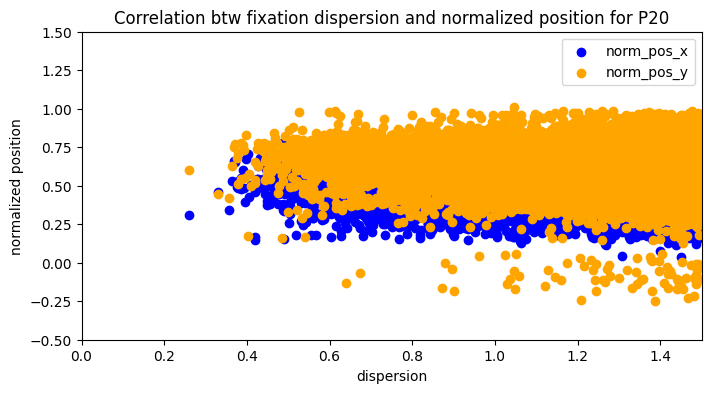

In [7]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['dispersion'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['dispersion'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw fixation dispersion and normalized position for P{pid}')
    plt.xlabel('dispersion')
    plt.ylabel('normalized position')
    plt.xlim(0, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Duration boxplot
- Good

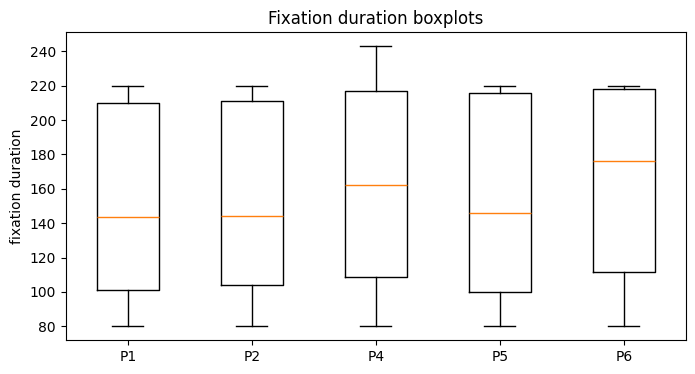

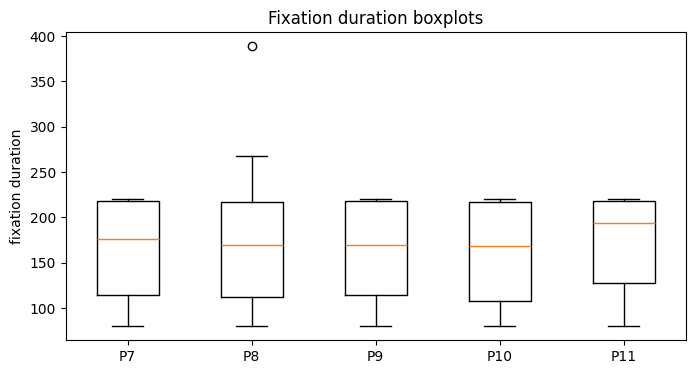

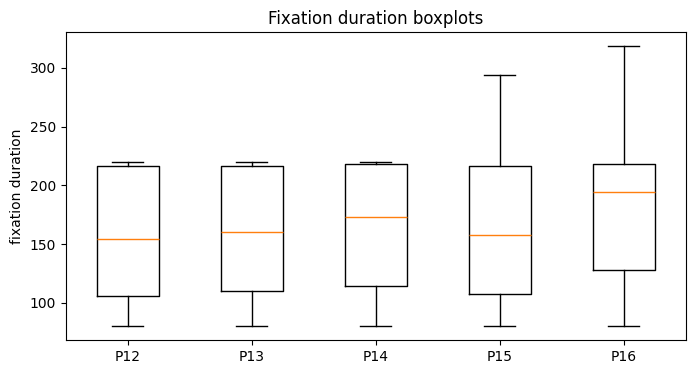

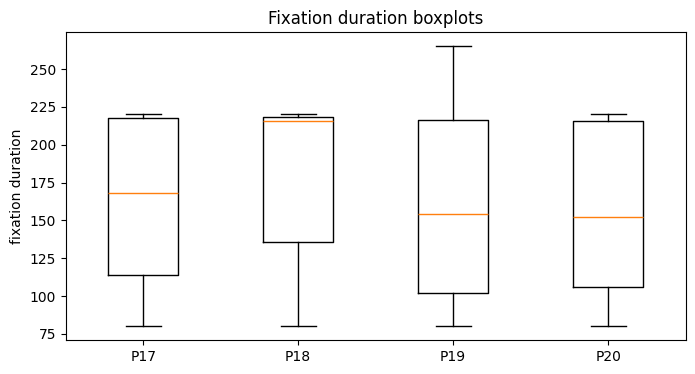

In [15]:
grouped_ids = [participant_ids[i:i+5] for i in range(0, len(participant_ids), 5)] #group ids
for group in grouped_ids: #iterate groups
    participants_ddf = [ddf[ddf['participant_id'] == pid]['duration'] for pid in group] #get group's sub-ddfs
    plt.figure(figsize=(8, 4))
    plt.boxplot(participants_ddf, whis = 1.5)
    plt.title(f'Fixation duration boxplots')
    plt.ylabel('fixation duration')
    # plt.ylim(80, 220)
    plt.xticks(range(1, len(group) + 1), [f'P{pid}' for pid in group]) #single boxplots labels
    plt.show()

##### Dispersion boxplot
- lower-value outliers?

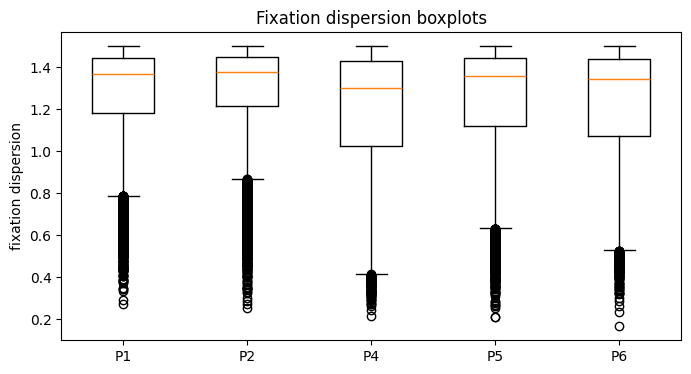

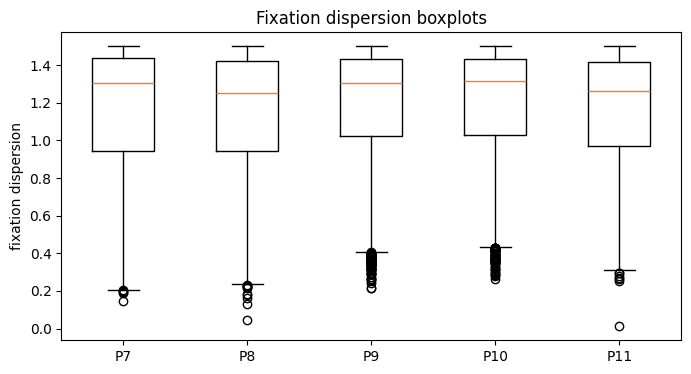

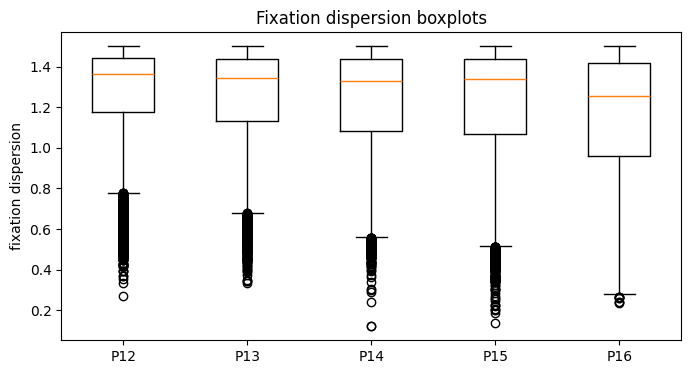

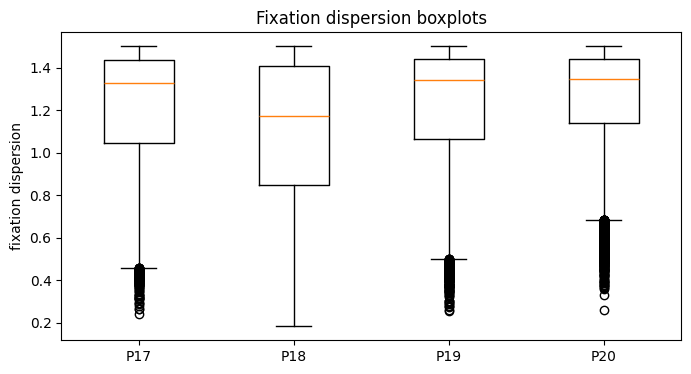

In [16]:
grouped_ids = [participant_ids[i:i+5] for i in range(0, len(participant_ids), 5)] #group ids
for group in grouped_ids: #iterate groups
    participants_ddf = [ddf[ddf['participant_id'] == pid]['dispersion'] for pid in group] #get group's sub-ddfs
    plt.figure(figsize=(8, 4))
    plt.boxplot(participants_ddf, whis = 1.5)
    plt.title(f'Fixation dispersion boxplots')
    plt.ylabel('fixation dispersion')
    # plt.ylim(0, 1.5)
    plt.xticks(range(1, len(group) + 1), [f'P{pid}' for pid in group]) #single boxplots labels
    plt.show()

##### Normalized position boxplot
- Good

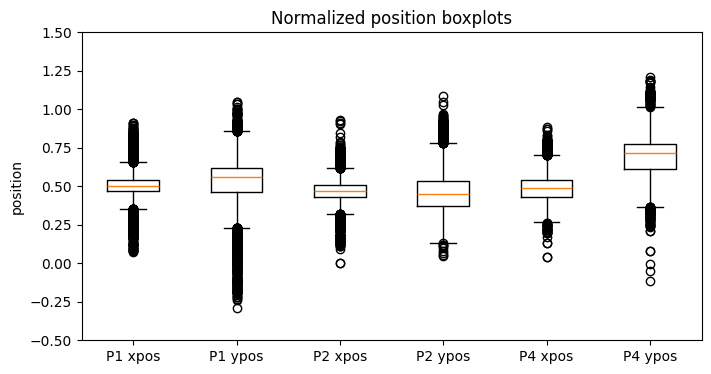

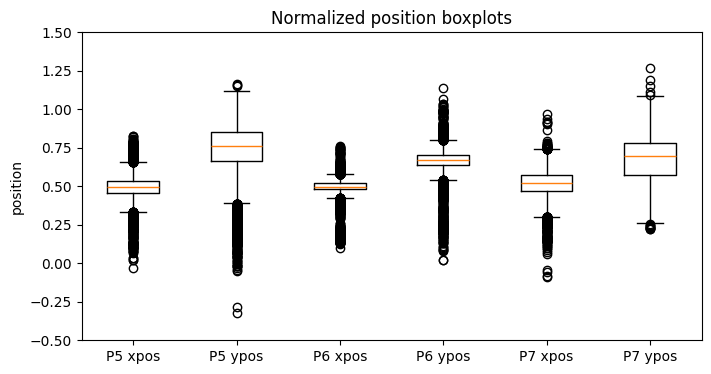

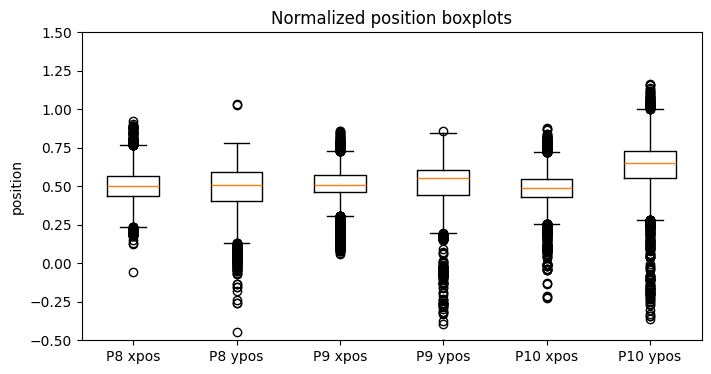

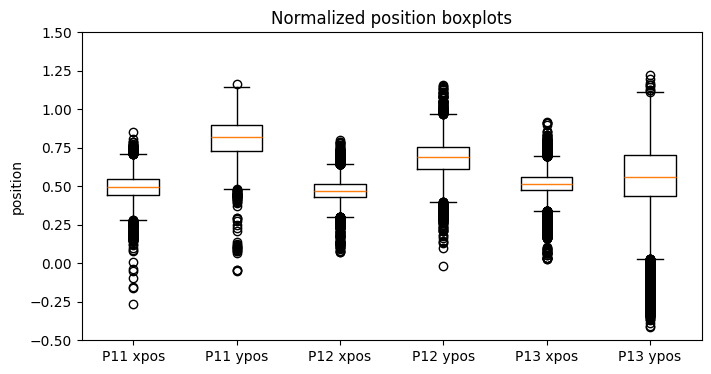

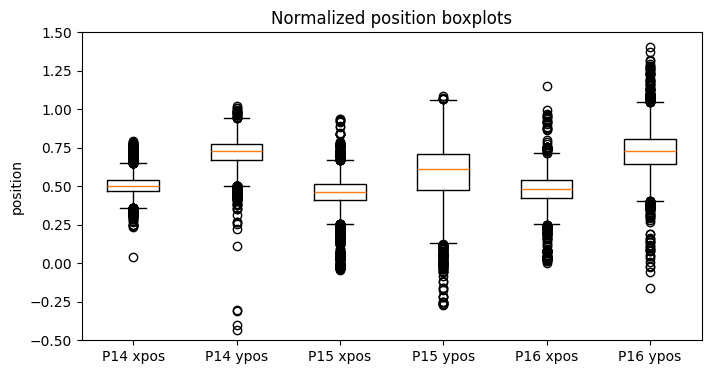

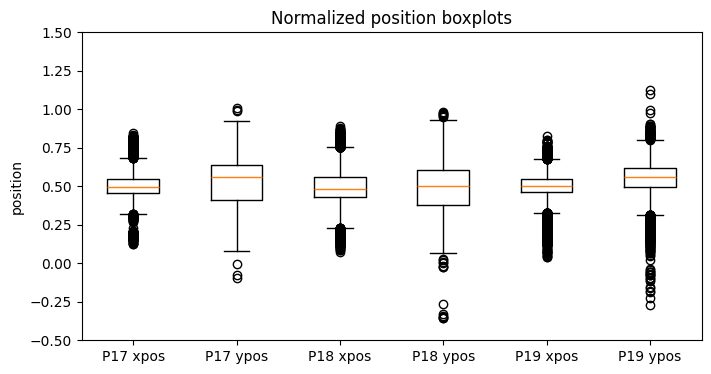

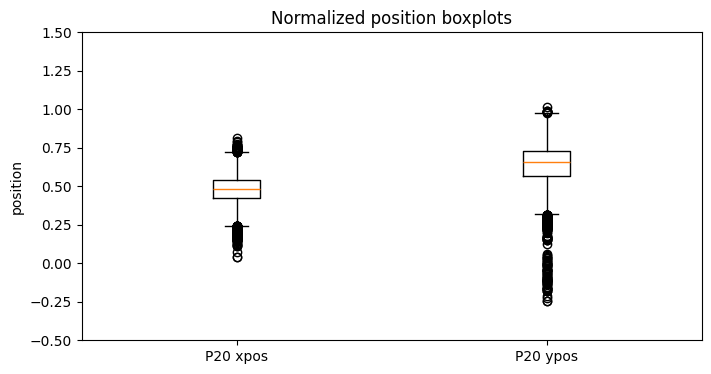

In [17]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    pos_ddf = []
    labels = []
    for pid in group:
        participant_ddf = ddf[ddf['participant_id'] == pid]
        x = participant_ddf['norm_pos_x']
        y = participant_ddf['norm_pos_y']
        pos_ddf.append(x)
        pos_ddf.append(y)
        labels.append(f'P{pid} xpos')
        labels.append(f'P{pid} ypos')
    plt.figure(figsize=(8, 4))
    plt.boxplot(pos_ddf, whis = 1.5)
    plt.title(f'Normalized position boxplots')
    plt.ylabel('position')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(-0.5, 1.5)
    plt.show()

##### Spatial distribution
- Glasses adjustment during experiment in P08 and P13(?)

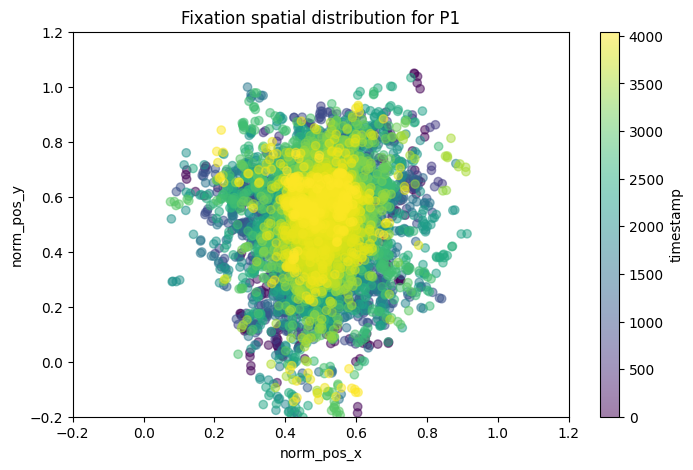

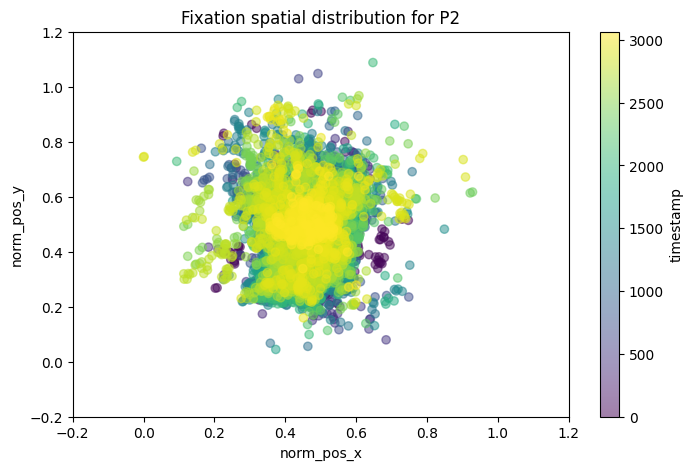

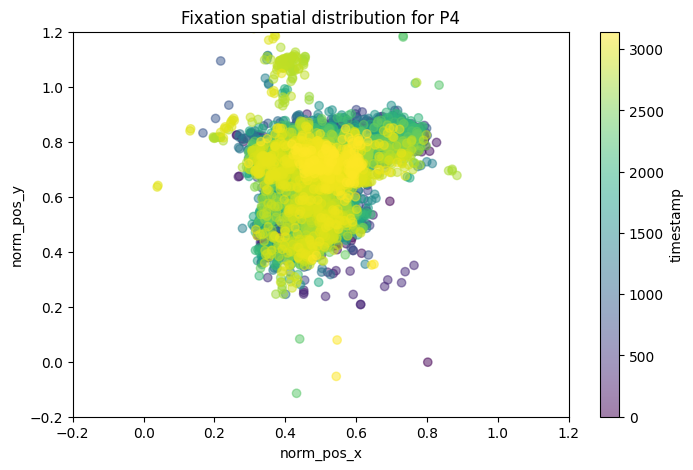

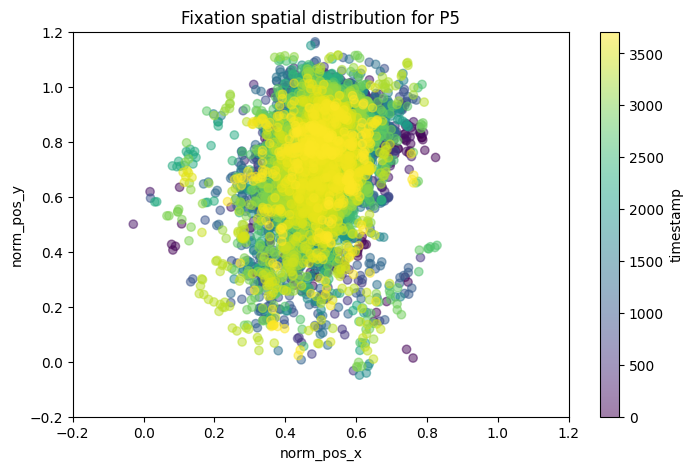

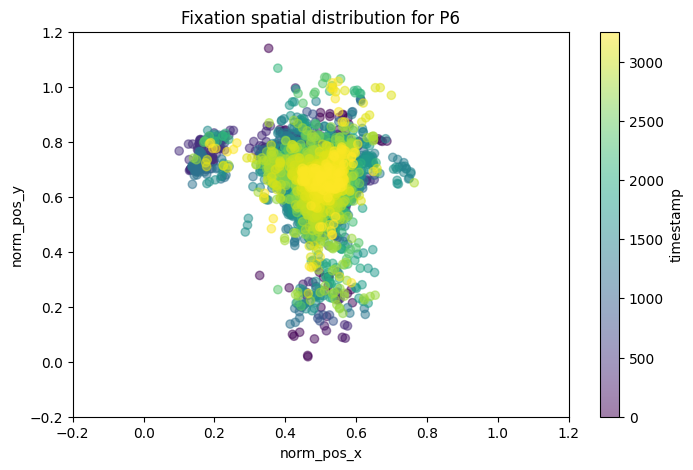

...

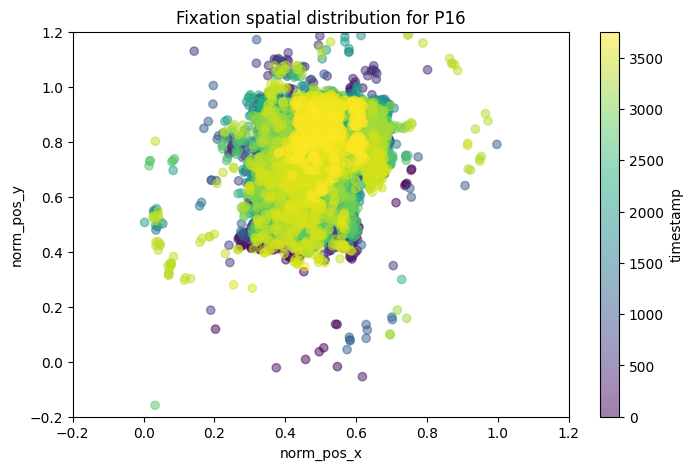

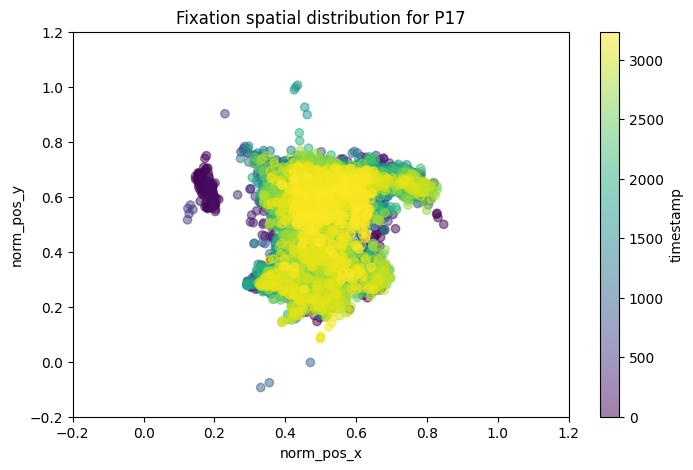

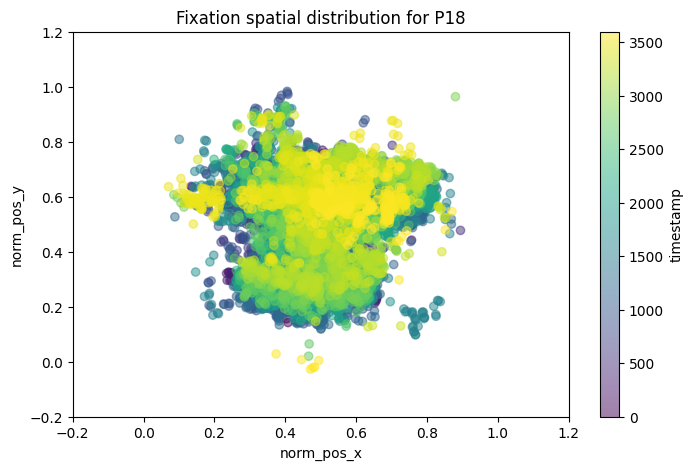

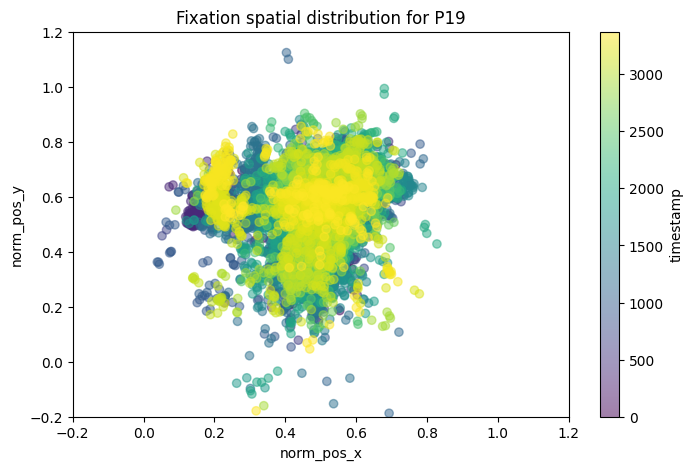

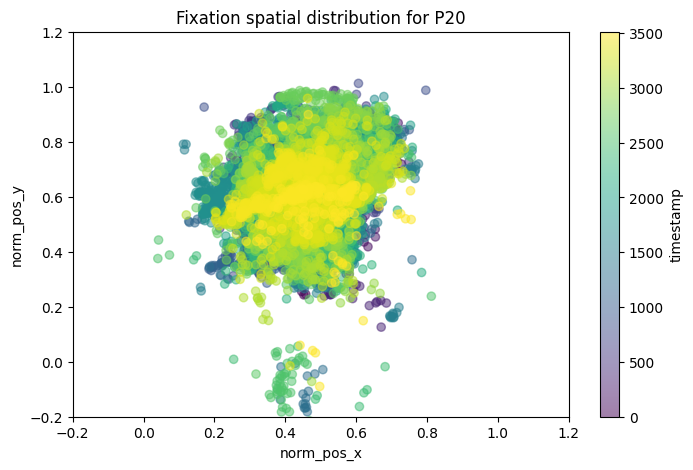

In [11]:
df['relative_timestamp'] = df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(8, 5))
    plt.scatter(participant_df['norm_pos_x'], participant_df['norm_pos_y'], c=participant_df['relative_timestamp'], alpha = 0.5)
    plt.colorbar().ax.set_ylabel('timestamp')
    plt.title(f'Fixation spatial distribution for P{pid}')
    plt.xlabel('norm_pos_x')
    plt.ylabel('norm_pos_y')
    plt.xlim(-0.2, 1.2)
    plt.ylim(-0.2, 1.2)
    plt.show()

### 3. Time-Series Assessment
Confidence, Duration, Dispersion, Normalized position, Occurences

##### Confidence over time
- Good

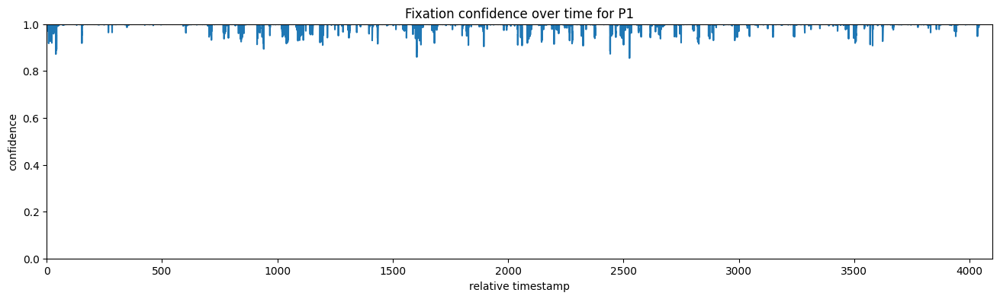

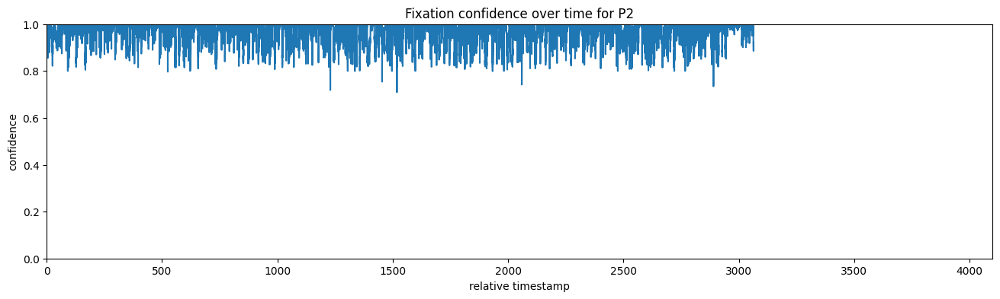

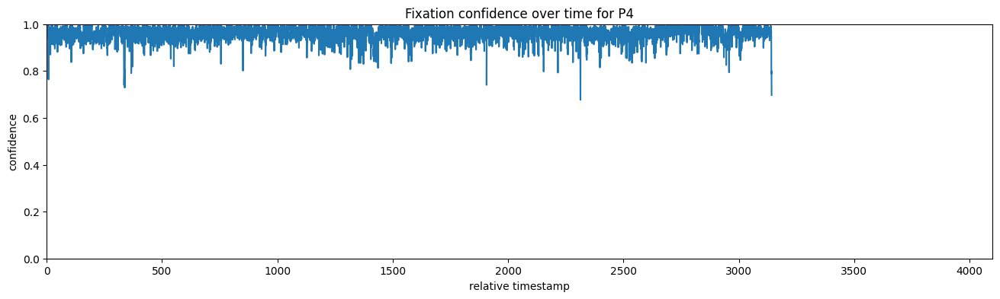

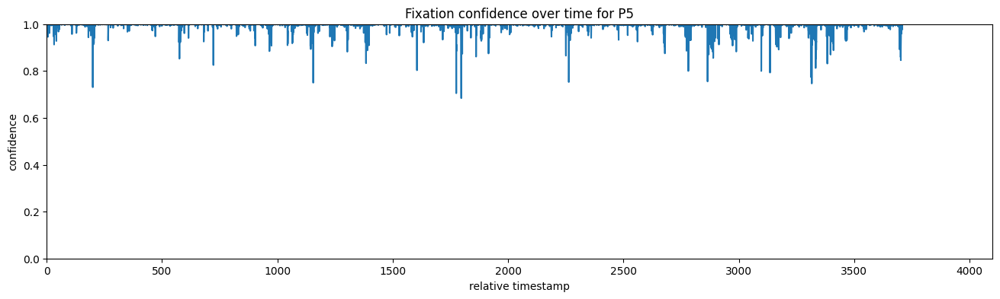

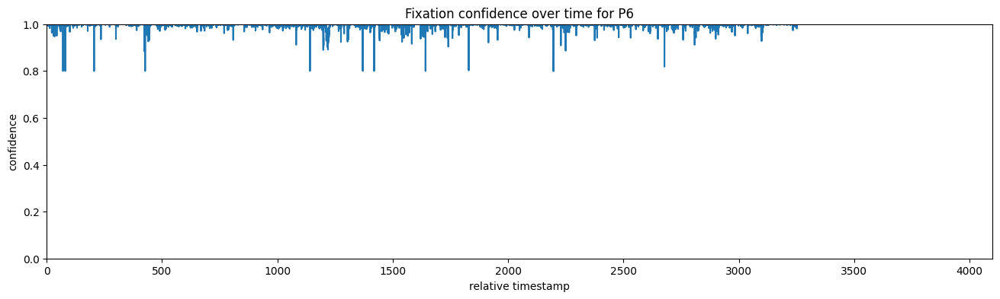

...

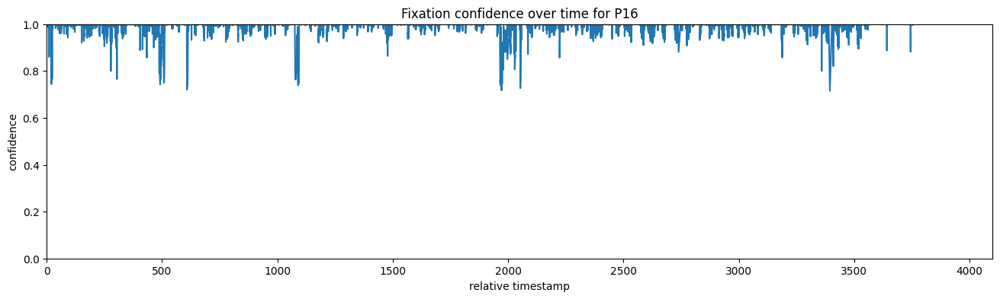

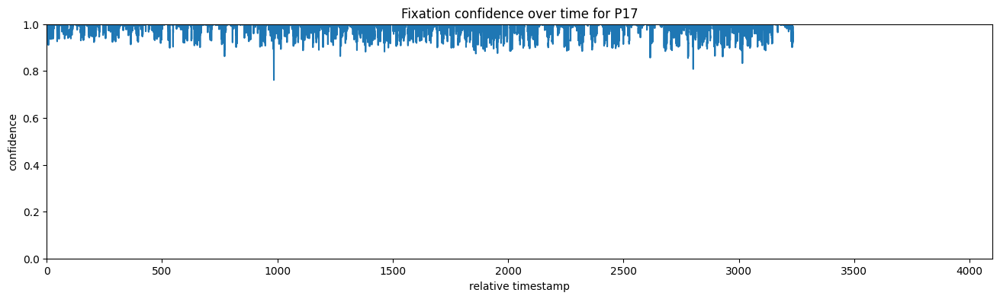

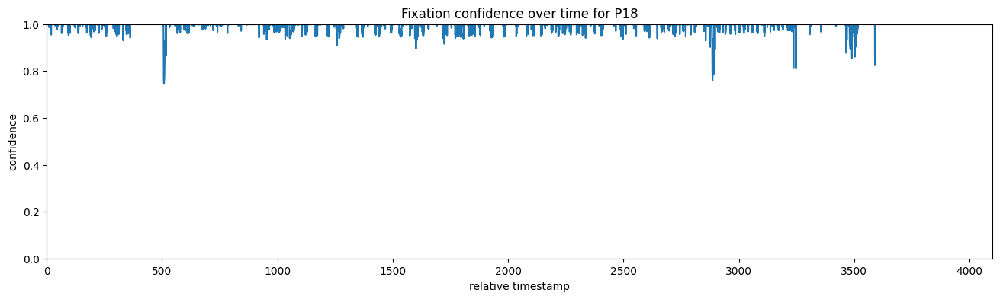

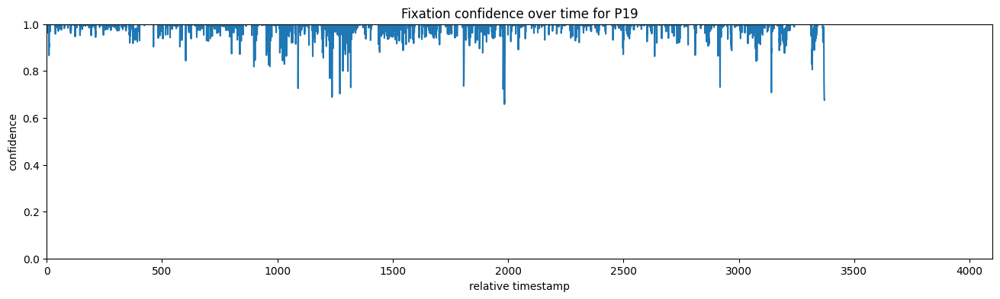

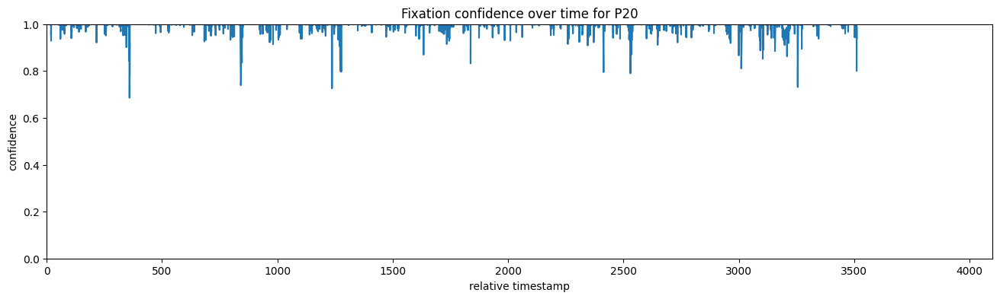

In [7]:
df['relative_timestamp'] = df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['confidence'])
    plt.title(f'Fixation confidence over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('confidence')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.show()

##### Duration over time
- Should be plotted event-related

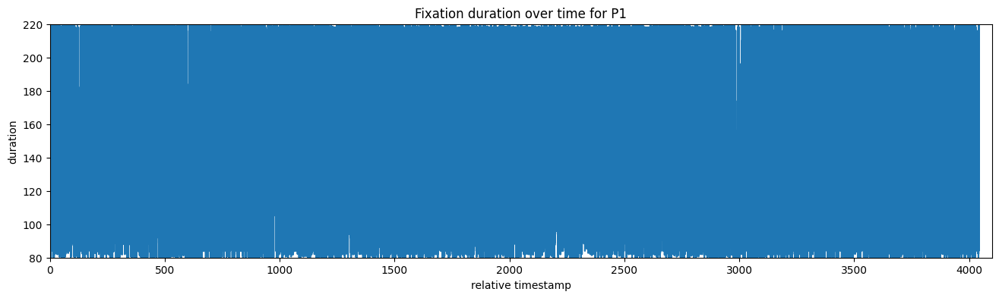

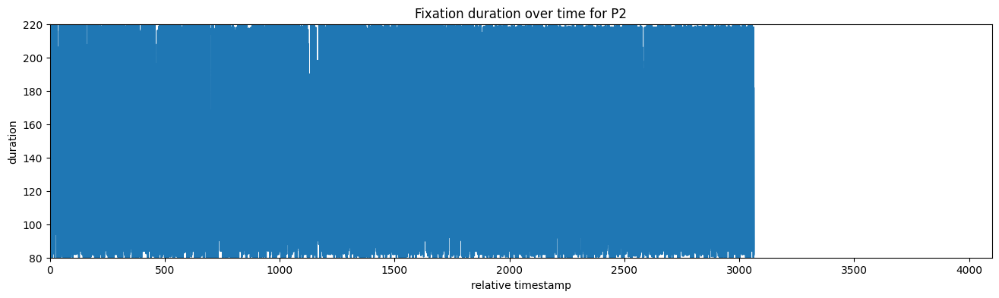

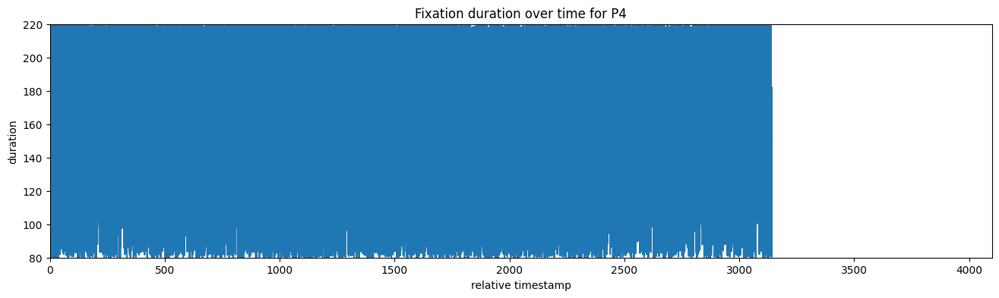

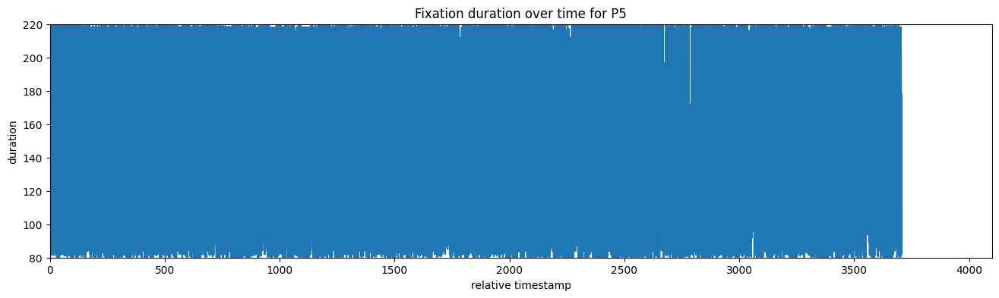

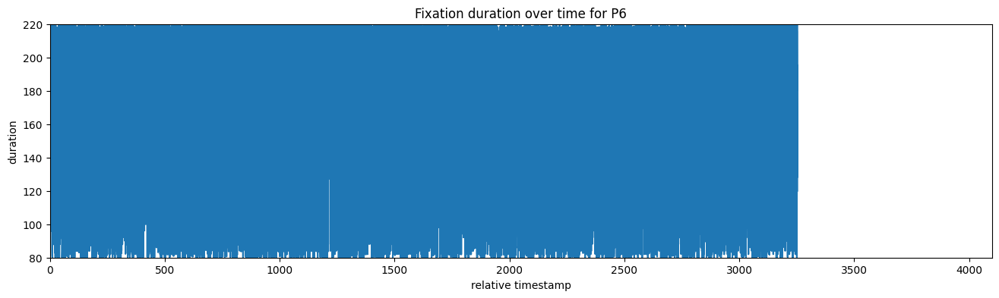

...

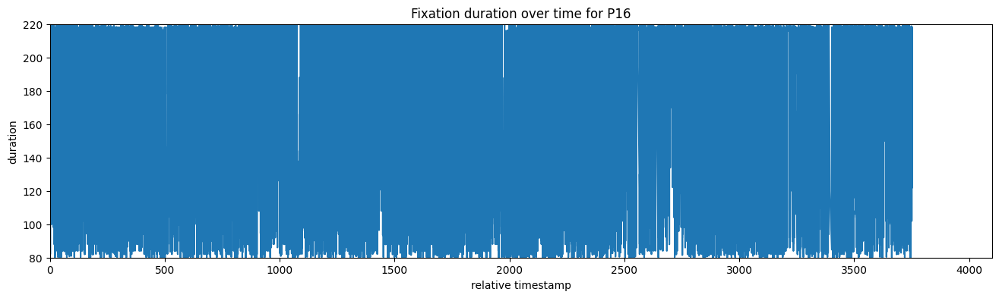

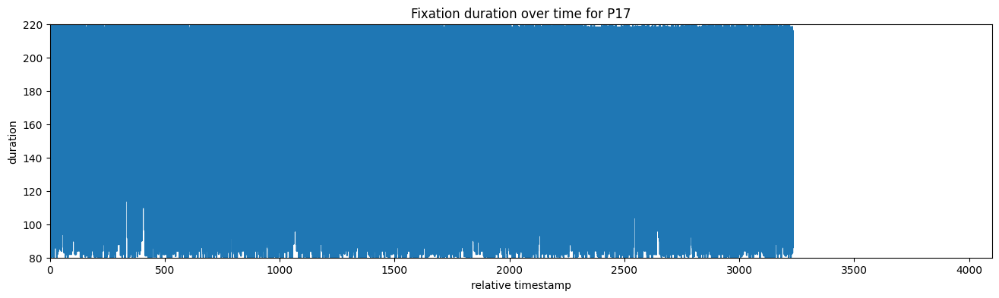

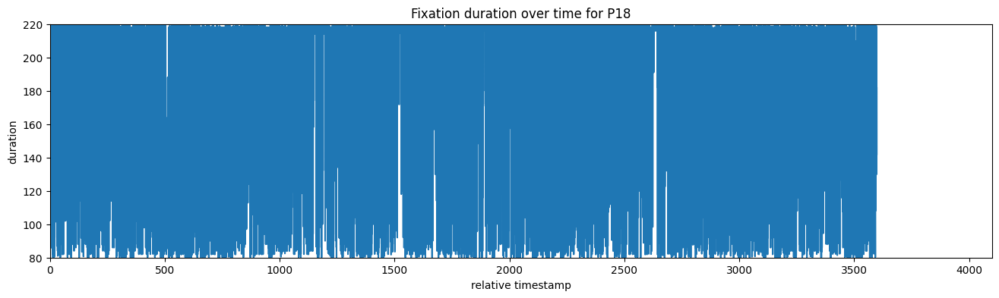

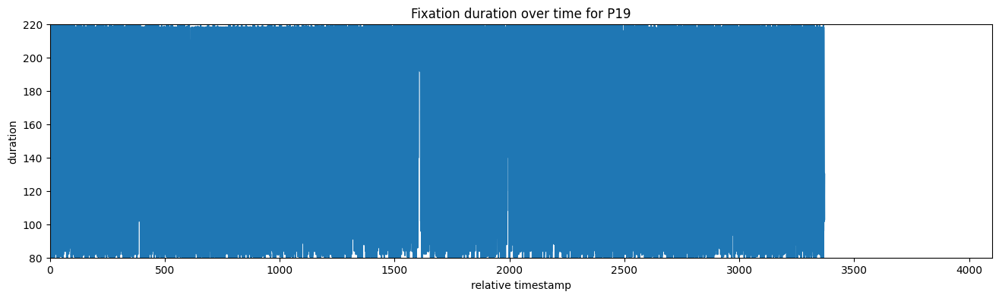

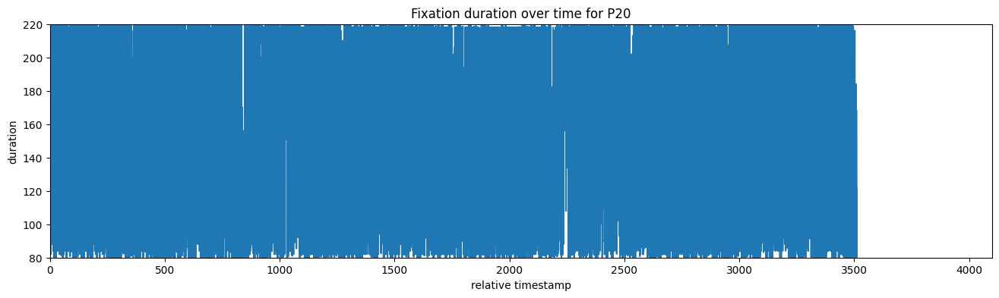

In [16]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['duration'])
    plt.title(f'Fixation duration over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('duration')
    plt.xlim(0, 4100)
    plt.ylim(80, 220)
    plt.show()

##### Dispersion over time
- Should be plotted event-related

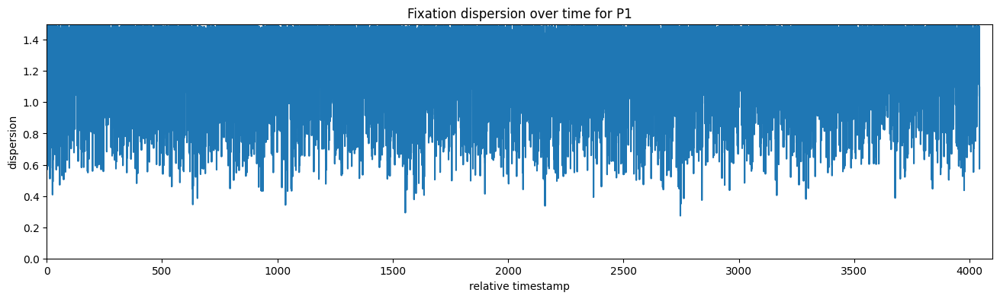

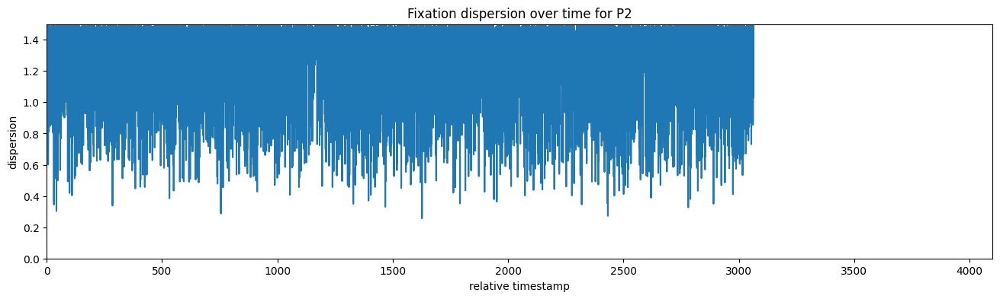

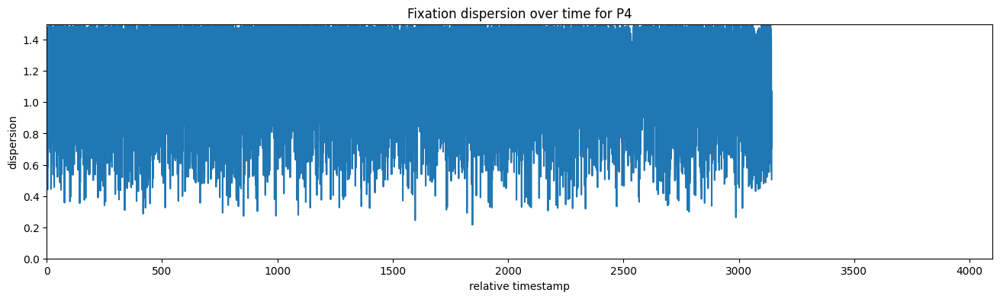

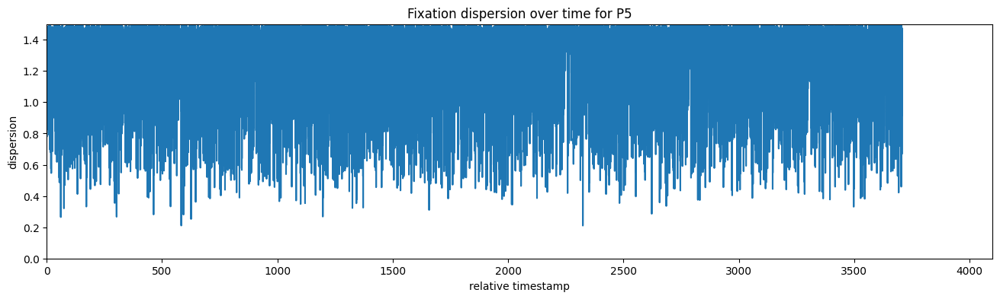

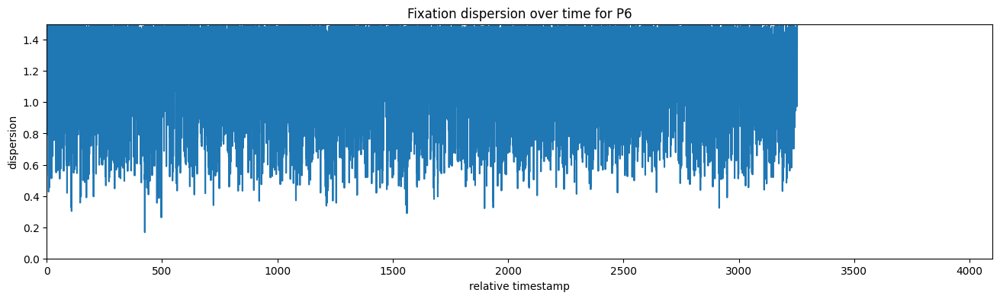

...

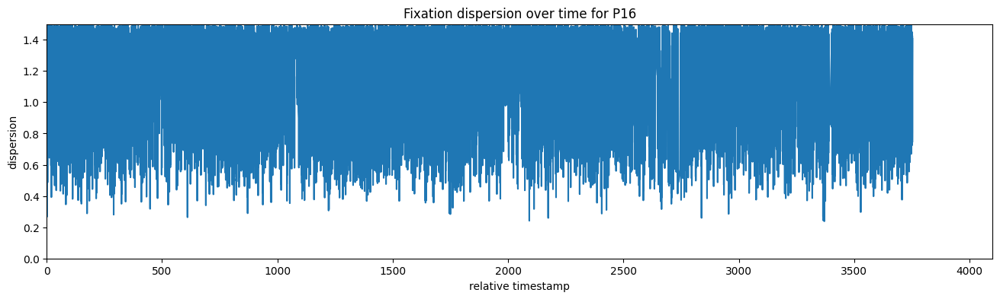

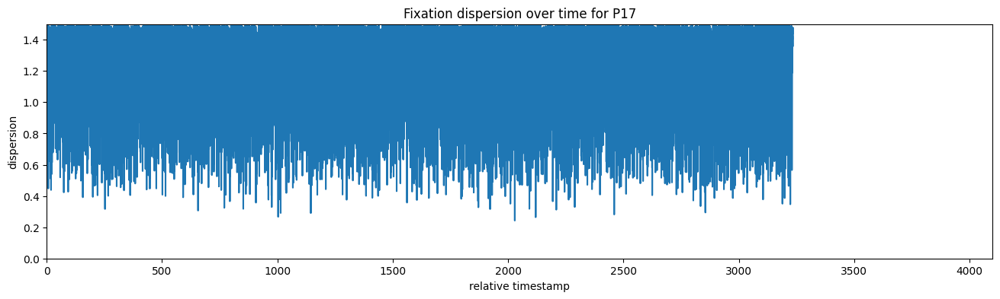

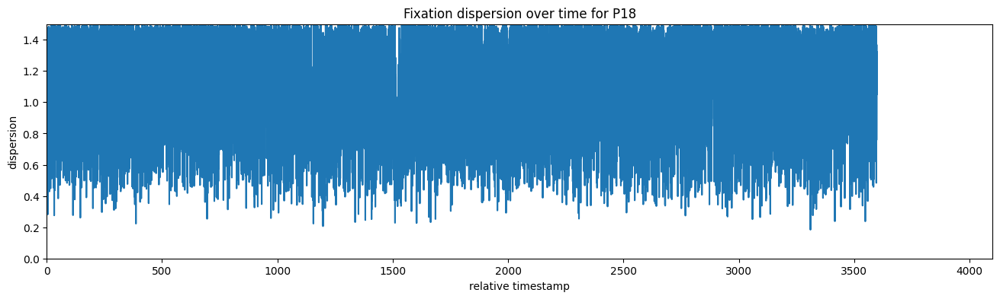

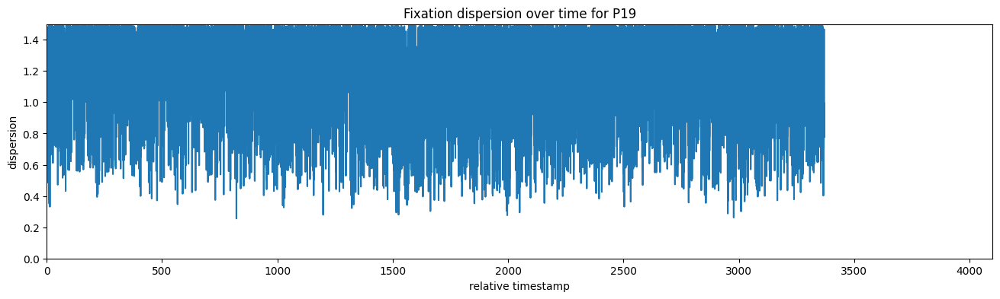

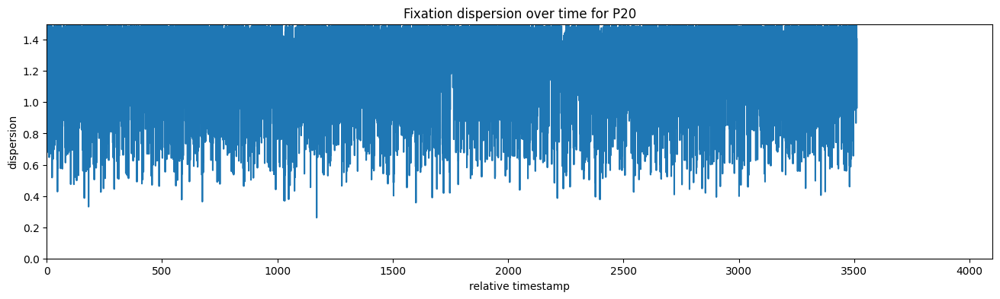

In [15]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['dispersion'])
    plt.title(f'Fixation dispersion over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('dispersion')
    plt.xlim(0, 4100)
    plt.ylim(0, 1.5)
    plt.show()

##### Normalized position over time
- Questionnaires might be detectable by smaller position changes over time (in some participants, ex. P18)

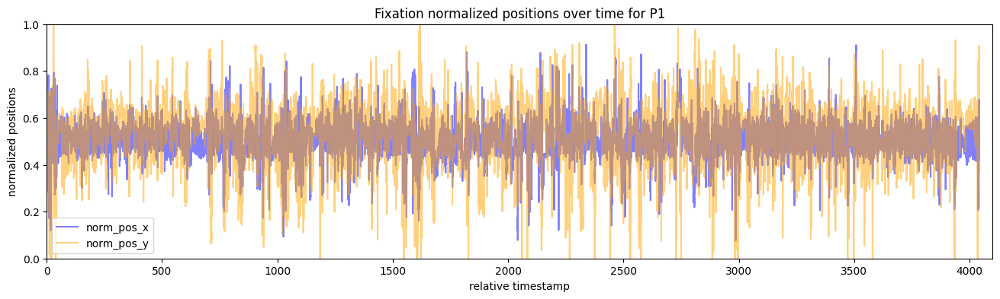

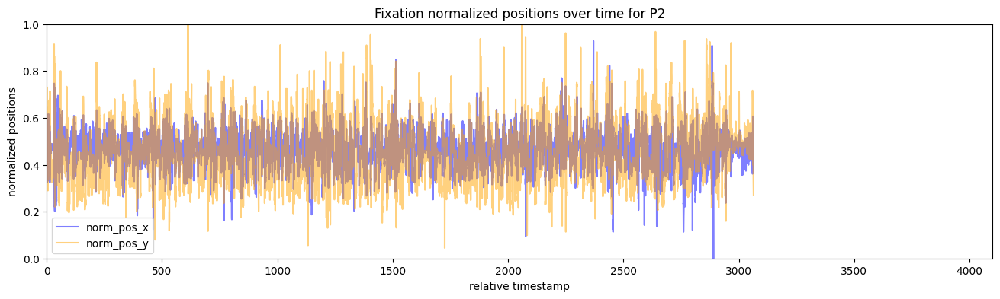

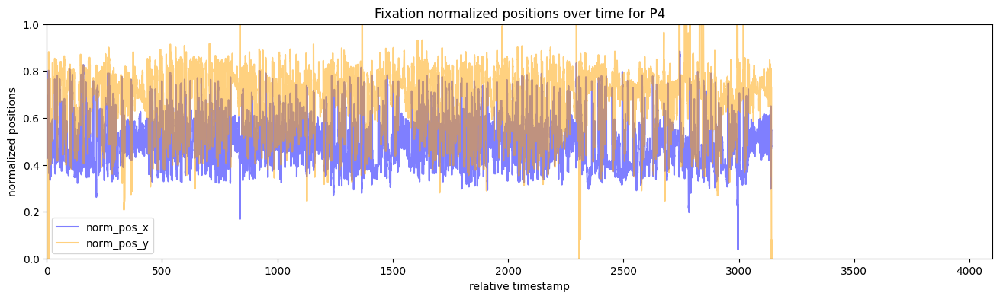

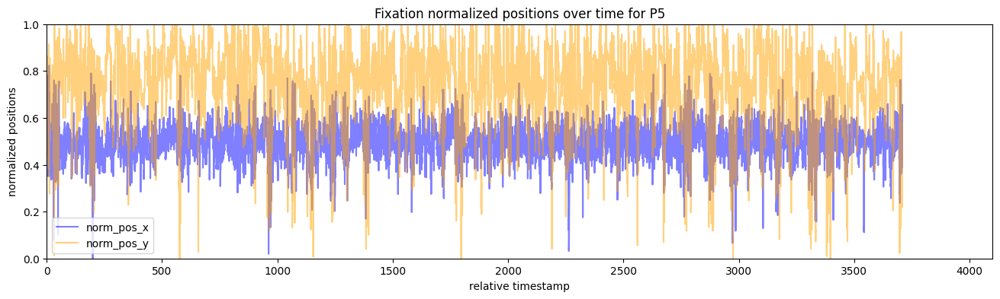

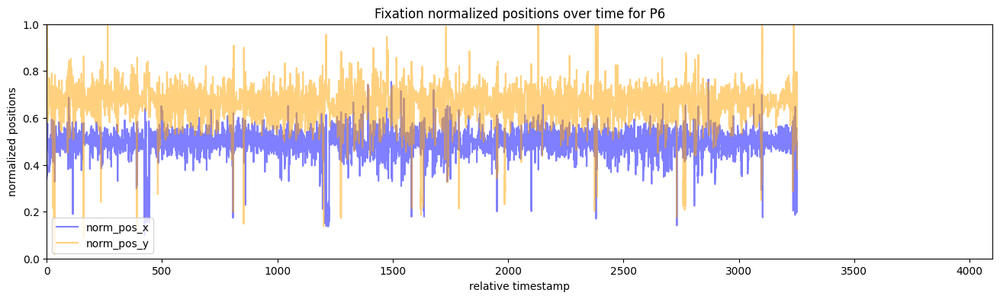

...

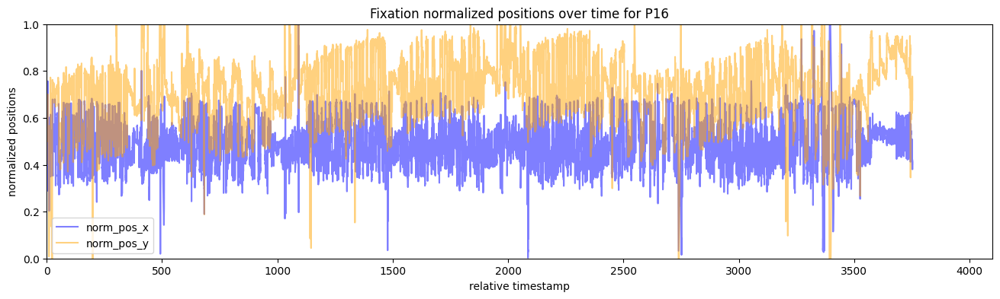

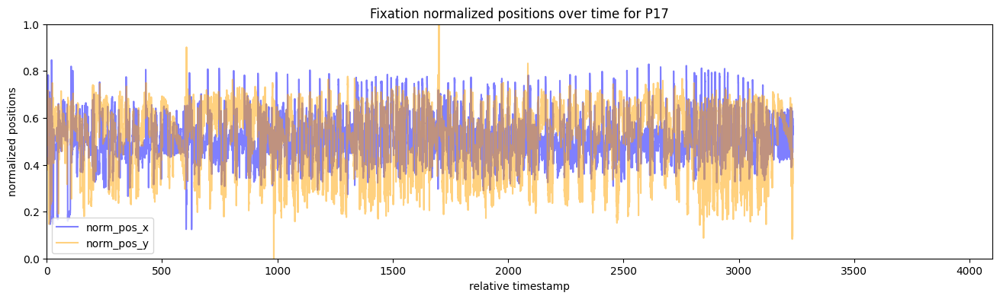

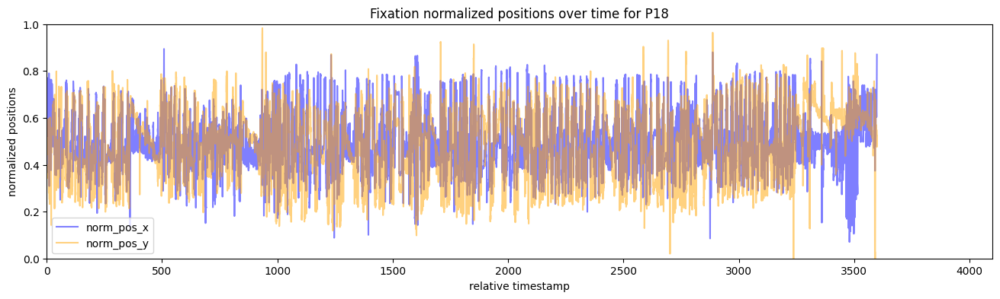

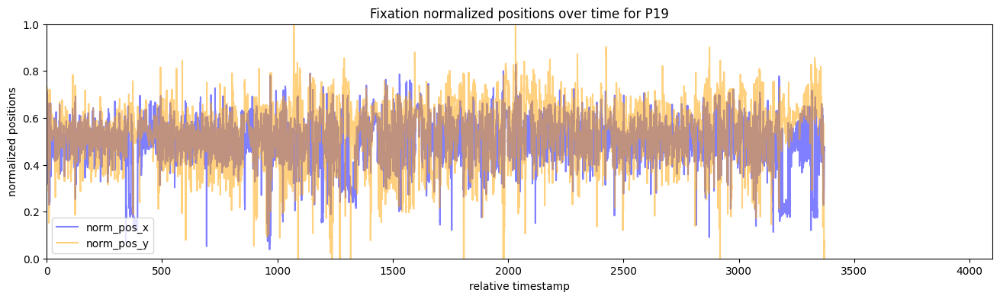

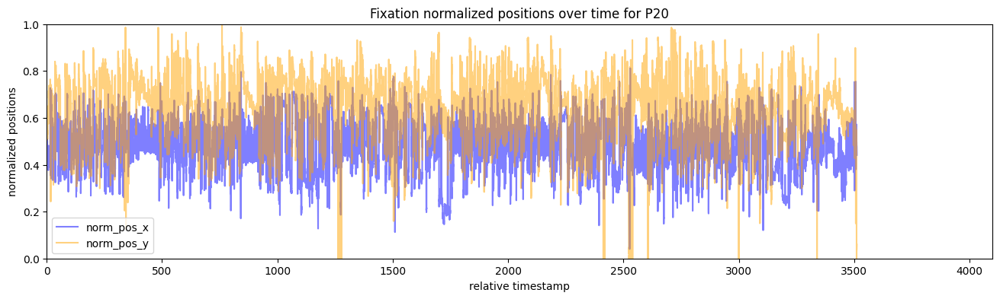

In [26]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')
    plt.title(f'Fixation normalized positions over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('normalized positions')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.legend(loc='lower left')
    plt.show()

##### Occurences
- Should be plotted event-related
- fixation concentrations in certain areas

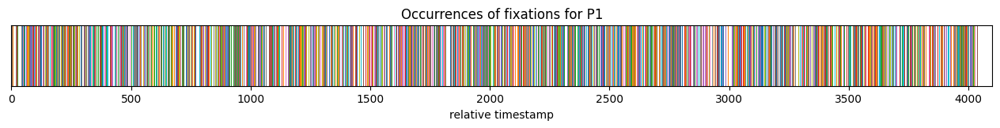

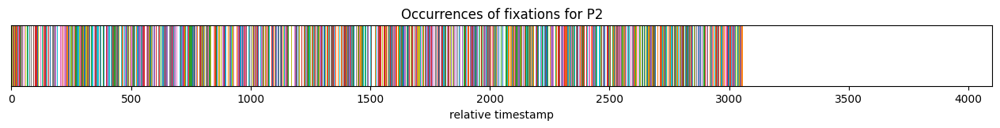

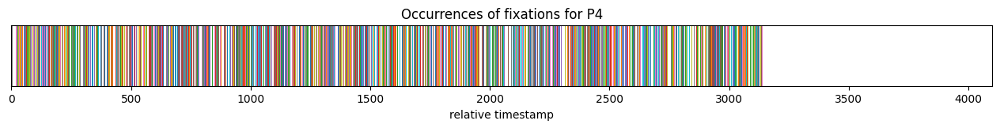

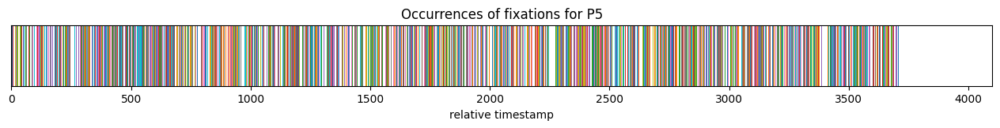

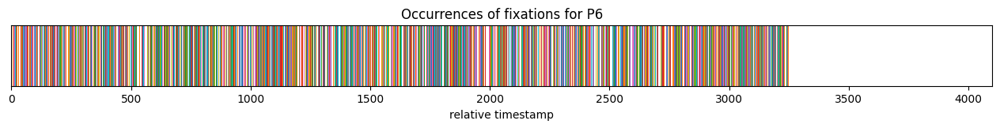

...

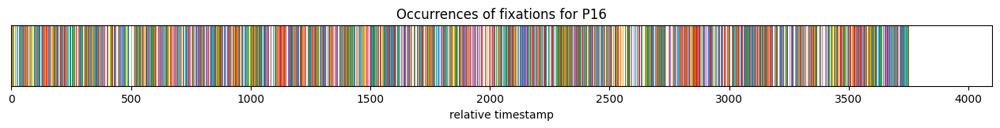

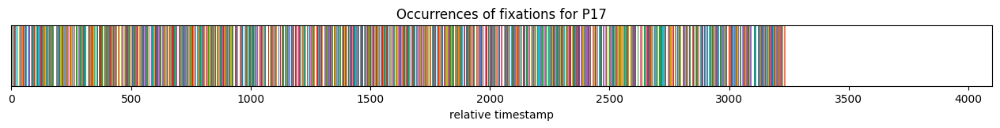

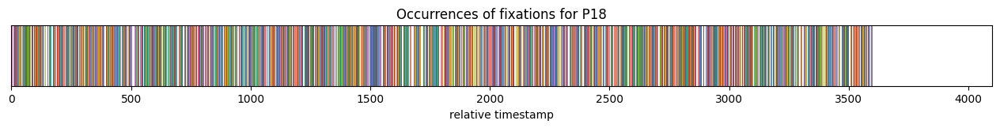

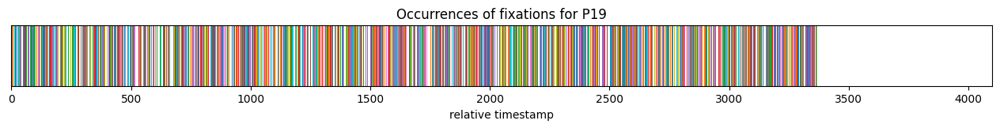

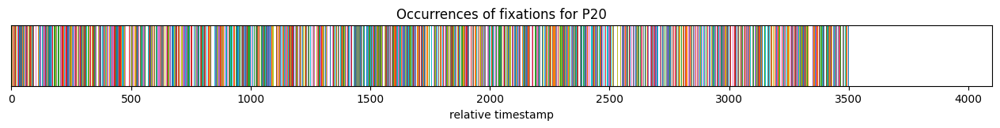

In [8]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 1))
    for _, row in participant_df.iterrows():
        start = row['relative_timestamp']
        duration = row['duration']/1000 #from [ms] to [s]
        plt.bar(start, 0.5, duration, align='edge')
    plt.title(f'Occurrences of fixations for P{pid}')
    plt.xlabel('relative timestamp')
    plt.xlim(0, 4100)
    plt.ylim(0, 0.5)
    plt.gca().get_yaxis().set_visible(False)
    plt.show()

### 4. Case-Specific Check-Ups

##### P18 fixation duration
- Same number of fixations
- Slightly less dispersion

In [18]:
for pid in [16,17,18,19,20]:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 16'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000,18311.000000
mean,9156.000000,89591.500645,173.492894,0.486452,0.723267,1.168861,0.994055
std,5286.074725,1082.641243,49.492159,0.092512,0.129629,0.287607,0.019695
min,1.000000,87725.756113,80.000500,0.002752,-0.639154,0.237913,0.715034
25%,4578.500000,88654.408391,128.057500,0.425627,0.645053,0.959423,0.999233
50%,9156.000000,89566.889724,194.060000,0.481309,0.730026,1.256333,1.000000
75%,13733.500000,90548.060535,217.983000,0.541508,0.806168,1.418184,1.000000
max,18311.000000,91478.562622,318.313000,1.148954,2.301729,1.499999,1.000000


'Participant 17'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000,17029.000000
mean,8514.000000,4278.561592,162.805939,0.504544,0.520530,1.217997,0.988329
std,4915.993202,932.410596,51.118927,0.087176,0.136332,0.273168,0.020815
min,0.000000,2660.008995,80.000500,0.123815,-0.093723,0.242376,0.761768
25%,4257.000000,3469.483141,113.820000,0.456128,0.408701,1.044976,0.986639
50%,8514.000000,4278.515226,168.351500,0.495913,0.557156,1.327578,0.998843
75%,12771.000000,5085.905386,217.348500,0.547760,0.635128,1.436364,1.000000
max,17028.000000,5894.367559,220.000000,0.846970,1.005705,1.499999,1.000000


'Participant 18'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,17272.00000,17272.000000,17272.000000,17272.000000,17272.000000,17272.000000,17272.000000
mean,8635.50000,5849.735453,178.542519,0.496239,0.489848,1.105451,0.997049
std,4986.14126,1038.145030,48.868659,0.117396,0.148092,0.320532,0.011490
min,0.00000,4062.962759,80.002000,0.070289,-0.356460,0.183769,0.744577
25%,4317.75000,4943.459526,135.967375,0.427386,0.378262,0.846810,1.000000
50%,8635.50000,5848.962909,215.973500,0.483538,0.503395,1.171758,1.000000
75%,12953.25000,6747.922485,218.001000,0.557896,0.605279,1.405240,1.000000
max,17271.00000,7661.541054,220.000000,0.894336,0.983122,1.499962,1.000000


'Participant 19'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000,16554.000000
mean,8277.500000,73269.003160,155.315049,0.495829,0.549055,1.225674,0.993686
std,4778.872513,978.661952,52.834860,0.094265,0.114771,0.273015,0.021203
min,1.000000,71588.590443,80.000000,0.038650,-0.272597,0.255649,0.658114
25%,4139.250000,72407.406907,102.029000,0.459996,0.496552,1.062785,0.999444
50%,8277.500000,73282.242510,154.071250,0.502042,0.560304,1.339708,1.000000
75%,12415.750000,74119.042655,216.064500,0.547710,0.619328,1.438783,1.000000
max,16554.000000,74959.321855,265.074000,0.827845,1.124052,1.499997,1.000000


'Participant 20'

,id,start_timestamp,duration,norm_pos_x,norm_pos_y,dispersion,confidence
count,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000,18063.000000
mean,9035.000000,82225.173270,154.183571,0.478285,0.638400,1.259405,0.997721
std,5214.483292,1017.317092,50.161129,0.101610,0.134398,0.234115,0.011727
min,4.000000,80485.491981,80.000000,0.040130,-0.245710,0.261201,0.685499
25%,4519.500000,81339.201630,106.209750,0.421809,0.564334,1.137712,0.999891
50%,9035.000000,82220.045826,151.975500,0.481414,0.656442,1.346095,1.000000
75%,13550.500000,83113.275951,215.905000,0.542218,0.729496,1.440116,1.000000
max,18066.000000,83997.188042,220.000000,0.812082,1.012090,1.499987,1.000000


##### P11 surface fixation y-shift
- SOLVED: eyeglasses hand adjustment after 14.5 minutes, surface position decalibration (surface data affected)

In [4]:
# Load surf_fix handling repeated rows
surf_df = data['all_fixations_on_surface_HiDrive_Studie2'].compute()
surf_df = surf_df.groupby(['participant_id', 'fixation_id']).agg({
    'world_timestamp': 'first',
    'start_timestamp': 'first',
    'duration': 'first',
    'dispersion': 'first',
    'norm_pos_x': 'first',
    'norm_pos_y': 'first',
    'x_scaled': 'first',
    'y_scaled': 'first',
    'on_surf': 'first',
    'world_index': lambda x: list(x)  # Aggregate world_index into a list
}).reset_index()

# Rename the aggregated world_index column to world_indexes
surf_df = surf_df.rename(columns={'world_index': 'world_indexes'})
surf_ddf = dd.from_pandas(surf_df, npartitions=2)

In [5]:
# Load surf_gaze
surf_gaze_ddf = data['all_gaze_positions_on_surface_HiDrive_Studie2'].iloc[:, 1:]
surf_gaze_df = surf_gaze_ddf.compute()

In [6]:
# Load gaze
gaze_ddf = data['all_gaze_positions'].iloc[:, 1:]
gaze_df = gaze_ddf.compute()

In [7]:
# Compute p11 df and relative_timestamps
p11_df = df[df['participant_id'] == 11].copy()
p11_surf_df = surf_df[surf_df['participant_id'] == 11].copy()
p11_surf_gaze_df = surf_gaze_df[surf_gaze_df['participant_id'] == 11].copy()
p11_gaze_df = gaze_df[gaze_df['participant_id'] == 11].copy()

p11_df['relative_timestamp'] = p11_df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
p11_surf_df['relative_timestamp'] = p11_surf_df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
p11_surf_gaze_df['relative_timestamp'] = p11_surf_gaze_df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())
p11_gaze_df['relative_timestamp'] = p11_gaze_df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())

p11_df['relative_time'] = p11_df['relative_timestamp']/60
p11_surf_df['relative_time'] = p11_surf_df['relative_timestamp']/60
p11_surf_gaze_df['relative_time'] = p11_surf_gaze_df['relative_timestamp']/60
p11_gaze_df['relative_time'] = p11_gaze_df['relative_timestamp']/60

In [8]:
x_lowerlim = 6
x_upperlim = 22

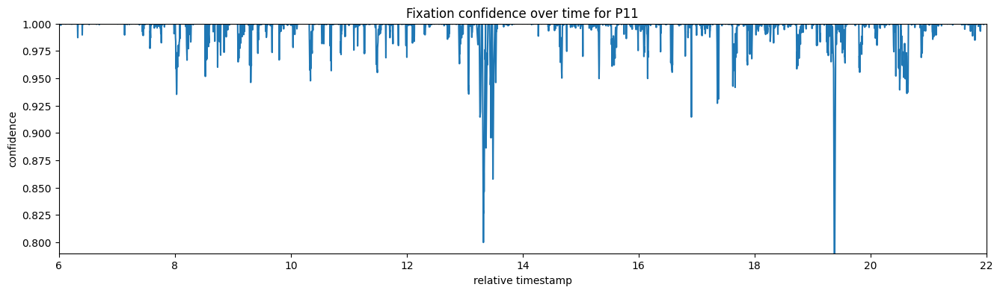

In [186]:
# Fixation confidence over time
plt.figure(figsize=(16, 4))
plt.plot(p11_df['relative_time'], p11_df['confidence'])
plt.title(f'Fixation confidence over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('confidence')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(.79, 1)
plt.show()

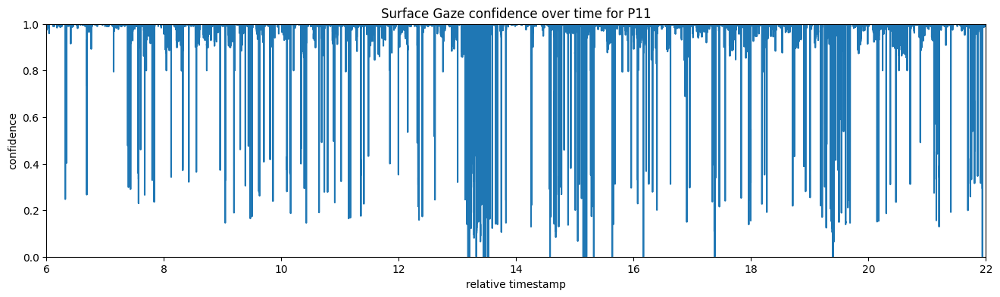

In [77]:
# Surface gaze confidence over time
plt.figure(figsize=(16, 4))
plt.plot(p11_surf_gaze_df['relative_time'], p11_surf_gaze_df['confidence'])
plt.title(f'Surface Gaze confidence over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('confidence')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(0, 1)
plt.show()

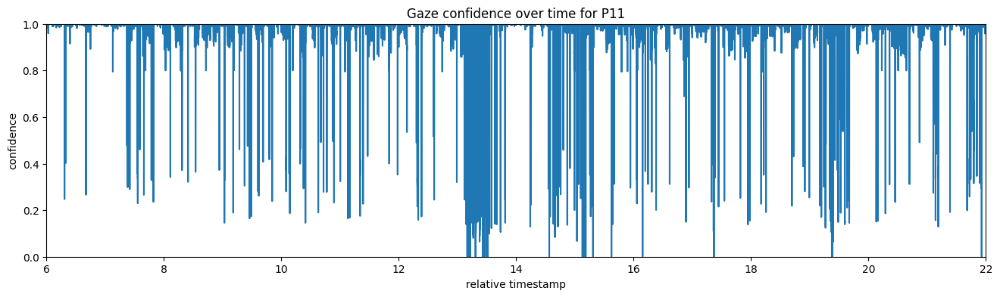

In [78]:
# Gaze confidence over time
plt.figure(figsize=(16, 4))
plt.plot(p11_gaze_df['relative_time'], p11_gaze_df['confidence'])
plt.title(f'Gaze confidence over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('confidence')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(0, 1)
plt.show()

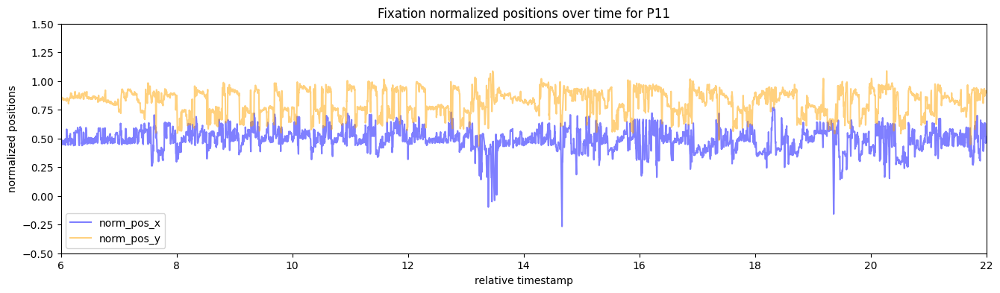

In [188]:
# Fixation position over time 
plt.figure(figsize=(16, 4))
plt.plot(p11_df['relative_time'], p11_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
plt.plot(p11_df['relative_time'], p11_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')
plt.title(f'Fixation normalized positions over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('normalized positions')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(-.5, 1.5)
plt.legend(loc='lower left')
plt.show()

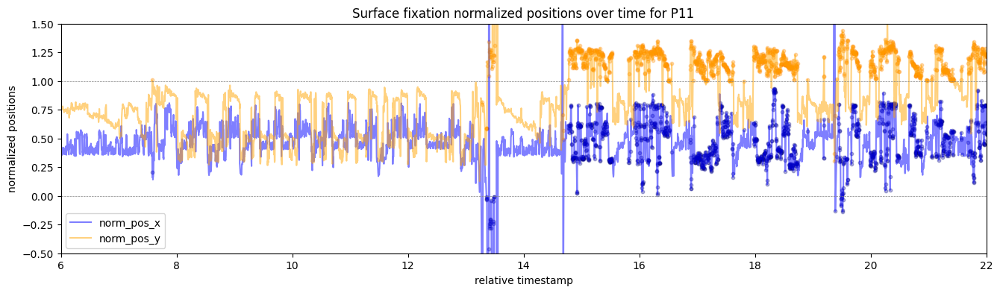

In [245]:
# Surface fixation position over time
off_surface = p11_surf_df[p11_surf_df['on_surf'] == False]
plt.figure(figsize=(16, 4))

plt.plot(p11_surf_df['relative_time'], p11_surf_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
plt.plot(p11_surf_df['relative_time'], p11_surf_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')
plt.scatter(off_surface['relative_time'], off_surface['norm_pos_x'], s=10, alpha =.3, color='darkblue')
plt.scatter(off_surface['relative_time'], off_surface['norm_pos_y'], s=10, alpha =.3, color='darkorange')
plt.axhline(y=1, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='grey', linestyle='--', linewidth=0.5)

plt.title(f'Surface fixation normalized positions over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('normalized positions')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(-.5, 1.5)
plt.legend(loc='lower left')
plt.show()

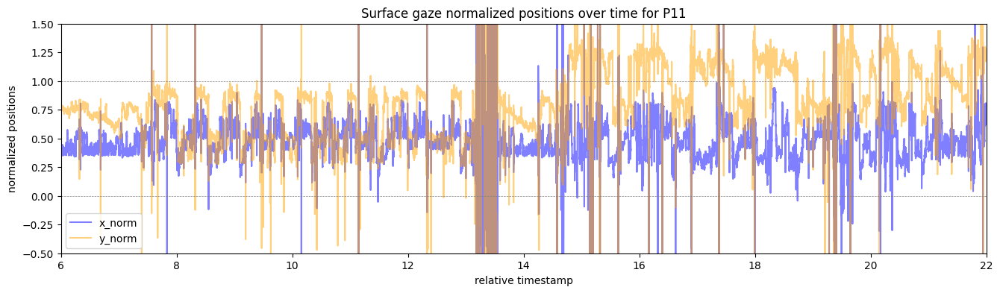

In [39]:
# Surface gaze position over time 
off_surface = p11_surf_gaze_df[p11_surf_gaze_df['on_surf'] == False]
plt.figure(figsize=(16, 4))

plt.plot(p11_surf_gaze_df['relative_time'], p11_surf_gaze_df['x_norm'], alpha = 0.5, color='blue', label='x_norm')
plt.plot(p11_surf_gaze_df['relative_time'], p11_surf_gaze_df['y_norm'], alpha = 0.5, color='orange', label='y_norm')
# plt.scatter(off_surface['relative_time'], off_surface['x_norm'], s=10, alpha =.1, color='darkblue')
# plt.scatter(off_surface['relative_time'], off_surface['y_norm'], s=10, alpha =.1, color='darkorange')
plt.axhline(y=1, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='grey', linestyle='--', linewidth=0.5)

plt.title(f'Surface gaze normalized positions over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('normalized positions')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(-.5, 1.5)
plt.legend(loc='lower left')
plt.show()

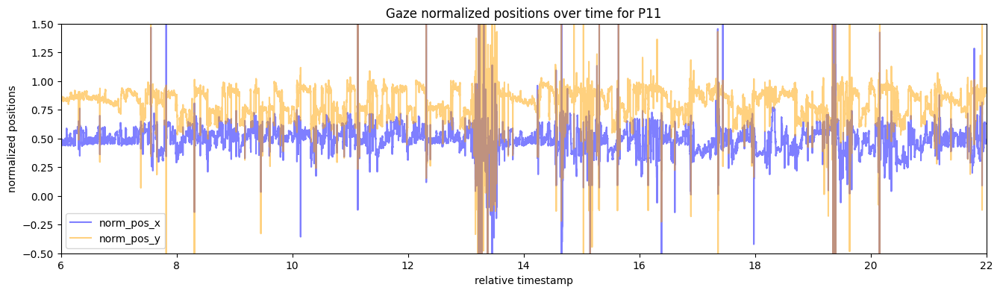

In [23]:
# Surface gaze position over time 
plt.figure(figsize=(16, 4))

plt.plot(p11_gaze_df['relative_time'], p11_gaze_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
plt.plot(p11_gaze_df['relative_time'], p11_gaze_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')

plt.title(f'Gaze normalized positions over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('normalized positions')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(-.5, 1.5)
plt.legend(loc='lower left')
plt.show()

In [191]:
# Fixation minimum
fix_minimum_ts =p11_df.loc[p11_df['norm_pos_x'].idxmin()]['relative_timestamp']
fix_minimum_ts/60

14.665496658333298

In [192]:
# Previous fixation minimum
p11_df.loc[p11_df[p11_df['relative_timestamp'] < fix_minimum_ts]['norm_pos_x'].idxmin()]['relative_timestamp']/60

13.391296774999985

In [193]:
# Surface fixation minimum
surf_fix_minimum_ts = p11_surf_df.loc[p11_surf_df['norm_pos_x'].idxmin()]['relative_timestamp']
surf_fix_minimum_ts/60

13.464962683333276

In [194]:
# Next Surface fixation minimum
mask = (p11_surf_df['relative_timestamp'] > surf_fix_minimum_ts) & (p11_surf_df['relative_timestamp'] < 1000)
p11_surf_df.loc[p11_surf_df[mask]['norm_pos_x'].idxmin()]['relative_timestamp']/60

13.51176363333331

!!!
After cheacking the world camera registration, it seems like those wide flactuations on x and y axes are due to the participant looking (and talking?) to the researcher.  
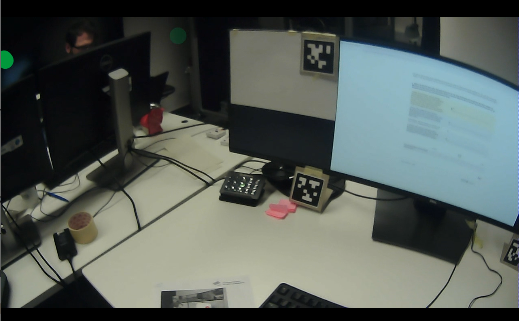

GAZE
- Gaze position : (normalized) Uses 2D pupil detection result as an input. Linear regression to fit polynomial features to the screen coordinates in order to capture non-linear relationships. (works better than fitting a polynomial regression straightforward for multivariate datasets)

FIXATION
- Fixation confidence: mean of the related gaze positions confidences  
- Fixation duration: time difference btw 1st and last gaze point
- Fixation positions: (normalized) mean of the normalized positions of all gaze points in the fixation

SURFACE
- Gaze position: From gaze 2d data. Correction for camera lens distortion and camera perspective of the surface.
- Fixation position: From fixation 2d data. Correction for camera lens distortion and camera perspective of the surface.  

--> Surface Gaze and Surface Fixation are not directly related.  
Therefore, given that the error is visible in both the data, a similar erroneous calculation must have been occured.  

CHECK HOMOGRAPHIES AND TRANSFORMATION MATRICES (to_surf) over time

In [9]:
# Load surface positions
surf_pos_df = data['all_surf_positions_HiDrive_Studie2'].iloc[:, 1:]

In [10]:
# Compute p11 df and world_relative_timestamps
p11_surf_pos_df = surf_pos_df[surf_pos_df['participant_id'] == 11].copy()

p11_surf_pos_df['world_relative_timestamp'] = p11_surf_pos_df.groupby('participant_id')['world_timestamp'].transform(lambda x: x - x.min())
p11_surf_df['world_relative_timestamp'] = p11_surf_df.groupby('participant_id')['world_timestamp'].transform(lambda x: x - x.min())
p11_surf_gaze_df['world_relative_timestamp'] = p11_surf_gaze_df.groupby('participant_id')['world_timestamp'].transform(lambda x: x - x.min())

p11_surf_pos_df['world_relative_time'] = p11_surf_pos_df['world_relative_timestamp']/60
p11_surf_df['world_relative_time'] = p11_surf_df['world_relative_timestamp']/60
p11_surf_gaze_df['world_relative_time'] = p11_surf_gaze_df['world_relative_timestamp']/60

In [11]:
p11_surf_pos_df.head(1)

,participant_id,world_index,world_timestamp,img_to_surf_trans,surf_to_img_trans,num_detected_markers,dist_img_to_surf_trans,surf_to_dist_img_trans,num_definition_markers,world_relative_timestamp,world_relative_time
863884,11,0,16541.754802,"[[0.00131352521, -0.00042336503, -0.0863554607...","[[767.393908, -169.334255, 232.269048], [20.34...",3,"[[0.0013768176, -0.000213225675, -0.26925606],...","[[741.973503, -95.4442108, 273.670202], [44.68...",4,0.0,0.0


In [12]:
p11_surf_pos_df['img_to_surf_trans'].iloc[0]

[[0.00131352521, -0.00042336503, -0.0863554607],
 [9.13140217e-05, -0.00291962659, 1.48724494],
 [3.21667952e-05, -0.000729778888, 1.36957623]]

In [13]:
# Calculate the difference between consecutive transformation matrices
p11_surf_pos_df['img_to_surf_trans_matrix'] = p11_surf_pos_df['img_to_surf_trans'].apply(lambda x: np.array(x))
p11_surf_pos_df['img_to_surf_trans_norm'] = p11_surf_pos_df['img_to_surf_trans_matrix'].apply(lambda x: np.linalg.norm(x) if isinstance(x, np.ndarray) else 0) # if condition for the first element
p11_surf_pos_df['img_to_surf_trans_diff'] = p11_surf_pos_df['img_to_surf_trans_matrix'].diff().apply(lambda x: np.linalg.norm(x) if isinstance(x, np.ndarray) else 0)


In [14]:
p11_surf_pos_df[['world_timestamp', 'img_to_surf_trans_norm','img_to_surf_trans_diff']].head(3)

,world_timestamp,img_to_surf_trans_norm,img_to_surf_trans_diff
863884,16541.754802,2.023637,0.000000
863885,16541.896132,1.983596,0.045849
863886,16541.950572,2.018831,0.039808


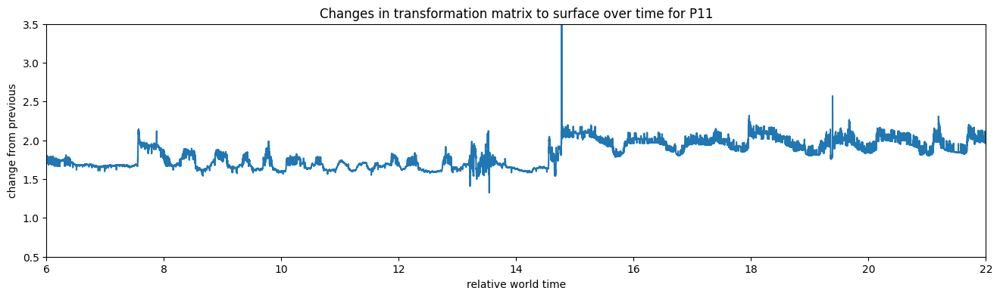

In [15]:
# Transform matrix changes over time
plt.figure(figsize=(16, 4))

plt.plot(p11_surf_pos_df['world_relative_time'], p11_surf_pos_df['img_to_surf_trans_norm'])

plt.title(f'Changes in transformation matrix to surface over time for P11')
plt.xlabel('relative world time')
plt.ylabel('change from previous')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(.5, 3.5)
# plt.legend(loc='lower left')
plt.show()

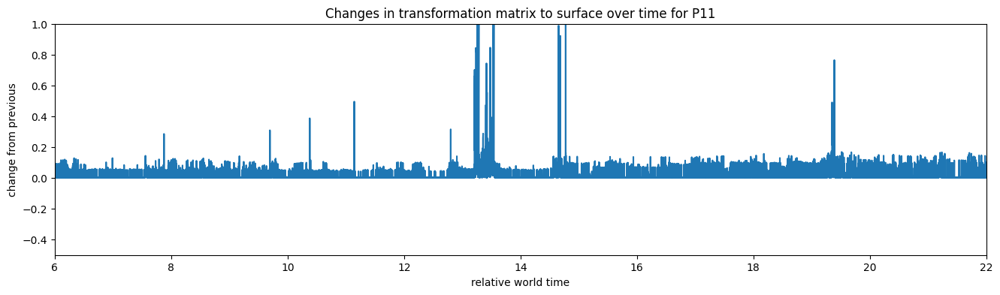

In [16]:
# Transform matrix changes over time
plt.figure(figsize=(16, 4))

plt.plot(p11_surf_pos_df['world_relative_time'], p11_surf_pos_df['img_to_surf_trans_diff'])

plt.title(f'Changes in transformation matrix to surface over time for P11')
plt.xlabel('relative world time')
plt.ylabel('change from previous')
plt.xlim(x_lowerlim, x_upperlim)
plt.ylim(-.5, 1)
# plt.legend(loc='lower left')
plt.show()

In [17]:
# Extract matrix elements
p11_surf_pos_df_expanded = p11_surf_pos_df.copy()
for i in range(3):
    for j in range(3):
        p11_surf_pos_df_expanded[f'img_to_surf_trans_{i}{j}'] = p11_surf_pos_df_expanded['img_to_surf_trans'].apply(lambda x: x[i][j])

AFFINE TRANSFORMATIONS:  
https://en.wikipedia.org/wiki/Affine_transformation  

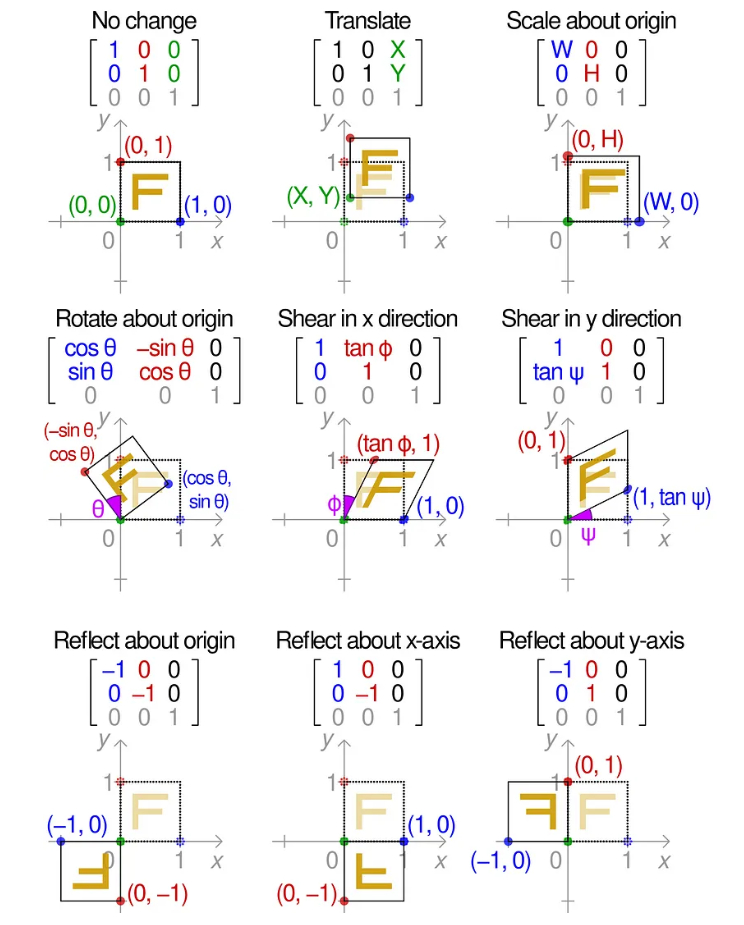  

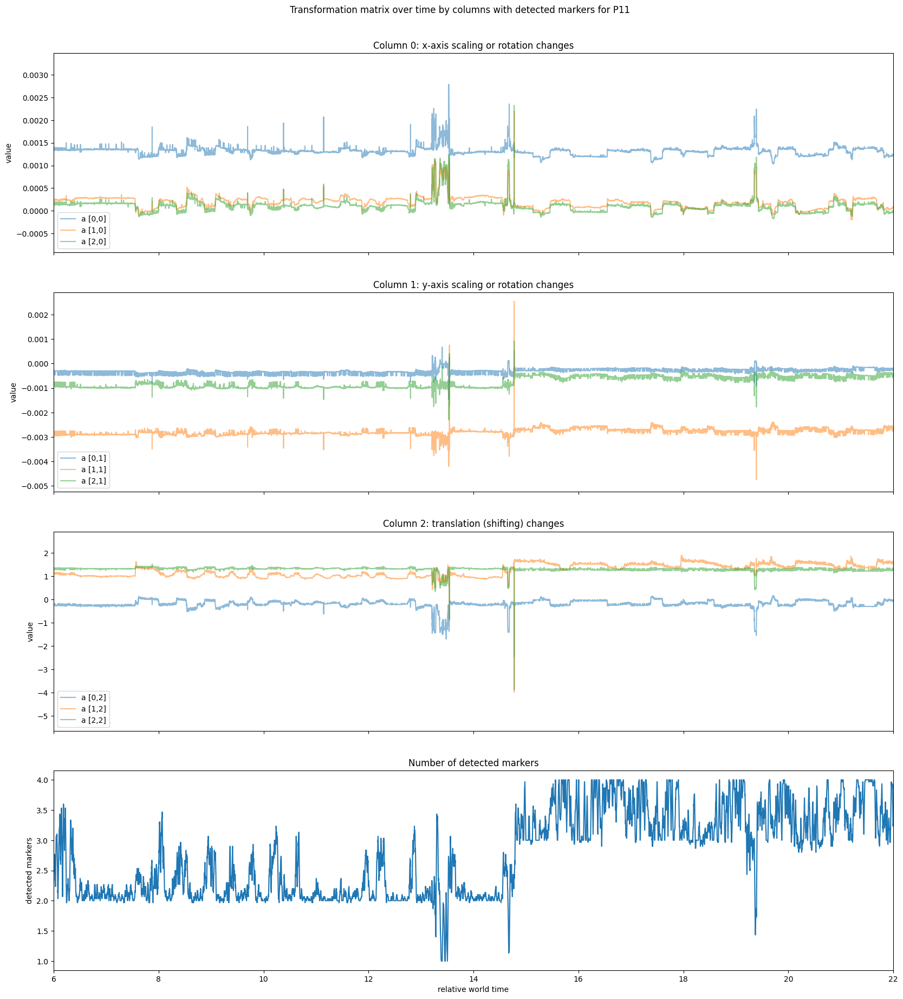

In [21]:
# Plot each element over time (by matrix cols) + detected markers
p11_surf_pos_df_expanded['num_detected_markers_smooth'] = p11_surf_pos_df_expanded['num_detected_markers'].rolling(window=30).mean()
fig, axs = plt.subplots(4, 1, figsize=(20, 22), sharex=True)
subtitle = [
    'x-axis scaling or rotation changes',
    'y-axis scaling or rotation changes',
    'translation (shifting) changes',
]

for j in range(3):
    for i in range(3):
        axs[j].plot(p11_surf_pos_df_expanded['world_relative_time'], p11_surf_pos_df_expanded[f'img_to_surf_trans_{i}{j}'], alpha=0.5,  label=f'a [{i},{j}]')

    axs[j].set_title(f'Column {j}: {subtitle[j]}')
    axs[j].set_ylabel('value')
    axs[j].legend(loc='lower left')

axs[j+1].plot(p11_surf_pos_df_expanded['world_relative_time'], p11_surf_pos_df_expanded['num_detected_markers_smooth'])
axs[j+1].set_title('Number of detected markers')
axs[j+1].set_ylabel('detected markers')

plt.suptitle('Transformation matrix over time by columns with detected markers for P11', y=0.92)
plt.xlabel('relative world time')
plt.xlim(x_lowerlim, x_upperlim)
plt.show()


COMMENTS
+ Column 2: element a[1,2] stands for shifts on the y-axis. The value has a clear step-like increse after the artifact (looking at the researcher)
+ Column 2: element a[2,2] has a dropping spike in correspondance of the step-like increse of a[1,2]
+  After the artifact, marker detection clearly gets better (from btw 2-3 to 3-4 markers)

PROJECTIVE TRANSFORMATIONS or HOMOGRAPHY:  
Affine transformations which don't have standard last row[0,0,1]  
They allow perspective distortion transformations  
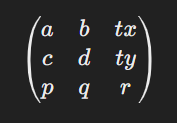  
p and q: introduce perspective transformations, simulating a 3d-space  
r: scales the entire matrix  
https://en.wikipedia.org/wiki/Homography

--> CHECK SURFACE POSITION
--> +VIDEO ON PUPIL CORE (where is the surface detected?)

SOLVED: Eye glasses positioned low on participant's face. World camera was pointing too low to detect the upper surface markers. 